# Numerical verification of error bounds

This notebook presents the code used for numerical verification of the error bounds derived for two low-rank appproximation methods: classical Nystrom approximation and Quantum Principal Component Analysis (qPCA). 

The notebook is organized as follows: first part presents postprocessing of the data (included in folder 'Data-Error-bounds') and genenrates the figures from the paper. The second part presents the code used to generate the data.  


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import GPy
from scipy.optimize import curve_fit
import pickle


## Loading the data

In [2]:
# loading the data:
f2 = open('Data-Error-bounds/test_matrix_list.pickle', 'rb')
test_matrix_list = pickle.load(f2)
f2.close()
#check: 
len(test_matrix_list)

#Nystrom errors
f=open('Data-Error-bounds/Nystrom_error.pickle','rb')
error_Nystrom = pickle.load( f)
f.close()

#QPCA errors
f=open('Data-Error-bounds/QPE-m_error.pickle','rb')
[error_QPE, m_QPE]  = pickle.load(f)
f.close()


In [3]:
from error_bounds_plotting import make_error_plots

In [4]:
de = 0.01
n = 1000
m = np.linspace(1, n, n)
k = np.arange(1, 41)

In [5]:
m_QPE[:, 0]

array([   1.,  290.,  386.,  456.,  513.,  564.,  610.,  652.,  692.,
        729.,  765.,  799.,  831.,  863.,  893.,  923.,  953., 1000.,
       1000., 1000., 1000., 1000., 1000., 1000., 1000., 1000., 1000.,
       1000., 1000., 1000., 1000., 1000., 1000., 1000., 1000., 1000.,
       1000., 1000., 1000., 1000.])

### Plots for appendices

[0.9999867  1.99716647]
saving the fig


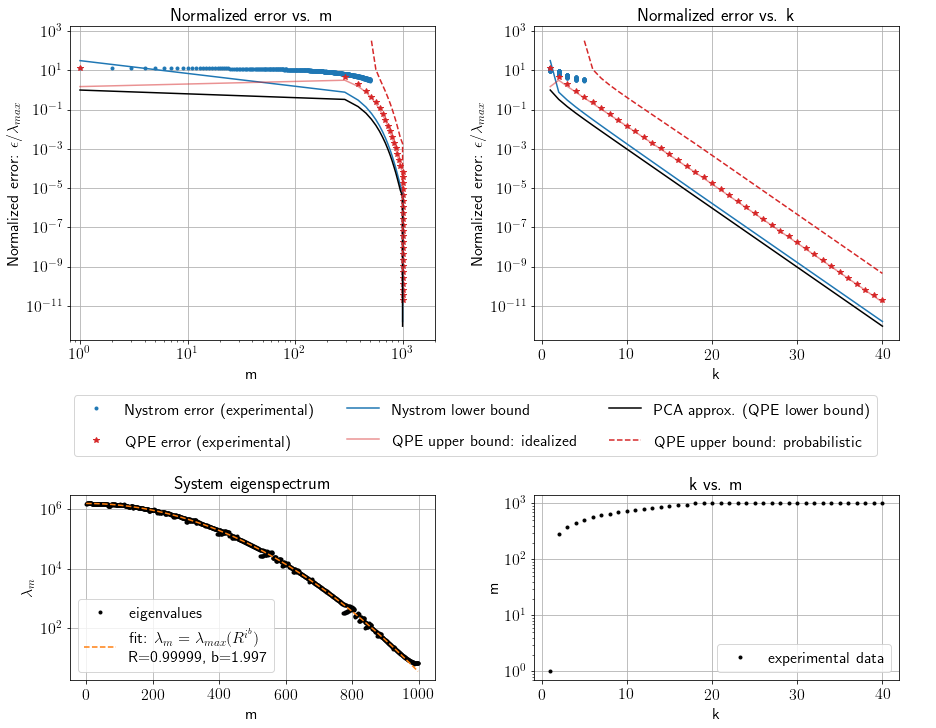

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  1000.0000000001357


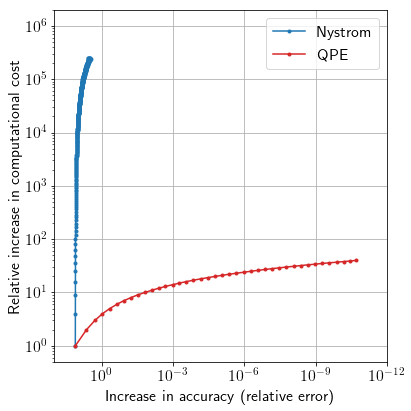

In [7]:
fig_well_conditioned, fig_cost = make_error_plots(test_matrix_list[0], 
                                                  error_Nystrom[:500, 0], 
                                                  error_QPE[:, 0], 
                                                     m , m_QPE[:, 0], k, 
                                                    suptitle = None, 
                                                     savepath = 'Figures/8_error-bounds-1.pdf' )

[0.99897371 1.93279681]
saving the fig


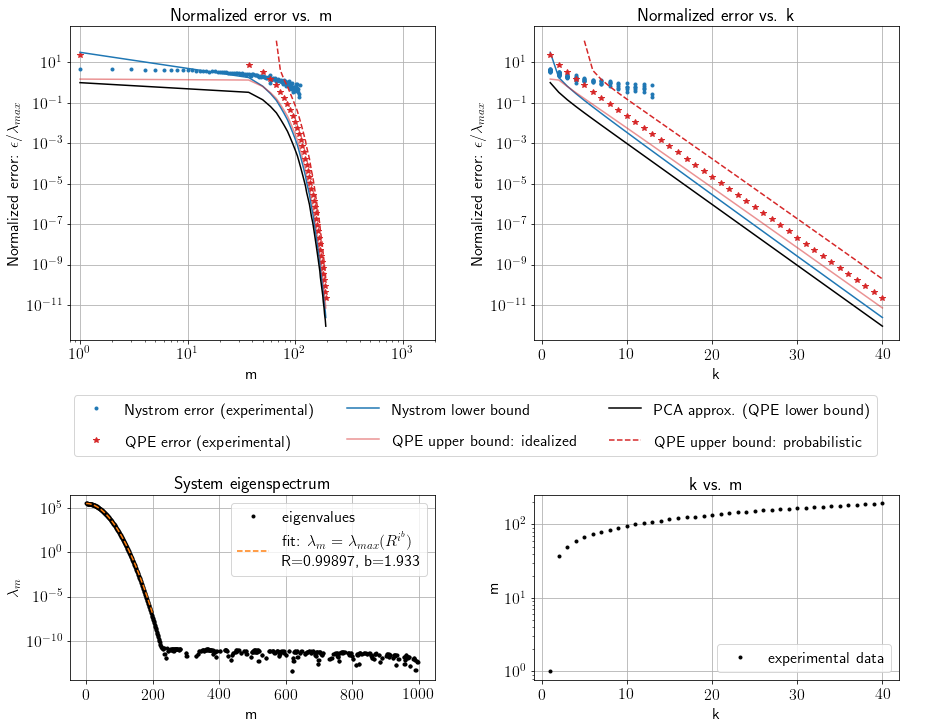

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  28858873237.119812


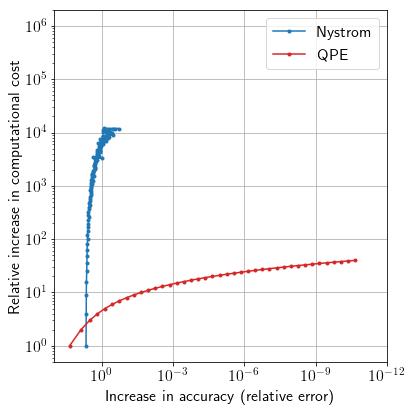

In [8]:
fig_ill_conditioned, fig_cost_2 = make_error_plots(test_matrix_list[22], error_Nystrom[:110, 22], error_QPE[:, 22], 
                                 m[:-2] , m_QPE[:, 22], k, 
                suptitle = None, 
                savepath = 'Figures/9_error-bounds-2.pdf')

saving the fig


<Figure size 864x792 with 0 Axes>

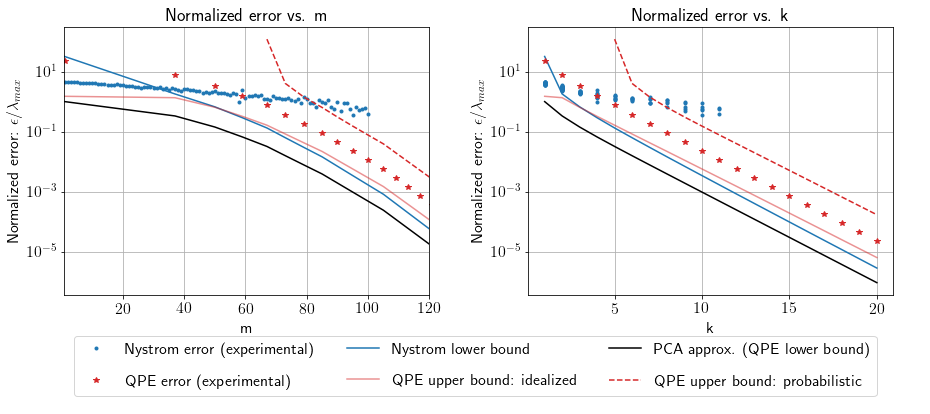

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  28858873237.119812


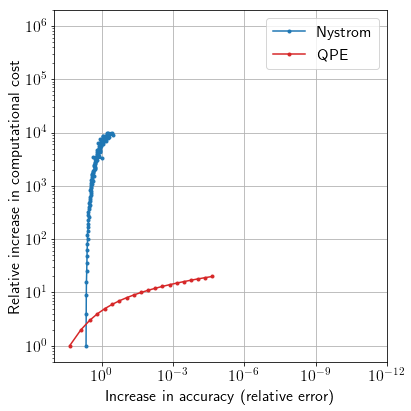

In [10]:
fig_well_conditioned_0, fig_cost_0 = make_error_plots(test_matrix_list[22], error_Nystrom[:100, 22], 
                                                  error_QPE[:20, 22], 
                                 m[:100] , m_QPE[:20, 22], k[:20],loglog = False, four_plots = False,
                suptitle = None,#'Numerical verification of the error bounds: system with mild eigenspectrum')#,
    savepath = 'Figures/3_Bounds.pdf')

saving the fig


<Figure size 864x792 with 0 Axes>

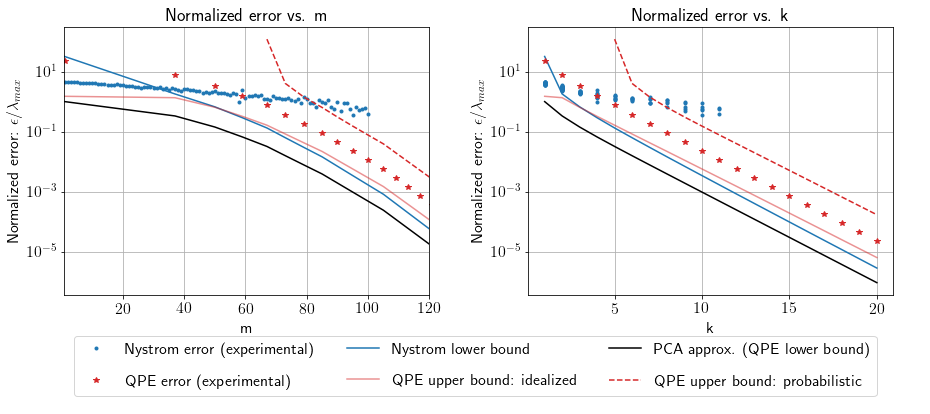

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  28858873237.119812


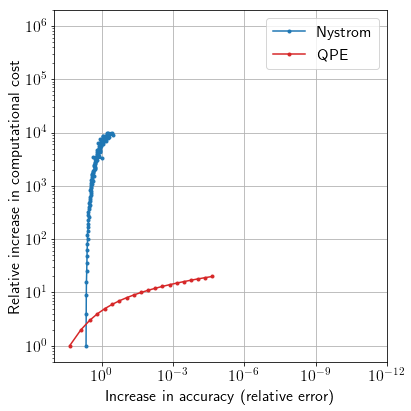

In [12]:
fig_well_conditioned, fig_cost = make_error_plots(test_matrix_list[22], error_Nystrom[:100, 22], 
                                                  error_QPE[:20, 22], 
                                 m[:100] , m_QPE[:20, 22], k[:20],loglog = False, four_plots = False,
                                                  suptitle = None,
                #suptitle = 'Numerical verification of the error bounds: system with mild eigenspectrum')#,
    savepath = 'Figures/3_Bounds_summary.pdf')

# END

In [ ]:
from textwrap import wrap
from scipy.interpolate import interp1d
from matplotlib import gridspec
de = 0.01


def func(x, r, b ):
    '''
    function for interpolating the
    eigenspectrum decay
    '''
    
    
    lmax = x[0]
    xtemp = x[1]
    return  lmax* r ** xtemp**b

R = []
b = []


def make_error_plots(matrix, error_N, error_QPE, m , m_QPE, k, 
                     suptitle = 'Numerical verification of the error bounds',
                     split_eigs = False, savepath = None, loglog = True, four_plots = True):
    #    global lmax
    #matrix_list = mat_benchmarks_list
    #error_N = error_Nystrom_b
    #error_Q = error_QPE_p
    #m_QPE_b = m_QPE_p
    n = matrix.shape[0]

    eig = np.linalg.eigvals(matrix)
    eig = eig.real
    eig_max = np.max(eig)
    cut_indx = np.max(np.where((eig/eig_max)>1e-13))
    print(cut_indx)

    fig = plt.figure(figsize = (12, 11))
    
    gs = gridspec.GridSpec(2, 2, height_ratios=[1.7, 1]) 
    
    if not four_plots:
        gs = gridspec.GridSpec(1, 2) 
        fig = plt.figure(figsize = (12, 6))
       
    
    ############
    #1) ERROR VS M
    ###########

    ax1 = fig.add_subplot(gs[0])
    if loglog:
        if split_eigs:
            ax1.loglog(m[:cut_indx], error_N[:cut_indx]/eig_max, 'C0.',
                         label = 'Nystrom error experimental, well-conditioned eigenmodes')
            ax1.loglog(m[cut_indx:], error_N[cut_indx:]/eig_max, 'g.',
                         label = 'Nystrom error experimental, ill-conditioned eigenmodes')
        else:
            ax1.loglog(m, error_N/eig_max, 'C0.',
                 label = 'Nystrom error (experimental)')
        #QPE
        ax1.loglog(m_QPE, error_QPE/eig_max,'*C3', label = 'QPE error (experimental)')#, marker = '.')


        ax1.loglog(m_QPE, bound_nystrom_wang(m_QPE, n, k), '-',  
               c = 'C0', label = 'Nystrom lower bound')

        ax1.loglog(m_QPE, bound_custom_simple(de, m_QPE, n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: idealized')

        ax1.loglog(m_QPE, PCA(k)*np.ones(m_QPE.shape), 'k-', label = 'PCA approx. (QPE lower bound)')


        #CUTTING-OFF EIGENMODES THAT WERE ILL CONDITIONED (CAPPING THE KAPPA)

        if min(bound_custom(de, m_QPE, n, k )<1e-12):
            bd = np.where(bound_custom(de, m_QPE, n, k )<1e-12) 
            bd = np.max(bd)+1
        else:
            bd = 0
        xm = m_QPE
        ax1.loglog(xm[bd:], bound_custom(de, m_QPE, n, k )[bd:],'--',c = 'C3',
                   label = 'QPE upper bound: probabilistic')
        plt.xlim([0.8, 2000])
    else:
        if split_eigs:
            ax1.semilogy(m[:cut_indx], error_N[:cut_indx]/eig_max, 'C0.',
                         label = 'Nystrom error experimental, well-conditioned eigenmodes')
            ax1.semilogy(m[cut_indx:], error_N[cut_indx:]/eig_max, 'g.',
                         label = 'Nystrom error experimental, ill-conditioned eigenmodes')
        else:
            ax1.semilogy(m, error_N/eig_max, 'C0.',
                 label = 'Nystrom error (experimental)')
        #QPE
        ax1.semilogy(m_QPE, error_QPE/eig_max,'*C3', label = 'QPE error (experimental)')#, marker = '.')


        ax1.semilogy(m_QPE, bound_nystrom_wang(m_QPE, n, k), '-',  
               c = 'C0', label = 'Nystrom lower bound')

        ax1.semilogy(m_QPE, bound_custom_simple(de, m_QPE, n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: idealized')

        ax1.semilogy(m_QPE, PCA(k)*np.ones(m_QPE.shape), 'k-', label = 'PCA approx. (QPE lower bound)')


        #CUTTING-OFF EIGENMODES THAT WERE ILL CONDITIONED (CAPPING THE KAPPA)

        if min(bound_custom(de, m_QPE, n, k ))<1e-12:
            bd = np.where(bound_custom(de, m_QPE, n, k )<1e-12) 
            bd = np.max(bd)+1
        else:
            bd = 1
        xm = m_QPE
        ax1.semilogy(xm[bd:], bound_custom(de, m_QPE, n, k )[bd:],'--',c = 'C3',
                   label = 'QPE upper bound: probabilistic')

        plt.xlim([0.8, 120])

    #COMPARISON ESTIMATED PCA ERROR(K) VS ESTIMATED FROM THE REAL EIGENVALUES
    #plt.loglog(m, eig/eig_max[mat_num], '--k',  label = 'Normalized eigenspectrum ')



    
    plt.xlabel('m')
    plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
    #plt.legend()
    plt.title('Normalized error vs. m')
    plt.grid(True)

    handles, labels = ax1.get_legend_handles_labels()
    labels_wrapped = [ '\n'.join(wrap(l, 50)) for l in labels]
    
    
    
    ##################
    #2) ERROR VS k
    ##################    
    ax2 = fig.add_subplot(gs[1])
    
    m_interp , indices = np.unique(m_QPE, return_index = True)
    k_interp = k[indices]
    k_interpolated = interp1d(m_interp, k_interp, kind='nearest', fill_value='extrapolate')

    if split_eigs:
        ax2.semilogy(k_interpolated(m[:cut_indx]), error_N[:cut_indx]/eig_max, 'C0.',
                     label = 'Nystrom error experimental, well-conditioned eigenmodes')
        ax2.semilogy(k_interpolated(m[cut_indx:]), error_N[cut_indx:]/eig_max, 'g.',
                     label = 'Nystrom error experimental, ill-conditioned eigenmodes')

    else:
        ax2.semilogy(k_interpolated(m), error_N/eig_max, 'C0.',
                     label = 'Nystrom error experimental')
        
        
    ax2.semilogy(k, bound_nystrom_wang(m_QPE, n, k), '-',  c = 'C0', label = 'Nystrom lower bound')
    
    ax2.semilogy(k, error_QPE/eig_max,'C3*', label = 'QPE error (experimental)')
    ax2.semilogy(k, bound_custom_simple(de, m_QPE, n, k ), '-', c = 'C3',alpha =0.5, 
                 label = 'QPE upper bound: idealized')

    bd = np.where(bound_custom(de, m_QPE, n, k )<1e-12)
    bd = np.max(bd)+1

    ax2.semilogy(k[bd:], bound_custom(de, m_QPE, n, k )[bd:],'--',c = 'C3',label = 'QPE upper bound: probabilistic')
    ax2.semilogy(k, PCA(k)*np.ones(m_QPE.shape), 'k-', label = 'PCA approximate (QPE lower bound)')
    

    #NYSTROM BOUND CALCULATED FROM THE ACTUAL EIGENVALUES INSTEAD OF THE qpe ESTIMATE 1/(2^K-1) 
    #(BUT THEY ARE REALLY CLOSE)
    '''
    eig_m1 = interp1d(m, eig, kind='nearest', fill_value='extrapolate')    
    plt.semilogy(k, bound_nystrom_wang_corrected(m_QPE[:, mat_num], n, eig_m1(m_QPE[:, mat_num]))/eig_max[mat_num],
                 '-*',  c = 'C0', label = 'Nystrom lower bound correccted')
    '''
    
    plt.xlabel('k')
    plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
    plt.title('Normalized error vs. k')
    plt.grid(True)
    
    
    
    ##################
    #3) EIGENSPECTRUM VS M
    ##################
    if four_plots:
        ax3 = fig.add_subplot(gs[2])
        if split_eigs:
            ax3.semilogy(eig[:cut_indx], 'C0.')
            ax3.semilogy(range(cut_indx, 1000), eig[cut_indx:], 'g.')
        else:
            ax3.semilogy(eig, 'k.', label = 'eigenvalues')
        #plt.semilogy(np.arange(1, 1001) , eig_max[mat_num]*0.998**np.arange(1, 1001))


        #iNTERPOLATING THEORETICAL EIGENVALUE DECAY - fitting THE R value
        xtemp = np.arange(0, cut_indx)
        lmax = eig_max# * np.ones(xtemp.shape)
        x_f_vars =  [lmax, xtemp]
        popt, pcov = curve_fit(func,x_f_vars, eig[:cut_indx])
        R.append(popt[0])
        b.append(popt[1])     

        ax3.semilogy(xtemp, func(x_f_vars, *popt), 'C1--', 
                     label = 'fit: '+r'$\lambda_{m} = \lambda_{max}(R^{{i}^b})$ ' +'\n'+ 
                     'R=%1.5f,  b=%5.3f' % tuple(popt))

        print(popt)
        plt.legend()
        plt.xlabel('m')
        plt.ylabel(r'$\lambda_{m}$')
        plt.title('System eigenspectrum')    
        plt.grid(True)

        ##################
        #3) m VS k
        ##################

        ax4 = fig.add_subplot(gs[3])
        ax4.semilogy(k, m_QPE, '.k', label = 'experimental data')
        plt.title('k vs. m')
        plt.ylabel('m')
        plt.xlabel('k')
        plt.legend()
        plt.grid(True)

        #fig.tight_layout() 
    
        plt.subplots_adjust( top = 0.95, wspace = 0.27, hspace =.62, right = 0.98, left = 0.02)
        lgnd =  fig.legend(handles, labels_wrapped, loc = 9, bbox_to_anchor=(0.55, 0.43), labelspacing = 1., ncol = 3)

    else:    
        plt.subplots_adjust( top = 0.92, wspace = 0.27, bottom =.3, right = 0.98, left = 0.02)
        lgnd =  fig.legend(handles, labels_wrapped, loc = 9, bbox_to_anchor=(0.55, 0.2), labelspacing = 1., ncol = 3)

        
    #fig.legend(handles, labels_wrapped, (.12, .36), labelspacing = 1., ncol = 3)#'upper left')
    big_title = fig.suptitle(suptitle, y= 1.05)
    
    if savepath is not None:
        fig.savefig(savepath, bbox_extra_artists=[lgnd, big_title], bbox_inches='tight')
        print('saving the fig')
    
    plt.show()

    print('Verifying Nystrom error\n')
    print('Sum diagonal Knn^[-1] @ Knn: ', np.sum(np.linalg.inv(matrix)@matrix))


    fig2= plt.figure(figsize = (6, 6))
    plt.loglog(error_N/eig_max, m**2.,'.-C0', label = 'Nystrom')
    plt.loglog( error_QPE/eig_max, k, '.-C3', label = 'QPE')
    plt.ylabel('Relative increase in computational cost')
    plt.xlabel('Increase in accuracy (relative error)')
    plt.xlim([1e2, 1e-12])
    plt.ylim([0.5, 2e6])
    plt.grid(True)
    plt.legend()
    fig2.tight_layout()
    plt.show()

    
    return fig, fig2
#last sample  - matrix is singular


# Definitions

In [6]:
de = 0.01

m = np.linspace(1, 1000, 1000)
n = 1000.
k = 20

def bound_custom(de, m, n, k ):
    return(1./(2.**k-1.) + np.sqrt(m)/(2.**(k - np.log(2.+1./(2*de)))-2))


def bound_nystrom(de, m, n, k ):
    return(1./(2.**k-1.) + 2*np.sqrt(2)*n*np.sqrt(1+np.sqrt(np.log(2./de)*(1-m/n))))

def bound_nystrom_wang(m, n, k):
    return(1./(2.**k-1.))*(np.sqrt(1.+(n+m)/m))

def bound_nystrom_wang_corrected(m, n, eig_m1):
    return(eig_m1*(np.sqrt(1.+(n+m)/m)))


def bound_custom_simple(de, m, n, k ):
    return(1./(2.**k-1.))*(1. + np.sqrt(m)/2.)

def PCA(k):
    return(1./(2.**k-1.))

## Preliminary comparison of the bounds
 
 just to check the order of magnitude

Text(0.5, 0, 'included eigenmodes m')

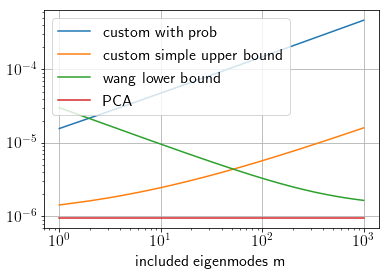

In [3]:
plt.loglog(m, bound_custom(de, m, n, k ), label = 'custom with prob')
plt.loglog(m, bound_custom_simple(de, m, n, k ), label = 'custom simple upper bound')
plt.loglog(m, bound_nystrom_wang(m, n, k), label = 'wang lower bound')
plt.loglog(m, PCA(k)*np.ones(m.shape), label = 'PCA')

plt.legend()
plt.grid(True)
#plt.plot(m, bound_nystrom(de, m, n, k ))

plt.xlabel('included eigenmodes m')

Text(0.5, 0, 'included eigenmodes m')

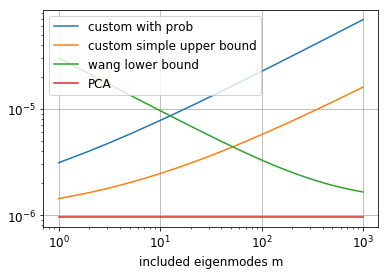

In [5]:
de = 0.4
plt.loglog(m, bound_custom(de, m, n, k ), label = 'custom with prob')
plt.loglog(m, bound_custom_simple(de, m, n, k ), label = 'custom simple upper bound')
plt.loglog(m, bound_nystrom_wang(m, n, k), label = 'wang lower bound')
plt.loglog(m, PCA(k)*np.ones(m.shape), label = 'PCA')

plt.legend()
plt.grid(True)
#plt.plot(m, bound_nystrom(de, m, n, k ))

plt.xlabel('included eigenmodes m')

## Loading test Matrices:

- list of 35 test matrices (5 datasets, 7 kernel settings each)
- generated in notebook 'Data_for_error....' in the same folder


In [5]:
# Data_series 1: 35 Test matrices
f2 = open('Data-Error-bounds/test_matrix_list.pickle', 'rb')
test_matrix_list = pickle.load(f2)
f2.close()
#check: 
len(test_matrix_list)

35

## Generating Error Data

In [5]:
def Nystrom(A, m):
    '''
    a function ocnstructing naive Nystrom approximation
    of a matrix by selecting (at random) a subset of rows and columns
    
    Args:
    A - input matrix np.array
    m - number of rows and columns used for approximation
    '''
    n = len(A)
    nmis = np.random.choice(int(n), int(n-m), replace=False, p=None)
    Knm = np.delete(A,nmis, axis =0)
    Kmm = np.delete(Knm, nmis, axis = 1)
    Approx = Knm.T@np.linalg.inv(Kmm)@Knm    
    return Approx

def QPE_approx(A, k):
    
    '''
    a function emulating the qPCA approximation
    
    Args:
    
    A - input matrix, numpy.array
    k - number of qubits in the eigenvalue register, int 
    '''
    
    
    eig, mu = np.linalg.eig(A)
    eig = eig.real
    #print(eig)
    dk = eig/max(eig)
    #print(dk)
    dk_a = np.floor(dk*(2**k-1)) 
    #print(dk_a)

    dk_a = dk_a/(2**k-1)
    dk_a = dk_a*max(eig)
    #print(dk_a)
    m = len(np.where(dk_a>0)[0])
    
    D = np.diag(dk_a)
    Dapprox = mu@D@mu.T
    
    return Dapprox, m

n = 1000
m = np.linspace(1, n, n)
#A = np.random.rand(n,n)
#A = np.dot(A, A.T) # ensure SPD matrix -> hermitian
k = np.arange(1, 41)


#error_Nystrom = np.zeros((m.size, len(test_matrix_list)))
#error_QPE = np.zeros((k.size, len(test_matrix_list)))

'''
redo_Nystrom = False
if redo_Nystrom:
    #GENERATING NYSTRoM ERROR DATA 
    for mat_num in range(len(test_matrix_list)):
        print('Sample: ', mat_num)
        for i in m:
            error_Nystrom[int(i-1), mat_num] = np.linalg.norm(test_matrix_list[mat_num] - 
                                                             Nystrom(test_matrix_list[mat_num], i), 'fro')

    #f=open('Data-Error-bounds/Nystrom_error_backup.pickle','wb')
    #pickle.dump(error_Nystrom, f)
    #f.close()
'''

"\n#GENERATING NYSTRoM ERROR DATA \nfor mat_num in range(len(test_matrix_list)):\n    print('Sample: ', mat_num)\n    for i in m:\n        error_Nystrom[int(i-1), mat_num] = np.linalg.norm(test_matrix_list[mat_num] - \n                                                         Nystrom(test_matrix_list[mat_num], i), 'fro')\n                                                         \n#f=open('Nystrom_error_backup.pickle','wb')\n#pickle.dump(error_Nystrom, f)\n#f.close()\n"

In [8]:


f=open('Nystrom_error_backup.pickle','rb')
error_Nystrom = pickle.load( f)
f.close()


In [9]:
eig_max  = []

for mat_num in range(len(test_matrix_list)):
    eig_max.append(np.max(np.linalg.eigvals(test_matrix_list[mat_num])))
    print(mat_num)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


In [10]:
m_QPE = np.zeros((k.size, len(test_matrix_list)))
error_QPE = np.zeros((k.size, len(test_matrix_list)))

recalculate = False #safety switch

if recalculate:
    for mat_num in range(len(test_matrix_list)):
        for i in k:
            Aqpetemp, m_QPE[int(i-1), mat_num] = QPE_approx(test_matrix_list[mat_num], i)
            error_QPE[int(i-1), mat_num] = np.linalg.norm(test_matrix_list[mat_num] - Aqpetemp, 'fro')

        print(mat_num)    
    f=open('QPE-m_error_final.pickle','wb')
    pickle.dump([error_QPE, m_QPE], f)
    f.close()


In [21]:


#f=open('QPE-m_error_backup-2.pickle','wb')
#pickle.dump([error_QPE,m_QPE] , f)
#f.close()

In [11]:
#f=open('QPE_error_backup.pickle','wb')
#pickle.dump(error_QPE, f)
#f.close()

#f=open('QPE_error_backup.pickle','rb') # this file is incomplete - 35 mtrices, 40.. ms?
f=open('QPE-m_error_final.pickle','rb')
#pickle.dump([error_QPE, m_QPE], f)
[error_QPE, m_QPE]  = pickle.load(f)
f.close()

In [12]:
error_Nystrom[:, 1].shape

(1000,)

 /home/gawel/anaconda3/envs/MLenv/lib/python3.6/site-packages/numpy/core/numeric.py:538: ComplexWarning:Casting complex values to real discards the imaginary part


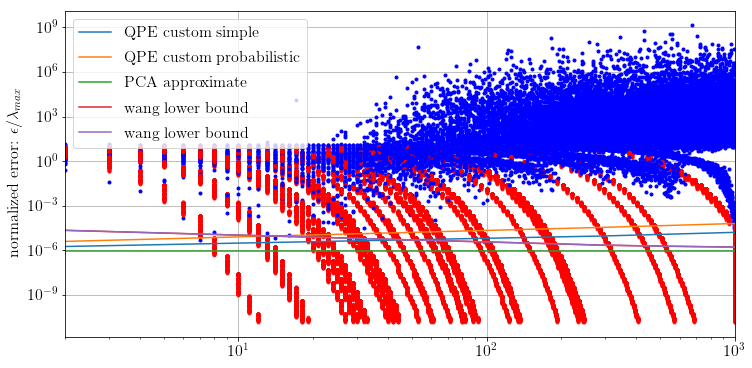

In [10]:
de = 0.6

plt.figure(figsize = (12, 6))

for mat_num in range(len(test_matrix_list)):
    
    plt.loglog(m, error_Nystrom[:, mat_num]/eig_max[mat_num], 'b.')

    plt.loglog(m_QPE[:, mat_num], error_QPE/eig_max, 'r.', alpha = .7)
    
plt.loglog(m_QPE[:, 0], bound_custom_simple(de, m_QPE[:, 0], n, k ), label = 'QPE custom simple')
plt.loglog(m_QPE[:, 0], bound_custom(de, m_QPE[:, 0], n, k ), label = 'QPE custom probabilistic')
plt.loglog(m_QPE[:, 0], PCA(k)*np.ones(m_QPE[:, 0].shape), label = 'PCA approximate')
plt.loglog(m_QPE[:, 0], bound_nystrom_wang(m_QPE[:, 0], n, k), label = 'wang lower bound')
plt.loglog(m_QPE[:, 0], bound_nystrom_wang(m_QPE[:, 0], n, k), label = 'wang lower bound')


plt.xlim([2, 1001])

plt.ylabel('normalized error: '+r'$\epsilon/\lambda_{max}$')
plt.legend()
plt.grid(True)


# 1. Preliminary plots

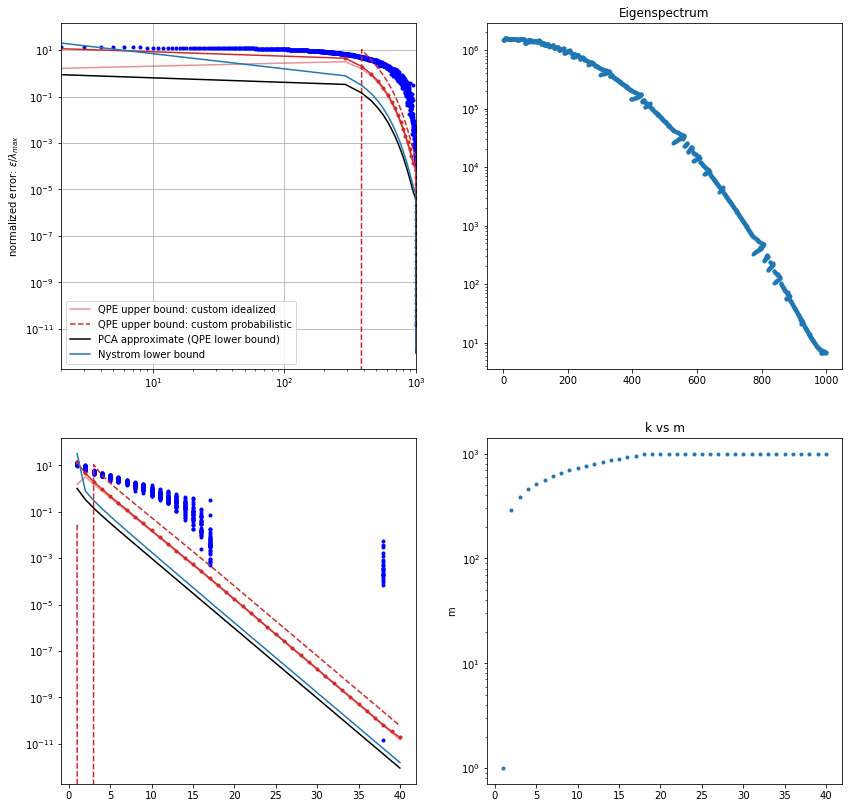

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  1000.0000000001357


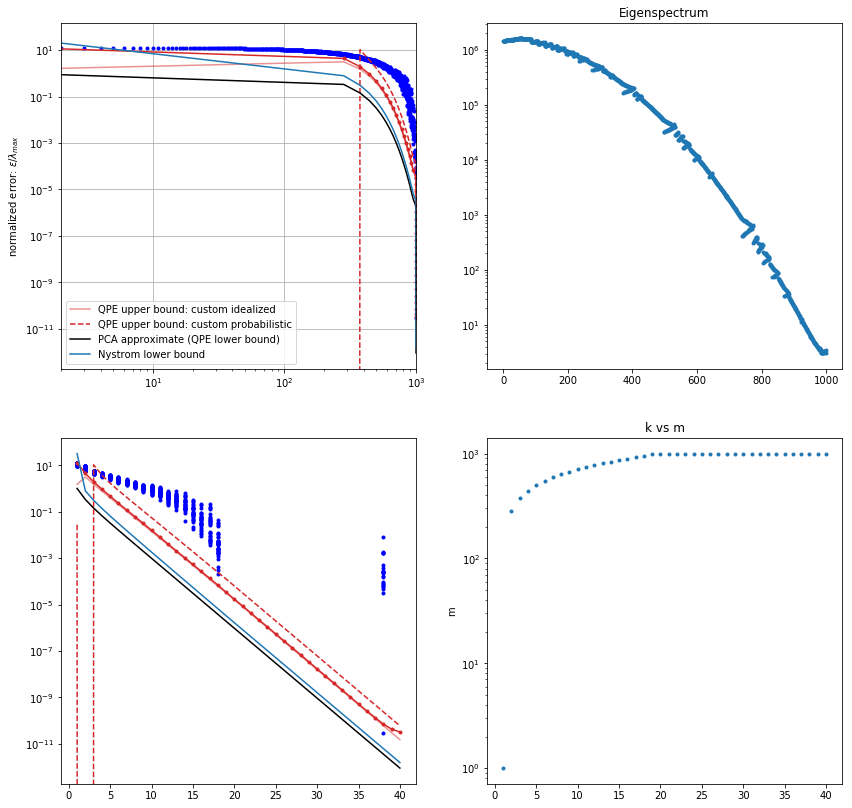

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  1000.0000000001733


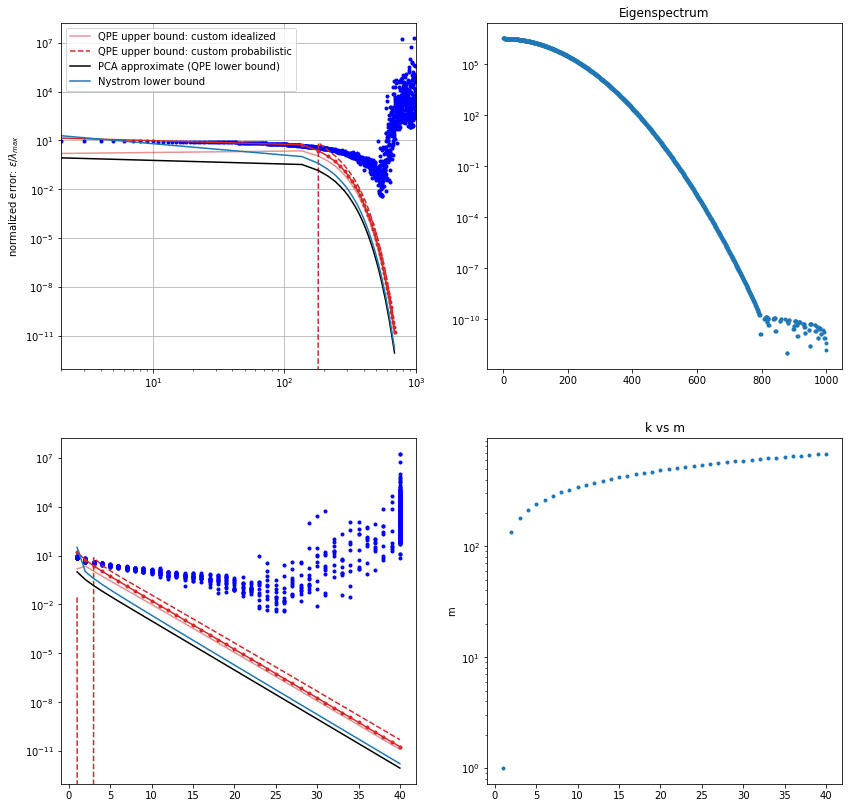

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -26734296112.095127


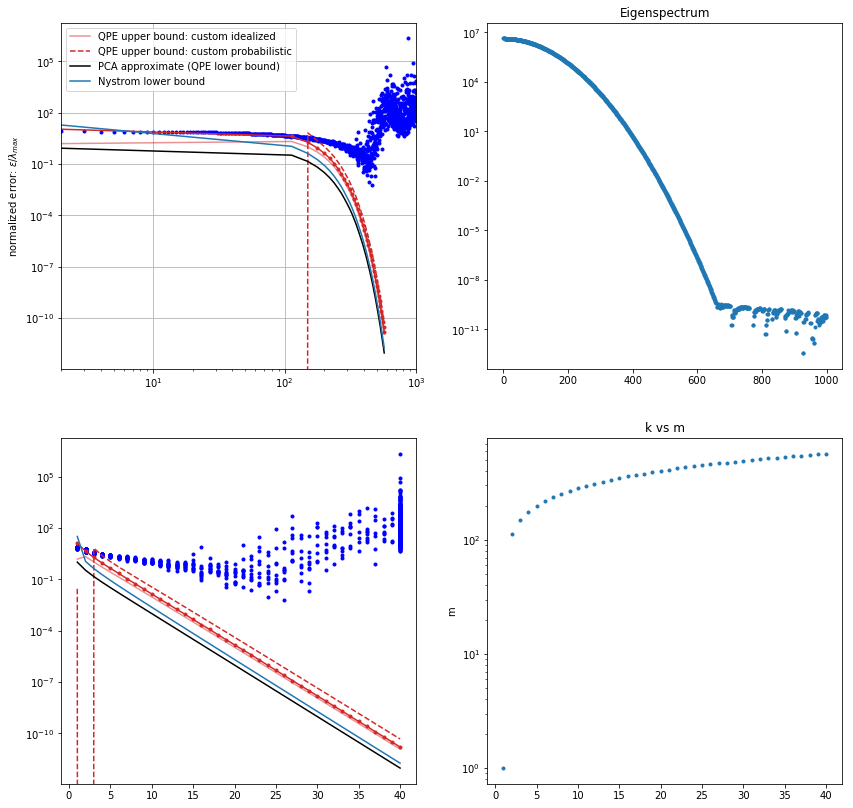

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  7141852401.642898


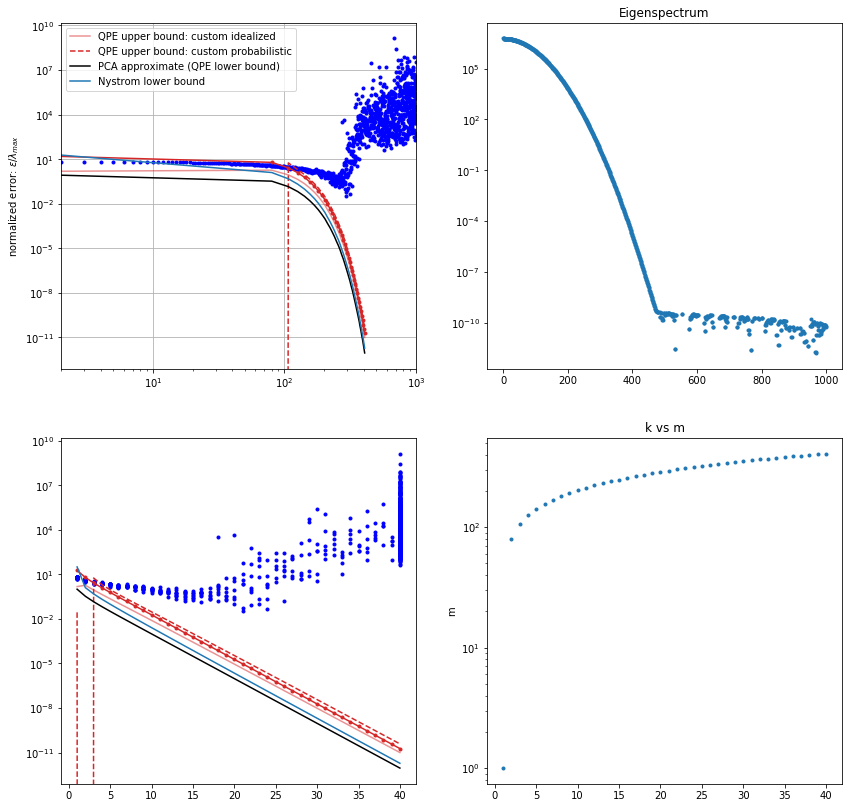

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -11513164734513.219


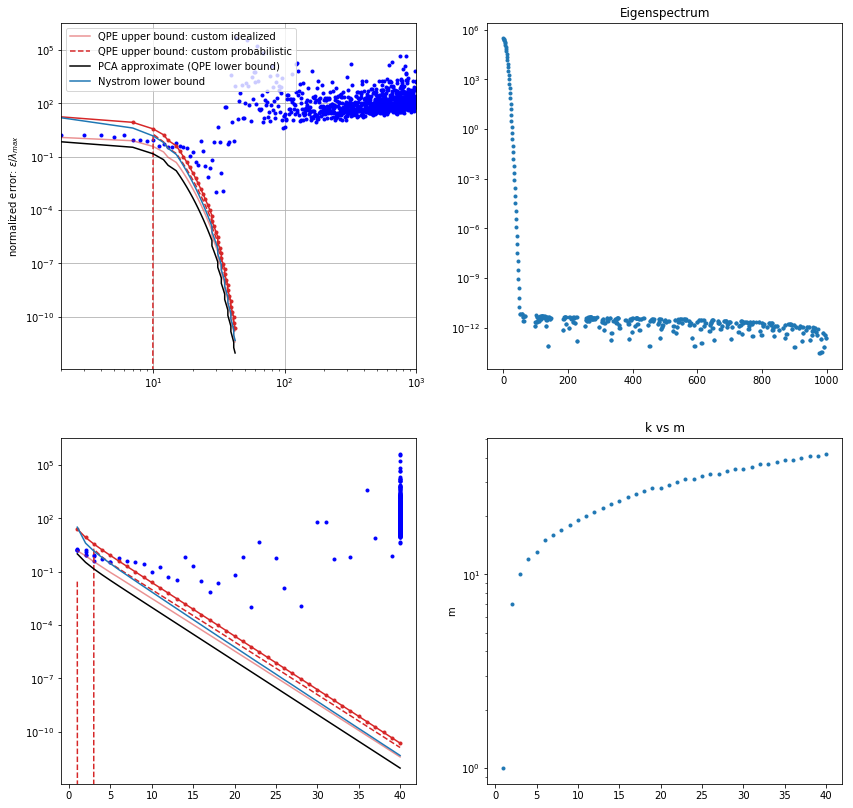

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -35371637626.44356


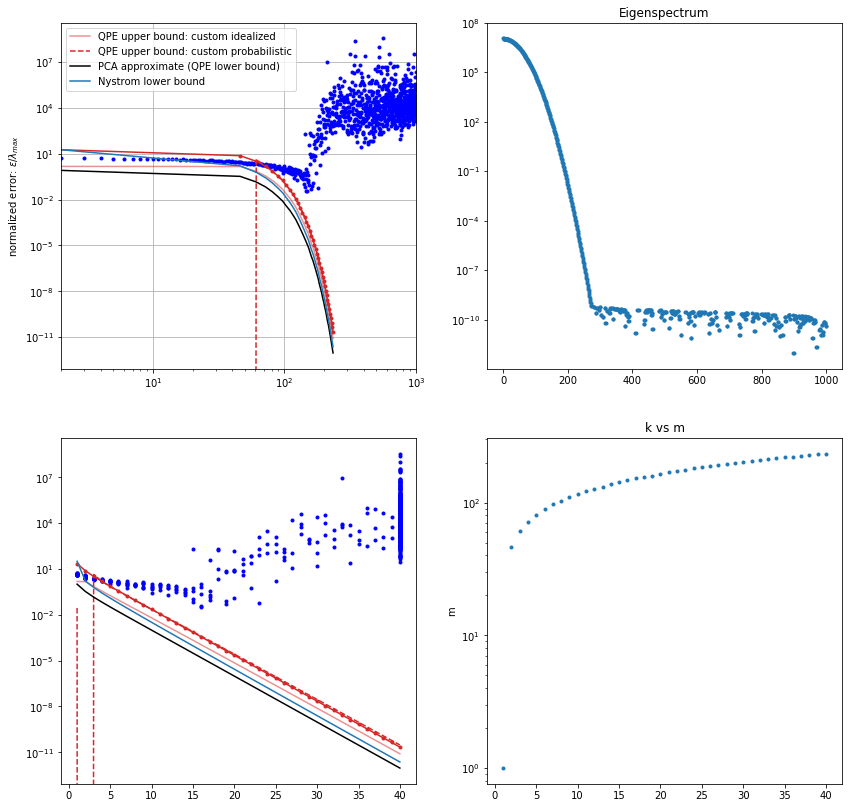

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  913131235881.555


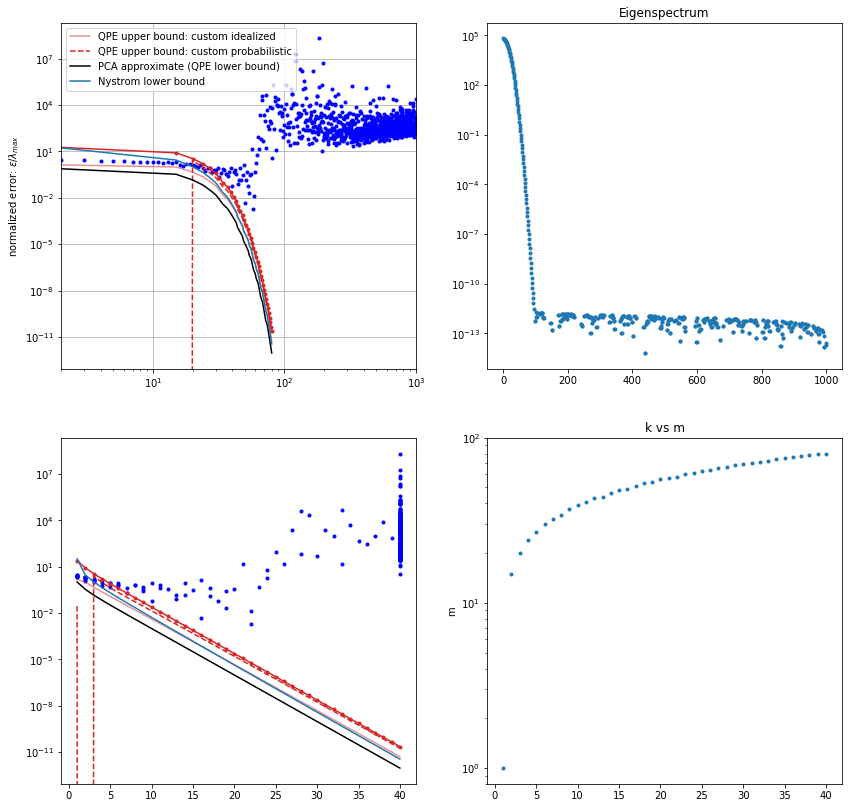

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  562662491618.6937


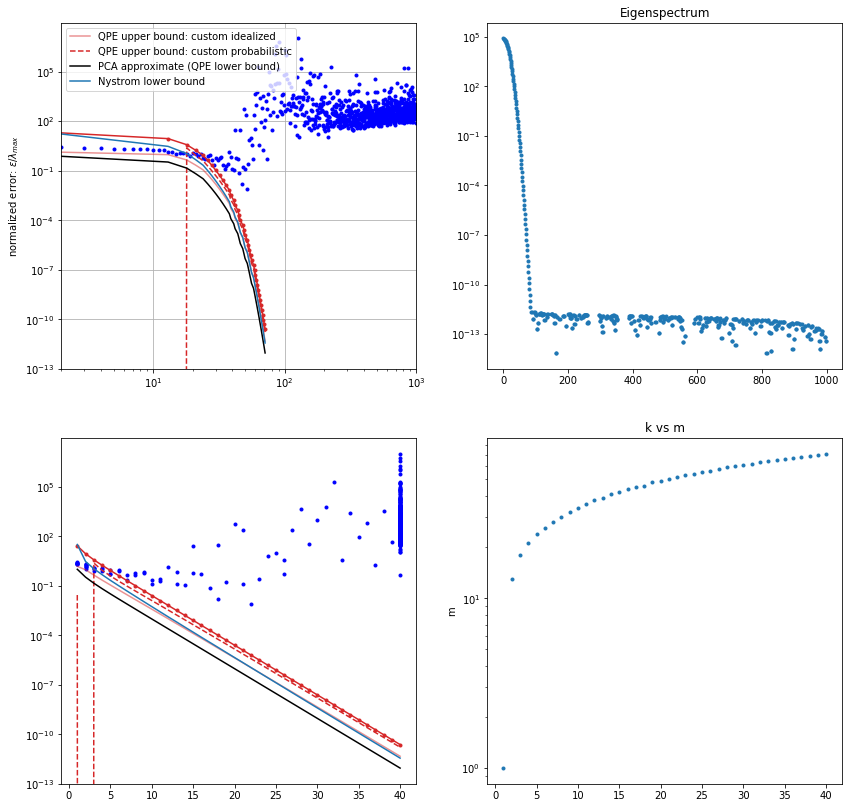

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  4242199784.446073


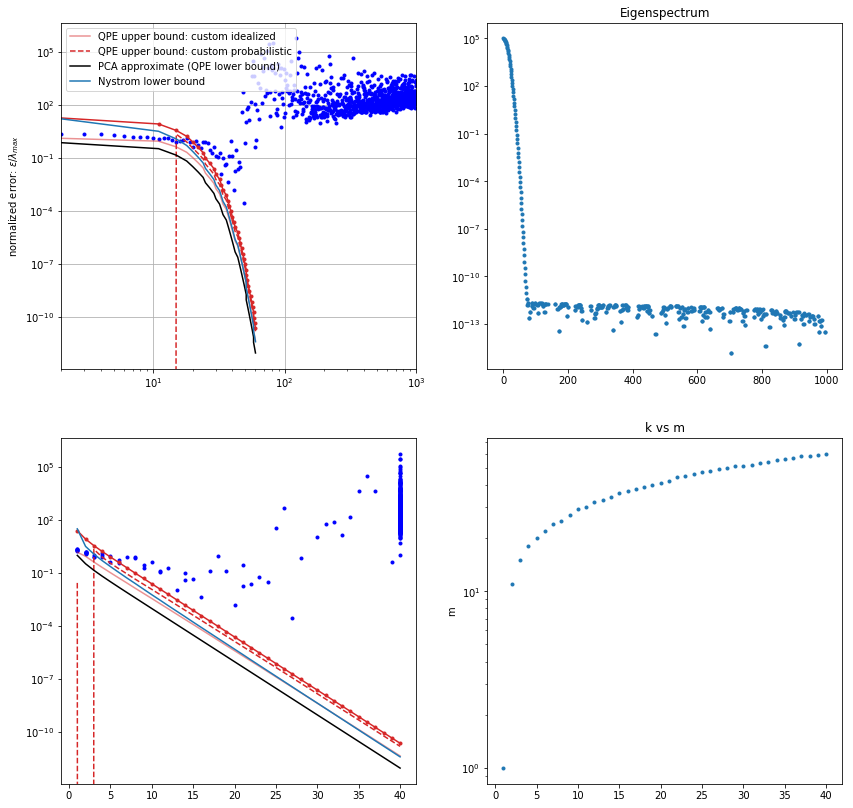

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  4406845147.553244


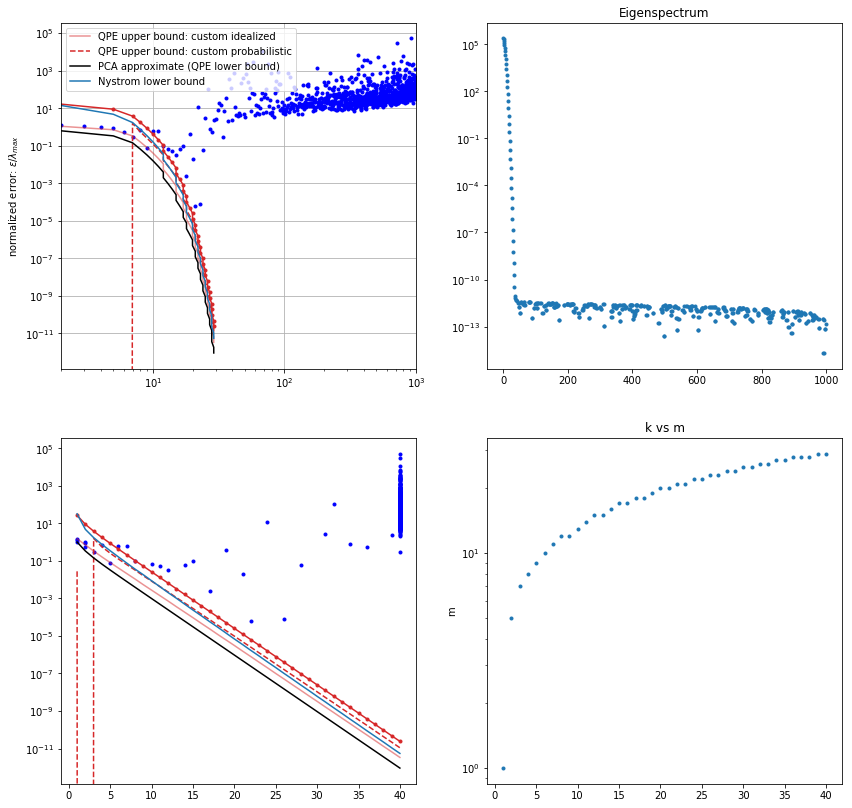

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  4013979879.595219


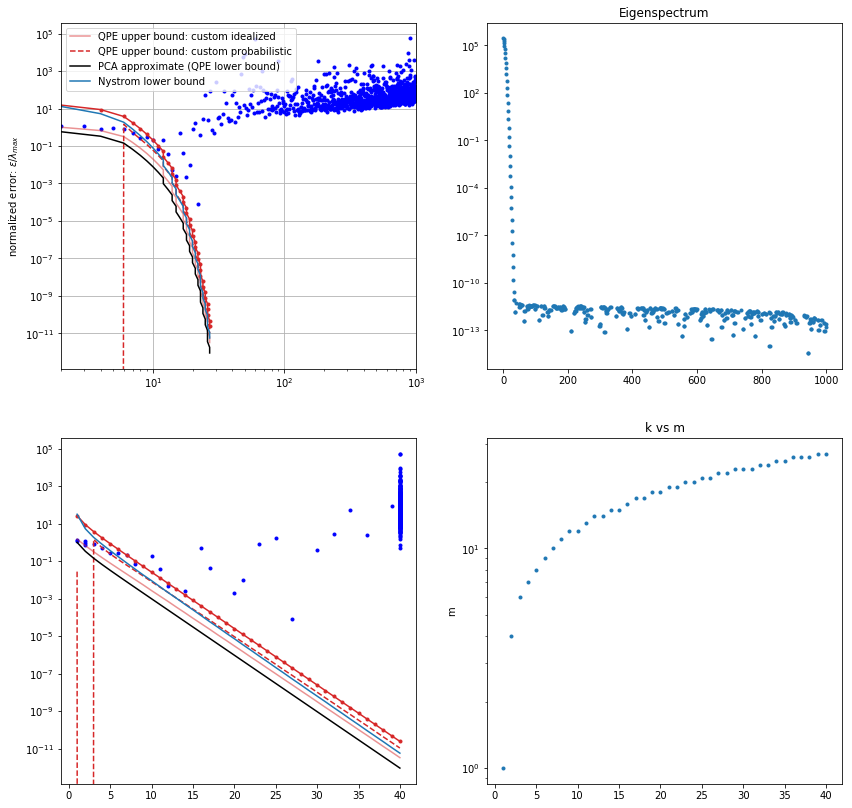

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -789169055.1172398


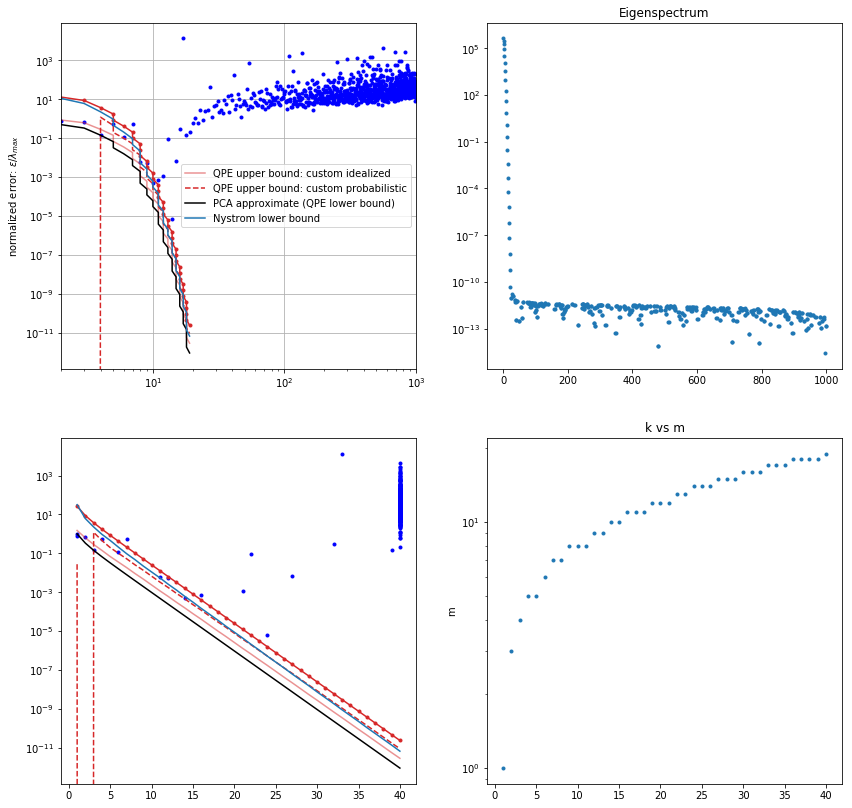

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  395338463.40970075


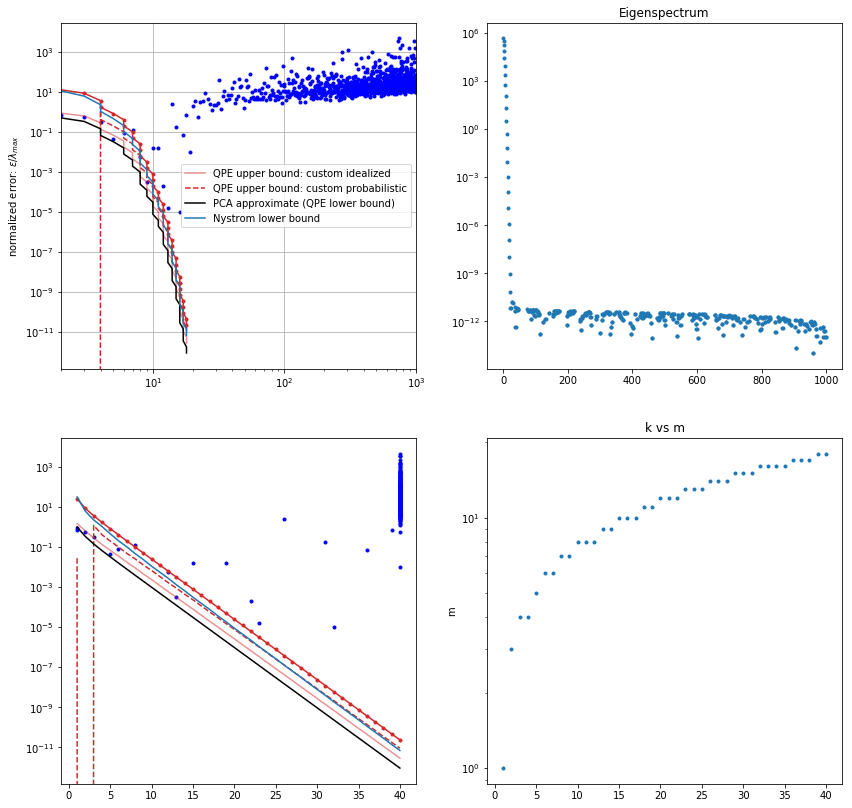

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -10011340.227122486


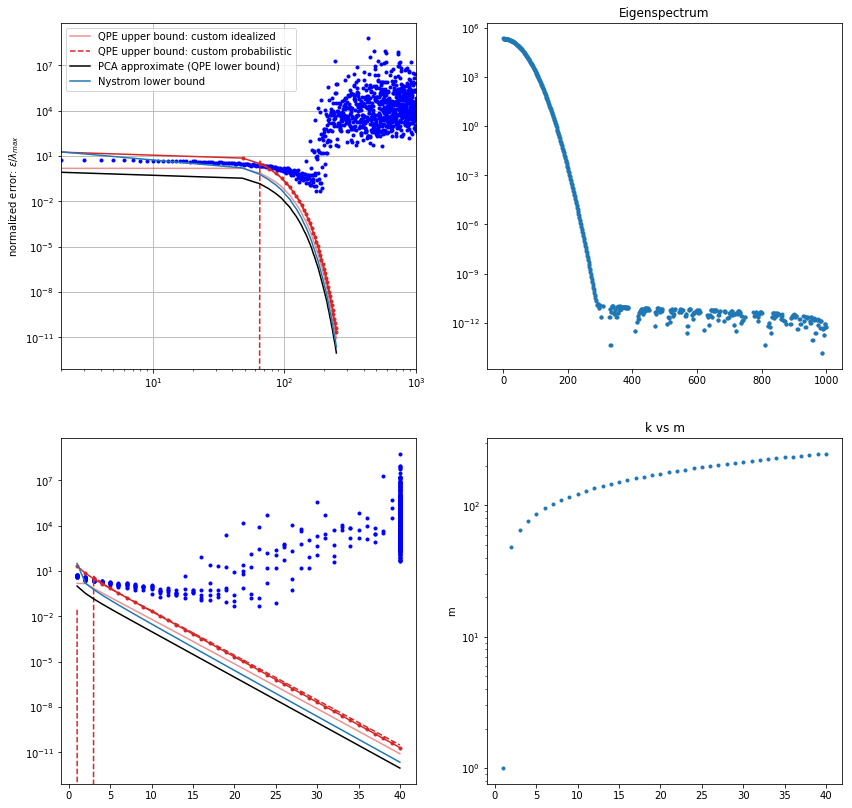

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -103911370019.4153


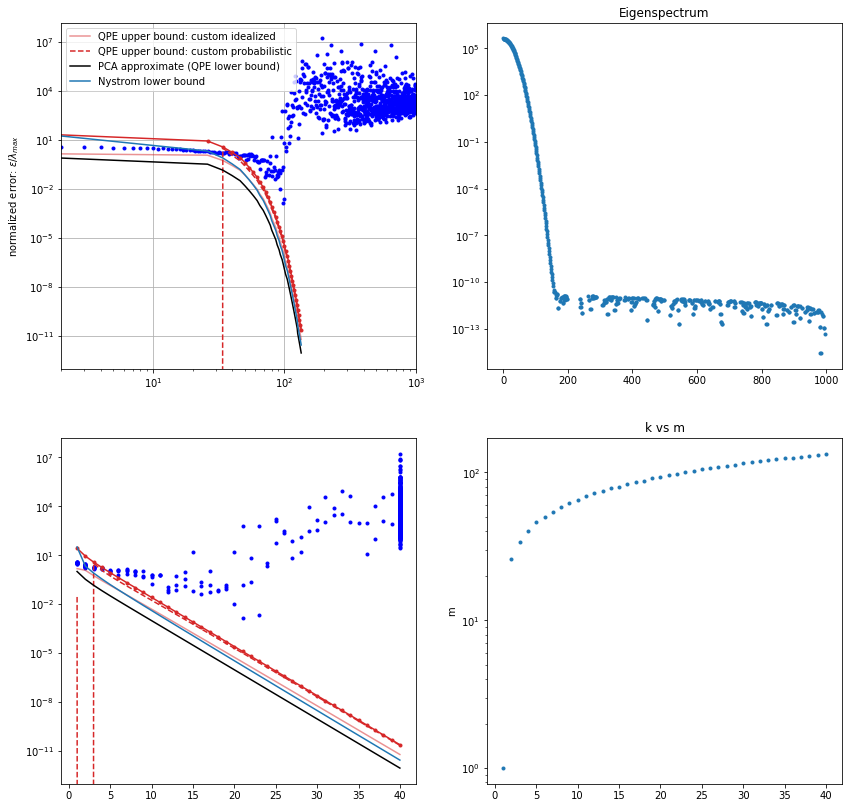

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -37797678391.01881


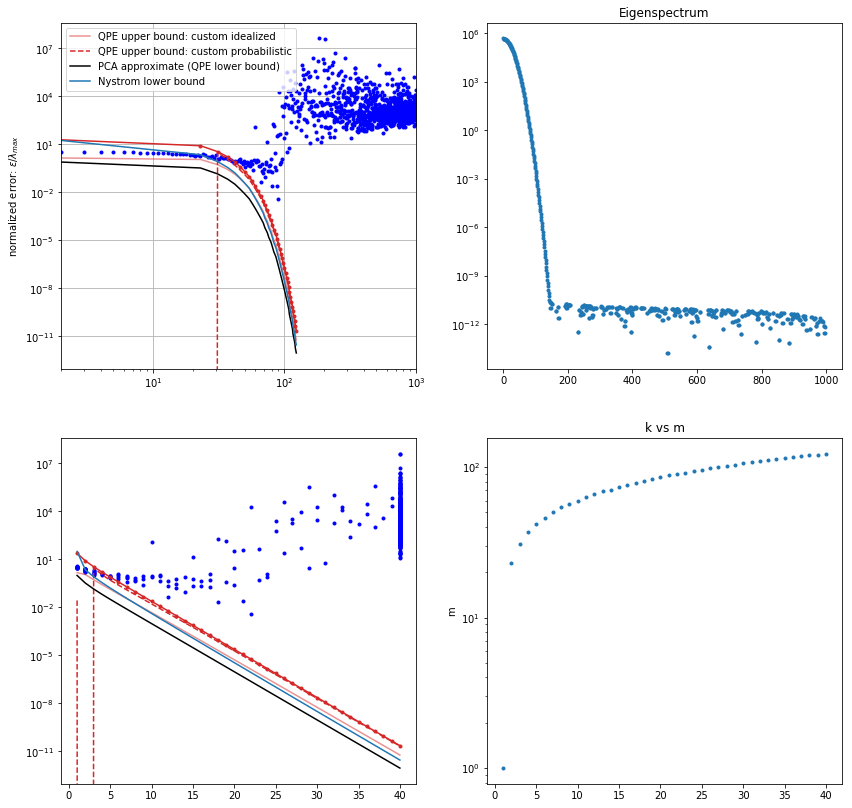

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  65717484948.53257


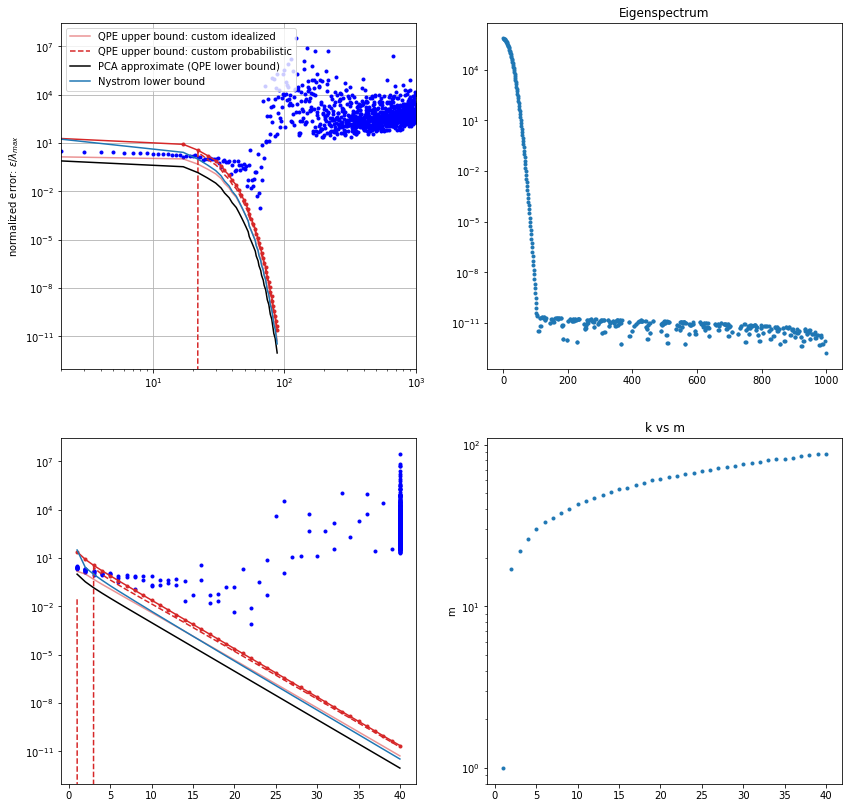

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -61051813325.27559


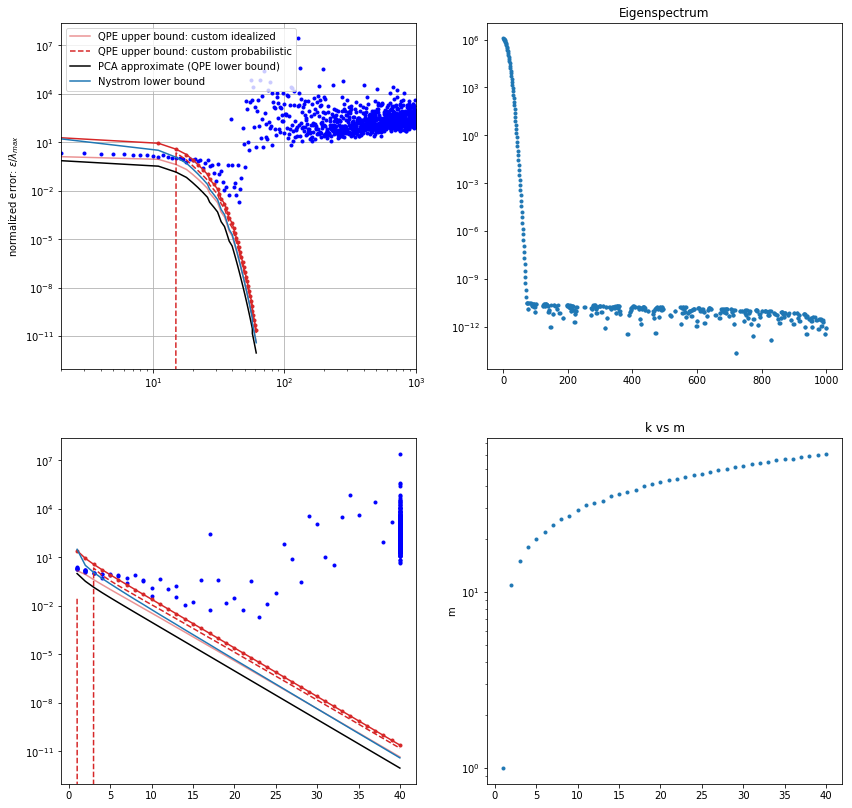

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  151982344880.23505


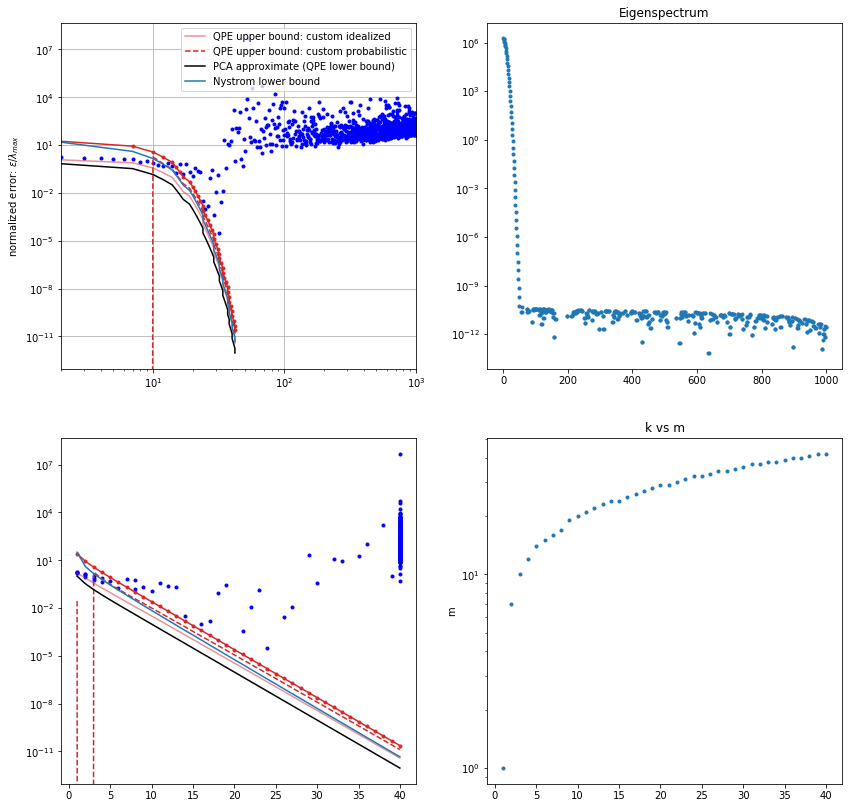

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -3372542105.43679


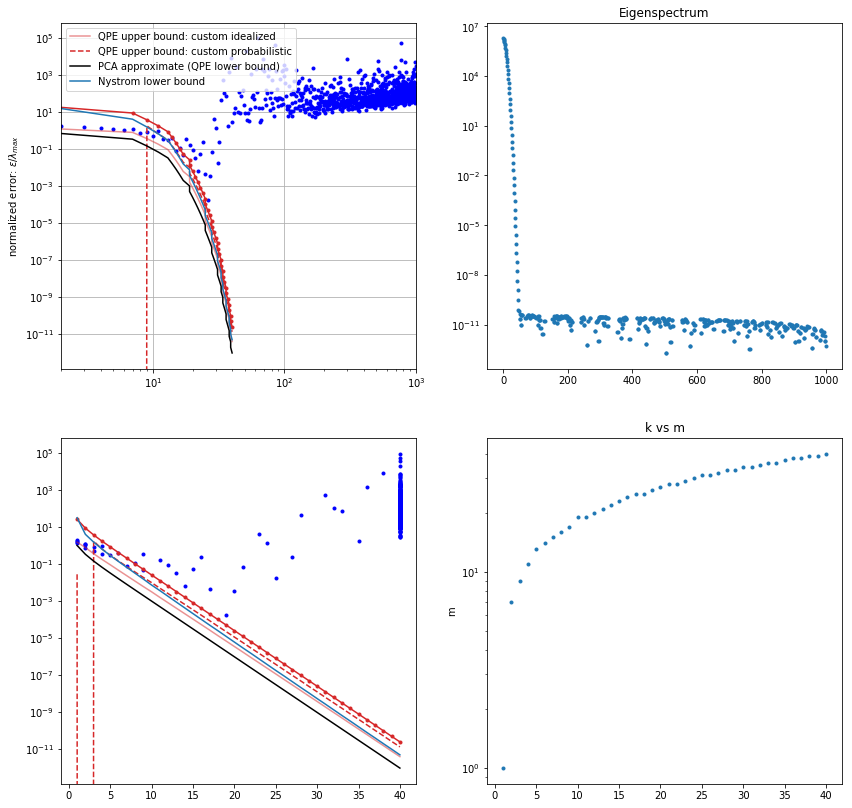

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  2968554193.1071544


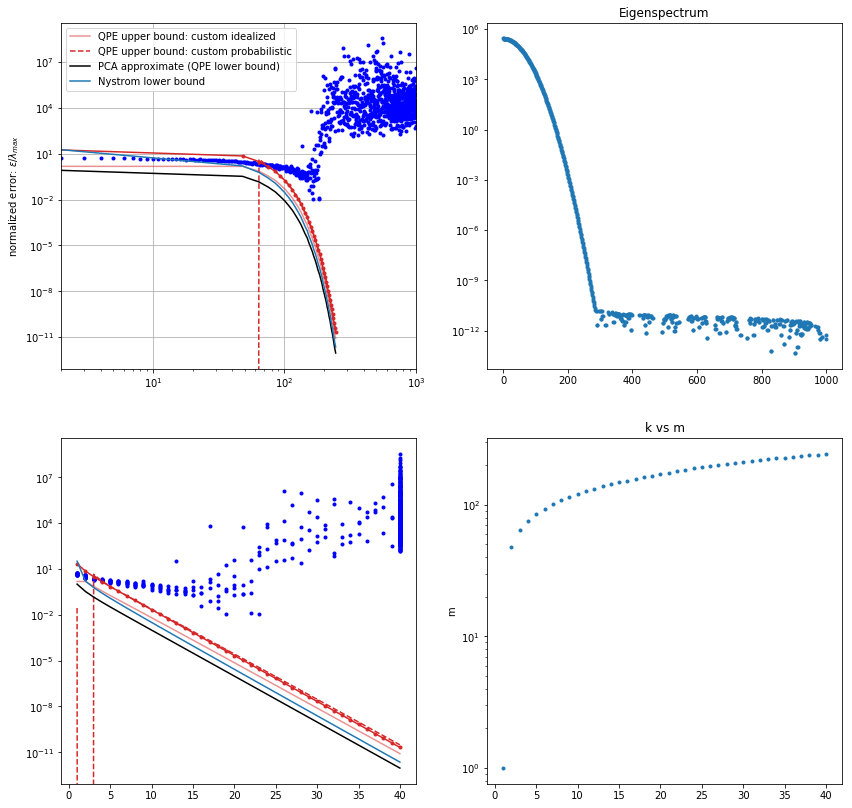

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  6039566669233.533


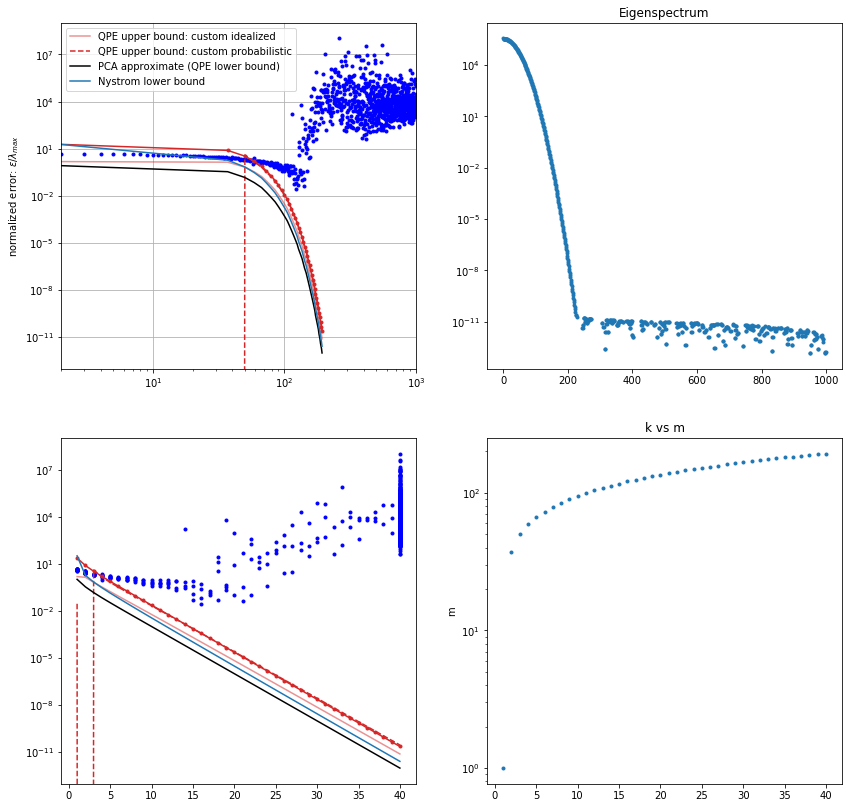

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  28858873237.119812


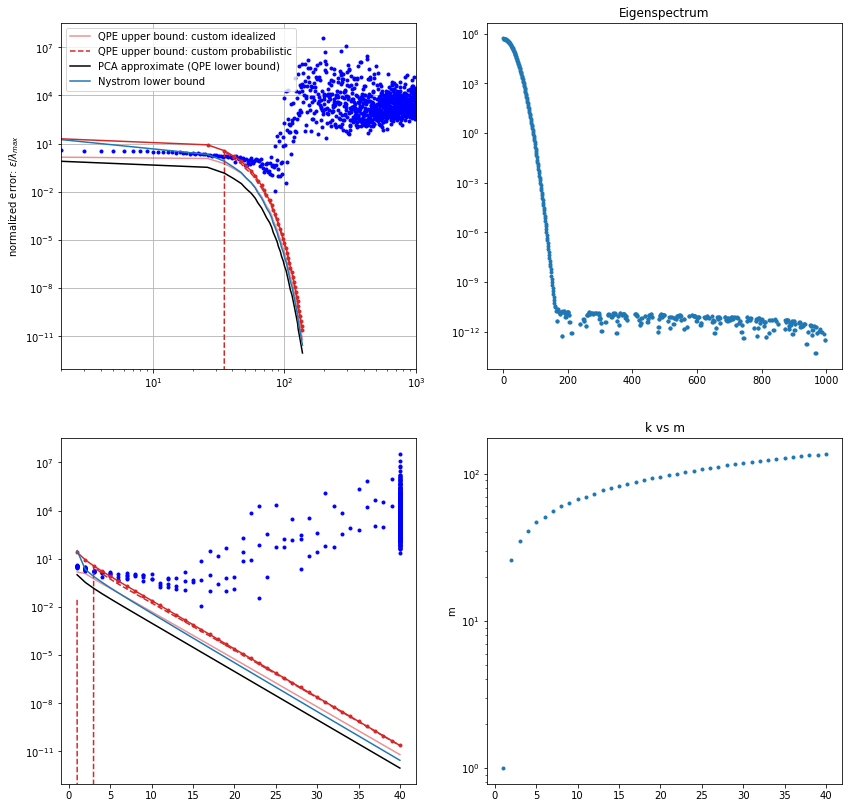

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -291733252247.49347


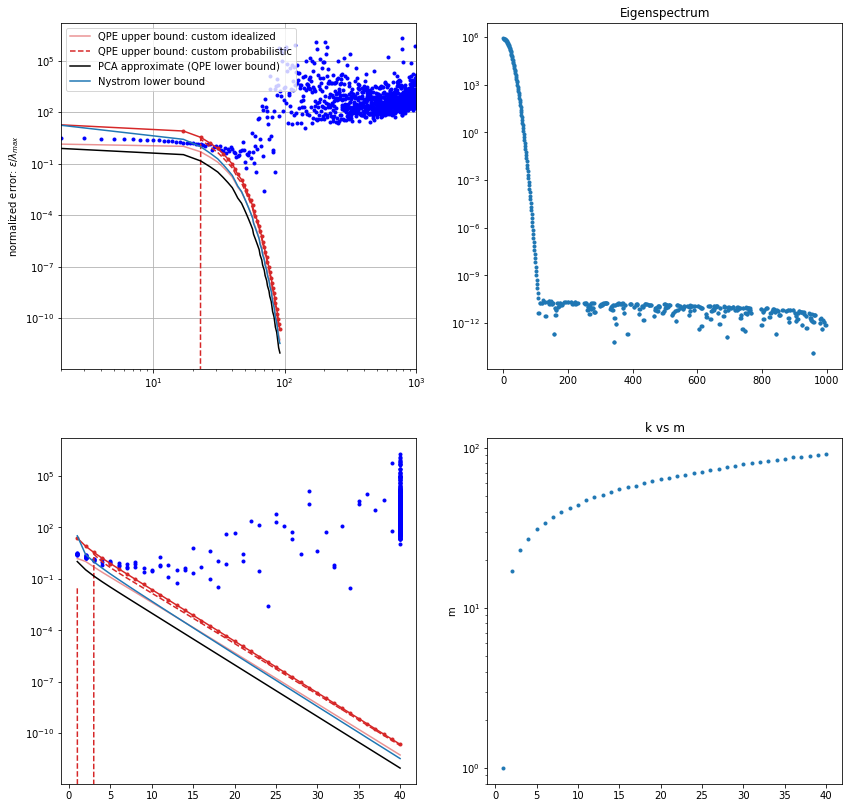

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  197097513089.4744


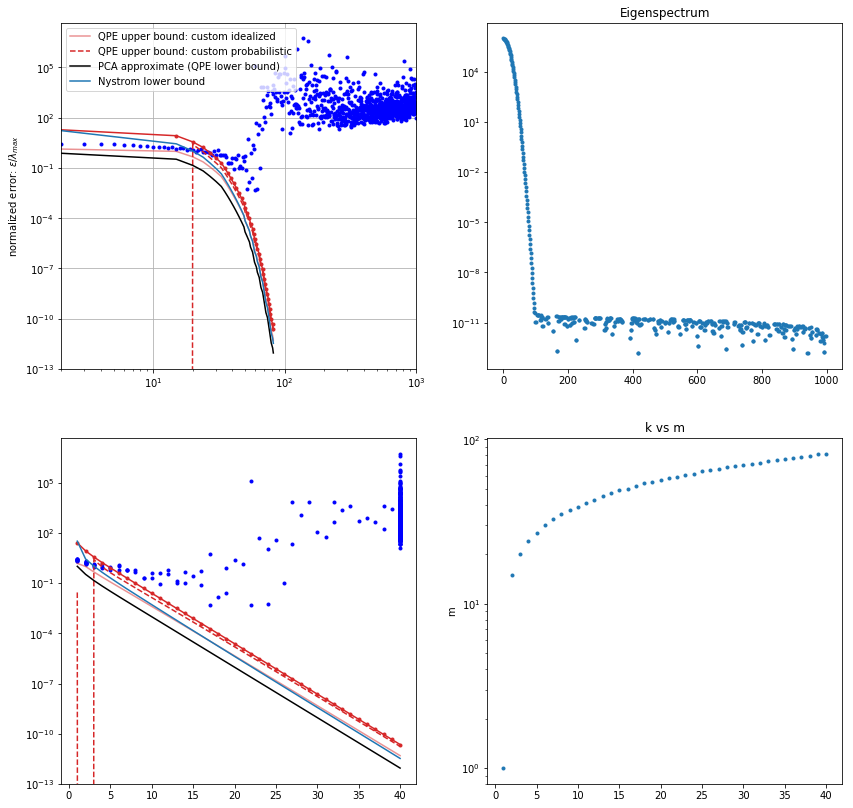

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -25625432518.946133


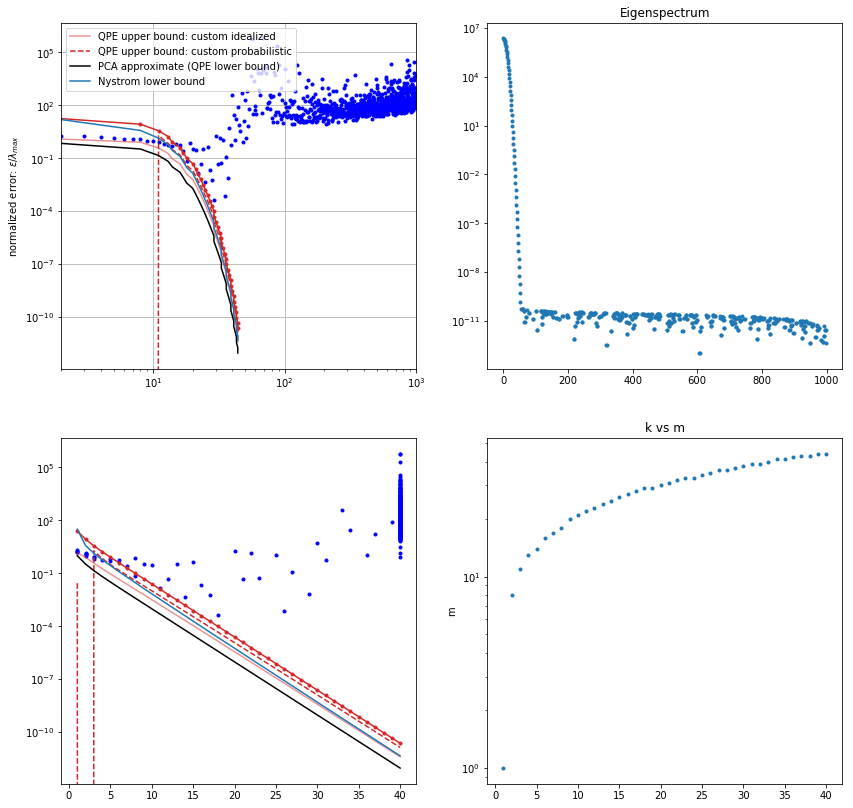

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  42759143067.46153


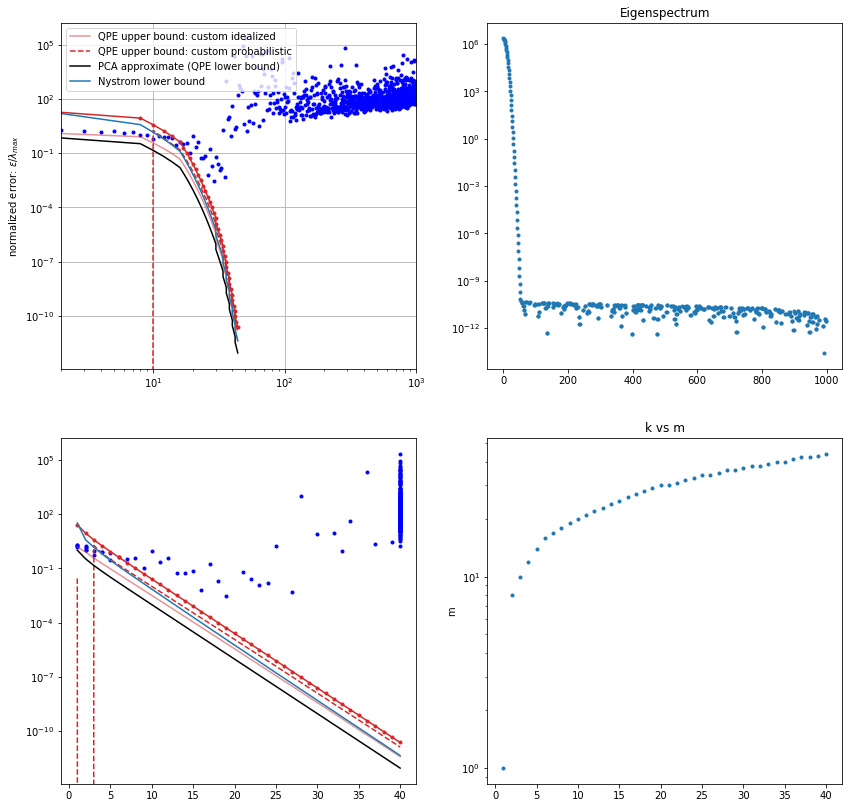

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -5689014924.032006


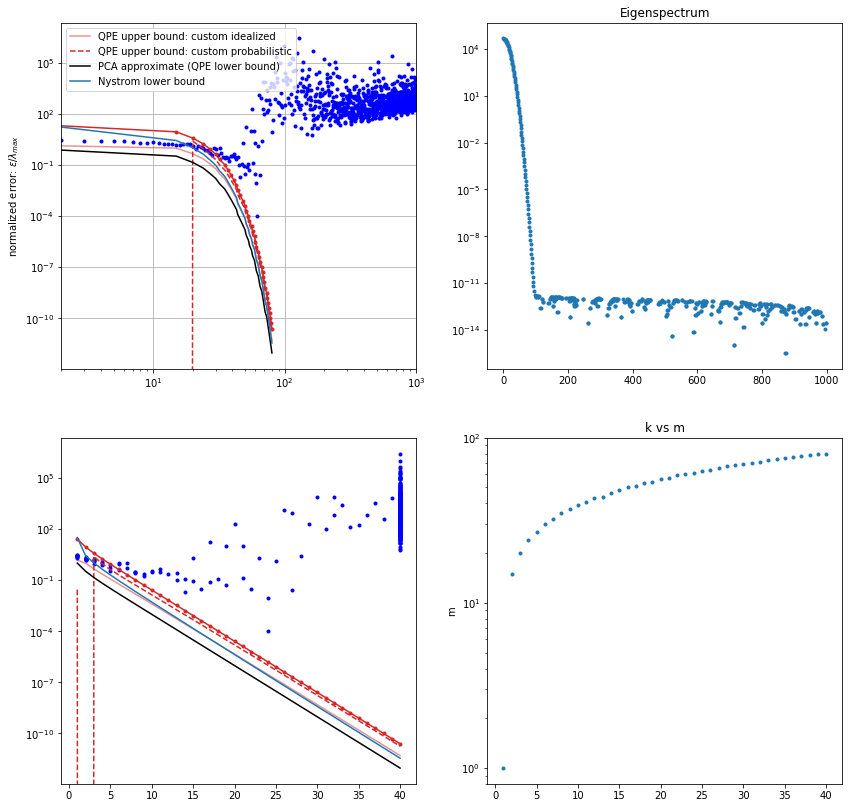

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -128984646822.60611


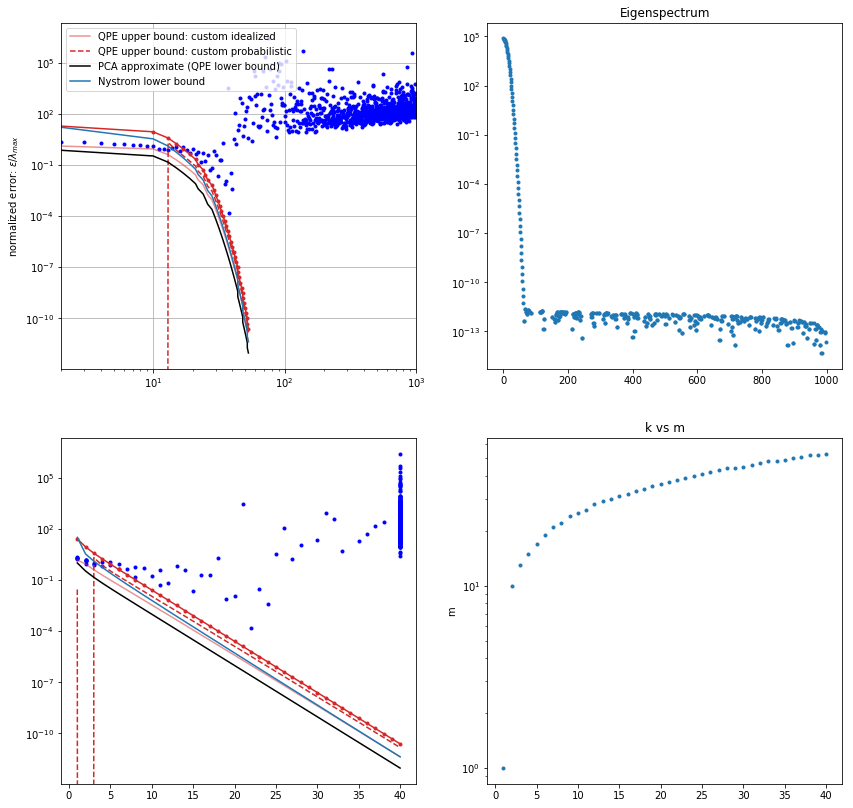

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -33189892167.80482


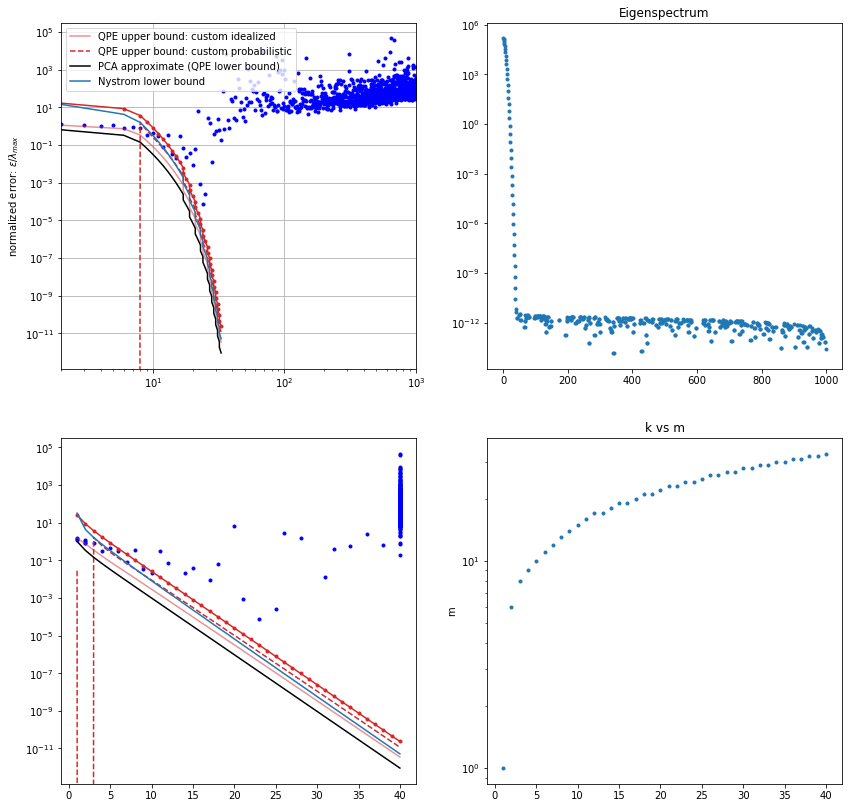

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  20497591395.984417


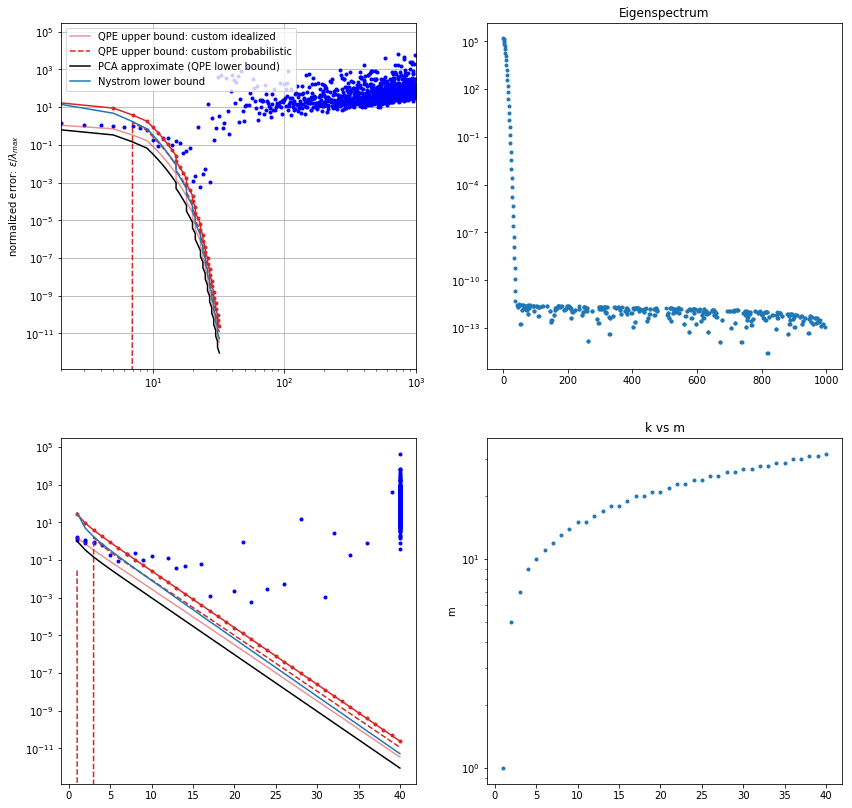

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -167690551.37641215


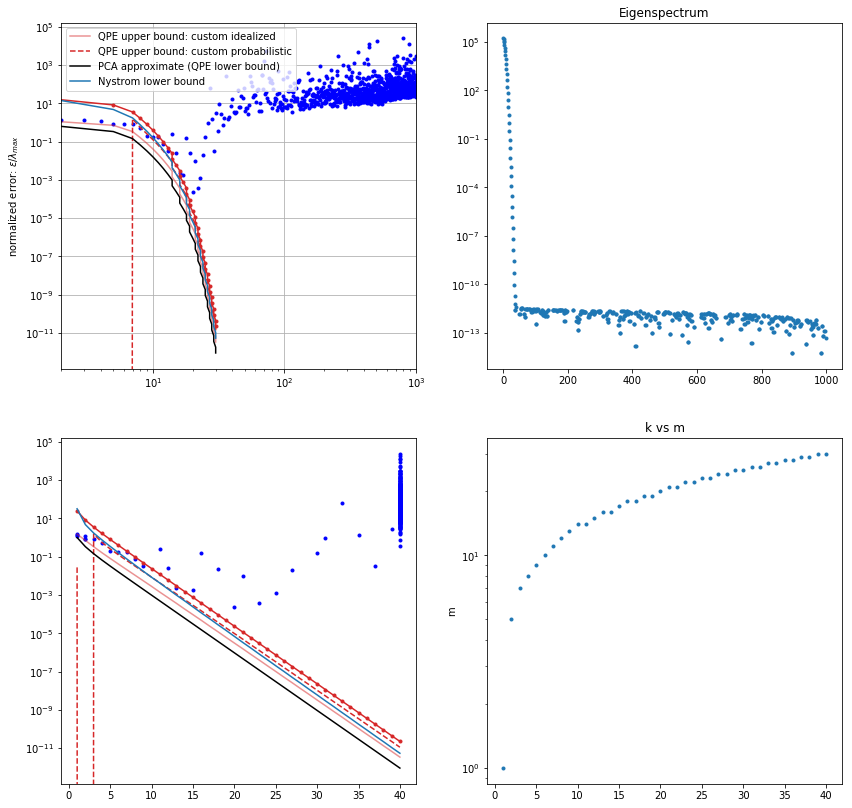

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -271478963.1350014


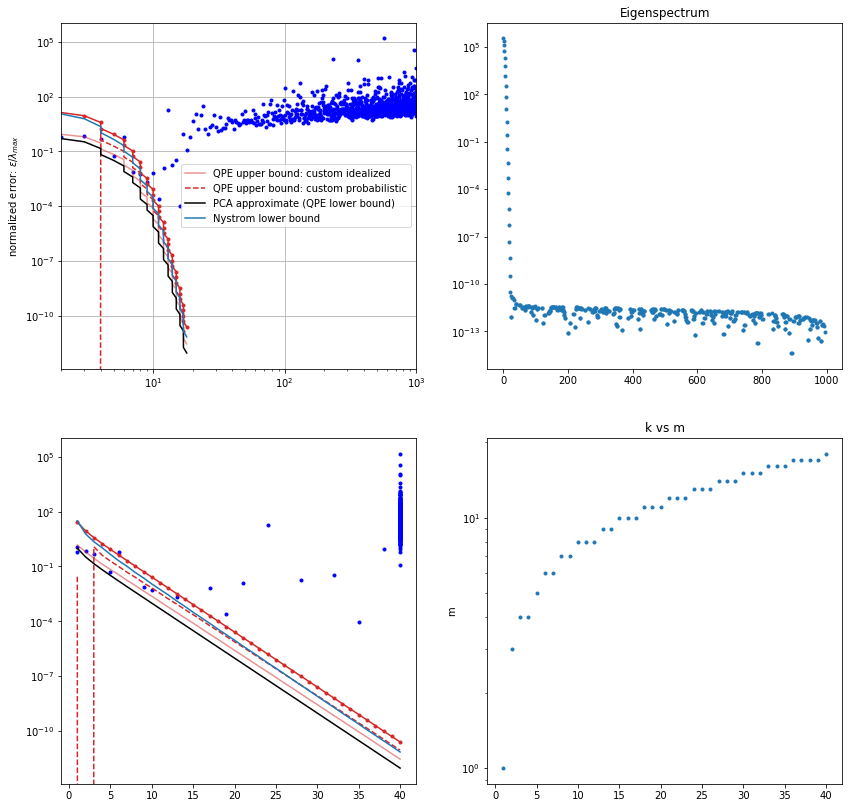

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  25330061.637023386


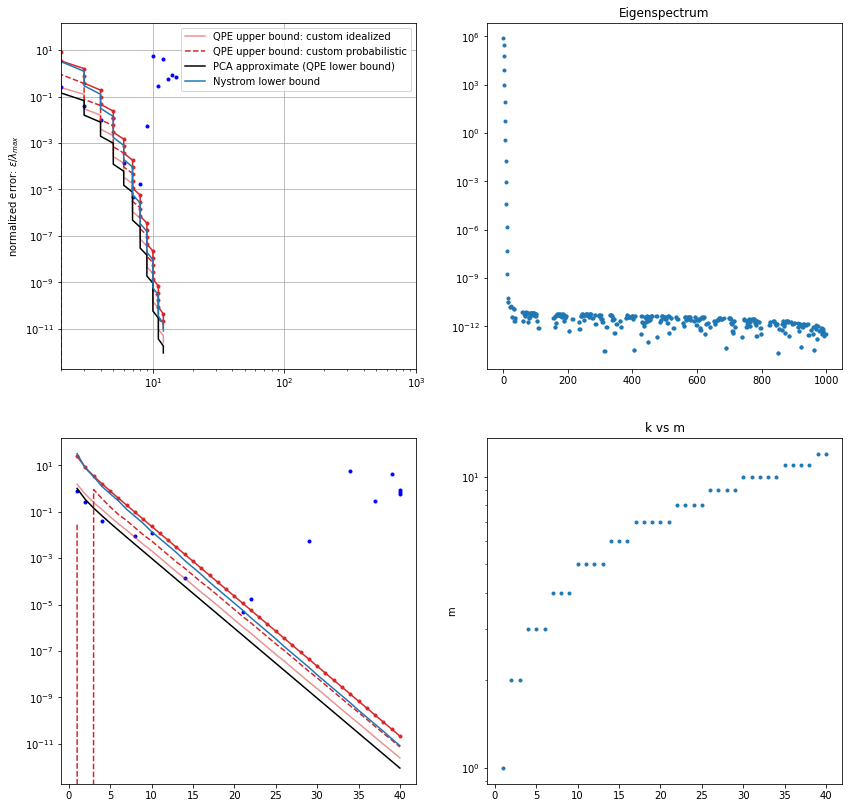

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -15688.96682292223


In [77]:
from scipy.interpolate import interp1d
de = 0.6


for mat_num in range(len(test_matrix_list)):
    plt.figure(figsize = (14, 14))
    
    plt.subplot(2, 2, 1)
    plt.loglog(m, error_Nystrom[:, mat_num]/eig_max[mat_num], 'b.')

    plt.loglog(m_QPE[:, mat_num], error_QPE[:, mat_num]/eig_max[mat_num], c = 'C3', marker = '.')
    
    plt.loglog(m_QPE[:, mat_num], bound_custom_simple(de, m_QPE[:, mat_num], n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: custom idealized')
    plt.loglog(m_QPE[:, mat_num], bound_custom(de, m_QPE[:, mat_num], n, k ),'--',c = 'C3',
               label = 'QPE upper bound: custom probabilistic')
    plt.loglog(m_QPE[:, mat_num], PCA(k)*np.ones(m_QPE[:, mat_num].shape), 'k-', label = 'PCA approximate (QPE lower bound)')
    plt.loglog(m_QPE[:, mat_num], bound_nystrom_wang(m_QPE[:, mat_num], n, k), '-',  c = 'C0', label = 'Nystrom lower bound')


    plt.xlim([2, 1000])

    plt.ylabel('normalized error: '+r'$\epsilon/\lambda_{max}$')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(2, 2, 2)
    plt.semilogy(np.linalg.eig(test_matrix_list[mat_num])[0], '.')
    plt.title('Eigenspectrum')    
    
    plt.subplot(2, 2, 4)
    plt.semilogy(k, m_QPE[:, mat_num], '.')
    plt.title('k vs m')
    plt.ylabel('m')
    
    
    
    plt.subplot(2, 2, 3)
    
    k_interpolated = interp1d(m_QPE[:, mat_num], k, kind='nearest', fill_value='extrapolate')
    
    plt.semilogy(k_interpolated(m), error_Nystrom[:, mat_num]/eig_max[mat_num], 'b.')

    plt.semilogy(k, error_QPE[:, mat_num]/eig_max[mat_num], c = 'C3', marker = '.')
    
    plt.semilogy(k, bound_custom_simple(de, m_QPE[:, mat_num], n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: custom idealized')
    plt.semilogy(k, bound_custom(de, m_QPE[:, mat_num], n, k ),'--',c = 'C3',
               label = 'QPE upper bound: custom probabilistic')
    plt.semilogy(k, PCA(k)*np.ones(m_QPE[:, mat_num].shape), 'k-', label = 'PCA approximate (QPE lower bound)')
    plt.semilogy(k, bound_nystrom_wang(m_QPE[:, mat_num], n, k), '-',  c = 'C0', label = 'Nystrom lower bound')

    
    
    
    plt.show()
    
    print('Verifying Nystrom error\n')
    print('Sum diagonal Knn^[-1] @ Knn: ', np.sum(np.linalg.inv(test_matrix_list[mat_num])@test_matrix_list[mat_num]))
    
    
#last sample  - matrix is singular

# Conclusions


* Why Wang and Zhang boudn overestimates the errors? 
    - it is defined in reference to the theoretical PCA error, approximated as $\epsilon \sim \lambda_{m+1}$. This 
$\lambda_{m+1}$ is esitmated from the bound of minimum resolvable eigenvalue: $\frac{\lambda_{max}}{2^k-1}$. However, if the decay is too fast, this bound overestimates the error, and the boudn on Nystrom error is overestimated as well.


* Why is Nystrom error increasing? 

     - literature data: Whang and Zhang only small rank, and oftentimes number of solumns is different than  rank so it cannot be related directly
     - Maybe rounding errors due to: numpy linalg.inv($K_{mm}$) ? :
         - numpy uses float64 
         - max accuracy:  1e15 = max kappa

In [13]:
m_QPE[:, 19]

array([ 1.,  7., 10., 12., 14., 15., 16., 17., 19., 20., 21., 22., 23.,
       24., 24., 25., 26., 27., 28., 29., 29., 30., 31., 32., 32., 33.,
       34., 34., 35., 36., 37., 37., 38., 38., 39., 40., 40., 41., 42.,
       42.])

# 2. Main plots: 7x 5 datasets

999
[0.99998678 1.998241  ]


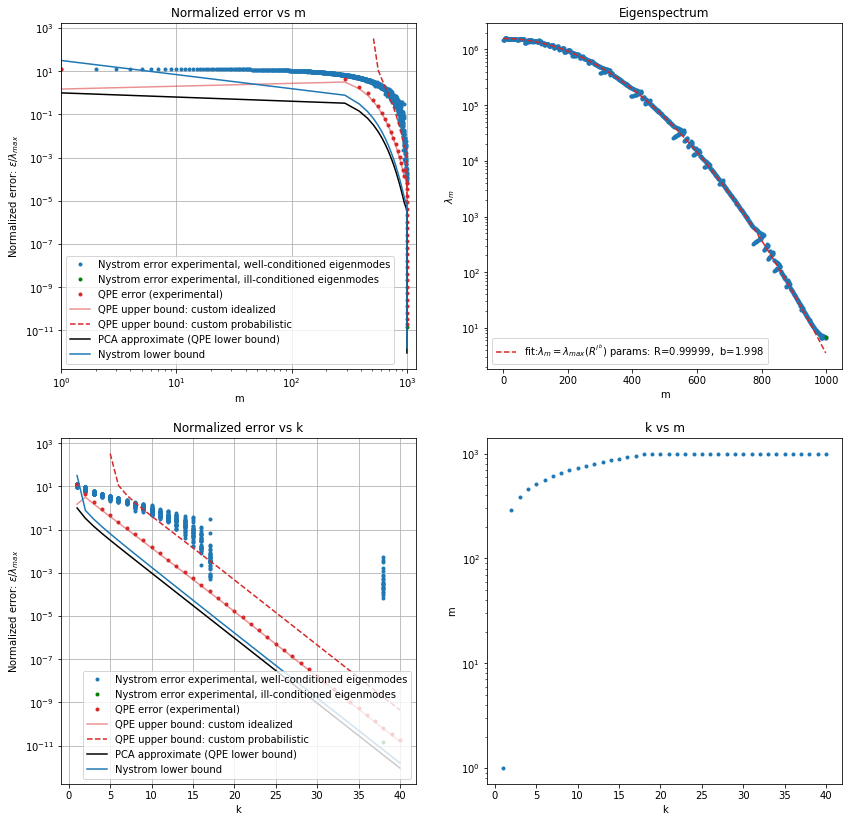

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  1000.0000000001357


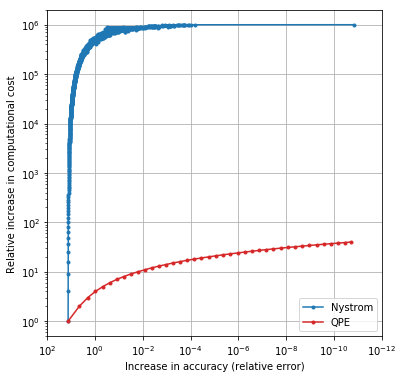

999
[0.99998834 2.03063762]


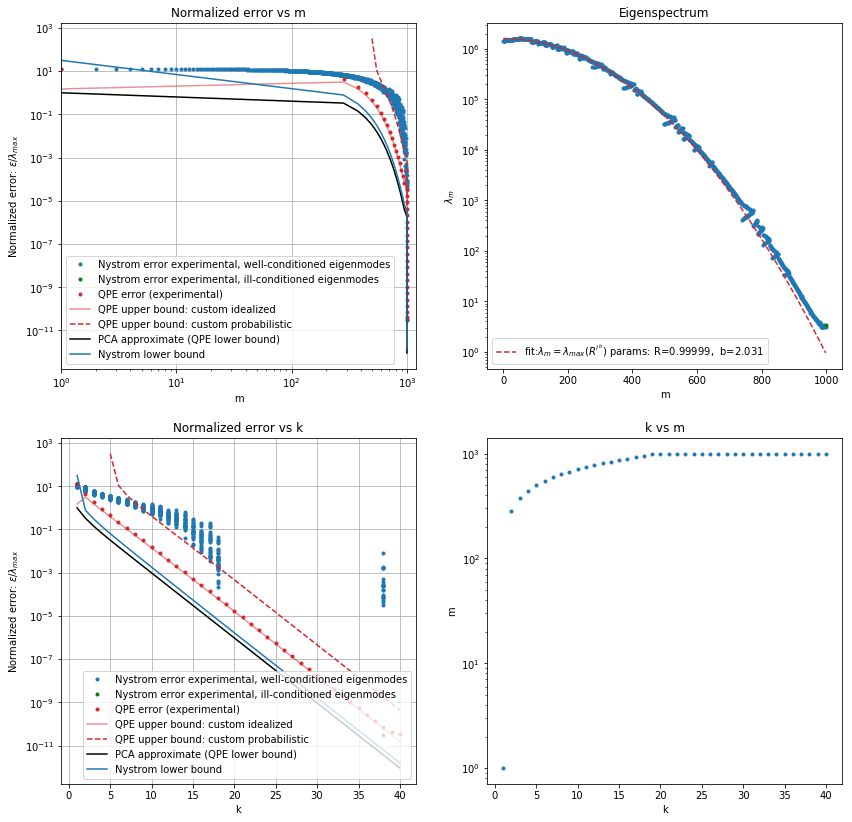

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  1000.0000000001733


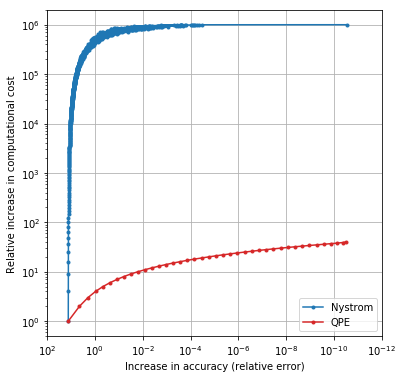

711
[0.99993397 1.9807911 ]


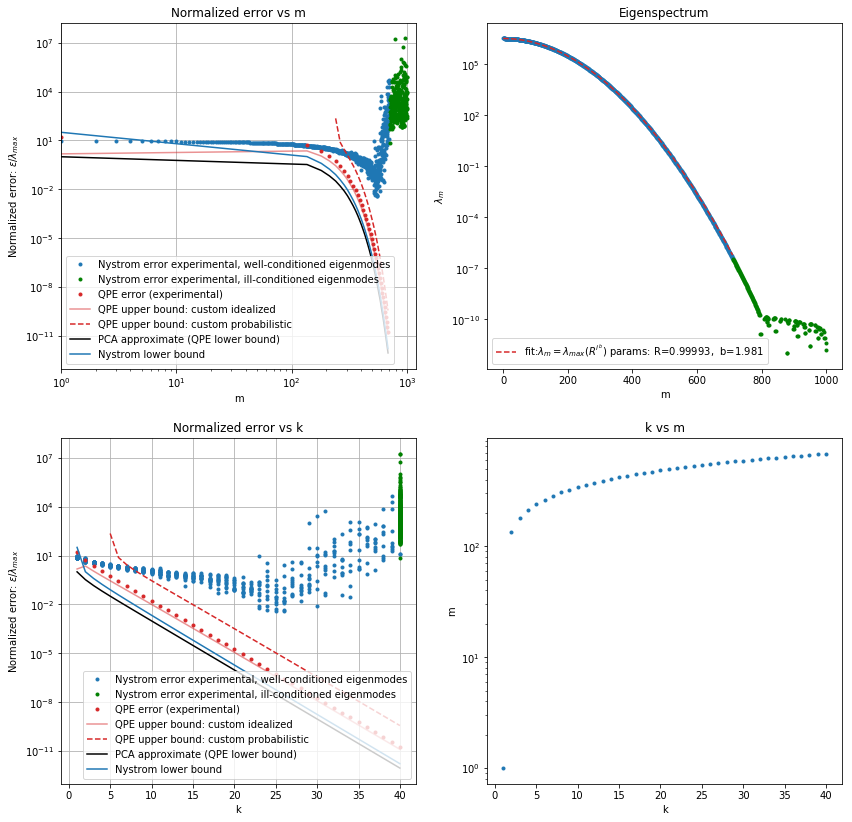

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -26734296112.095127


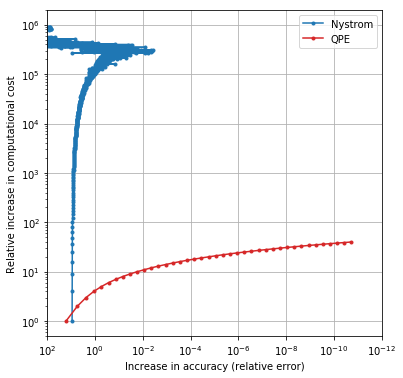

592
[0.99990282 1.97693465]


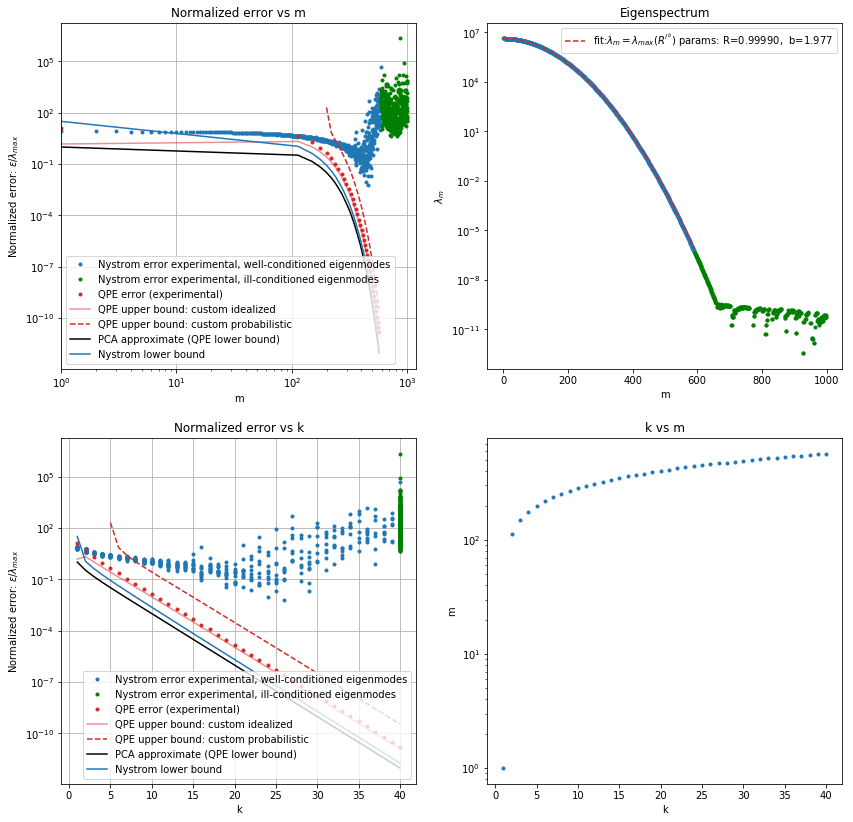

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  7141852401.642898


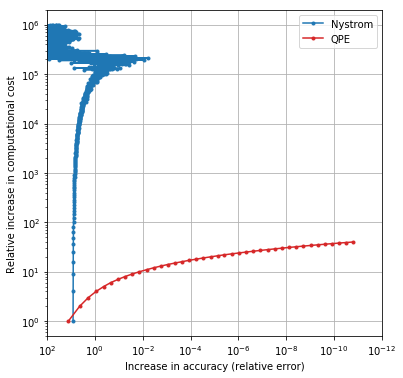

422
[0.99980029 1.96757601]


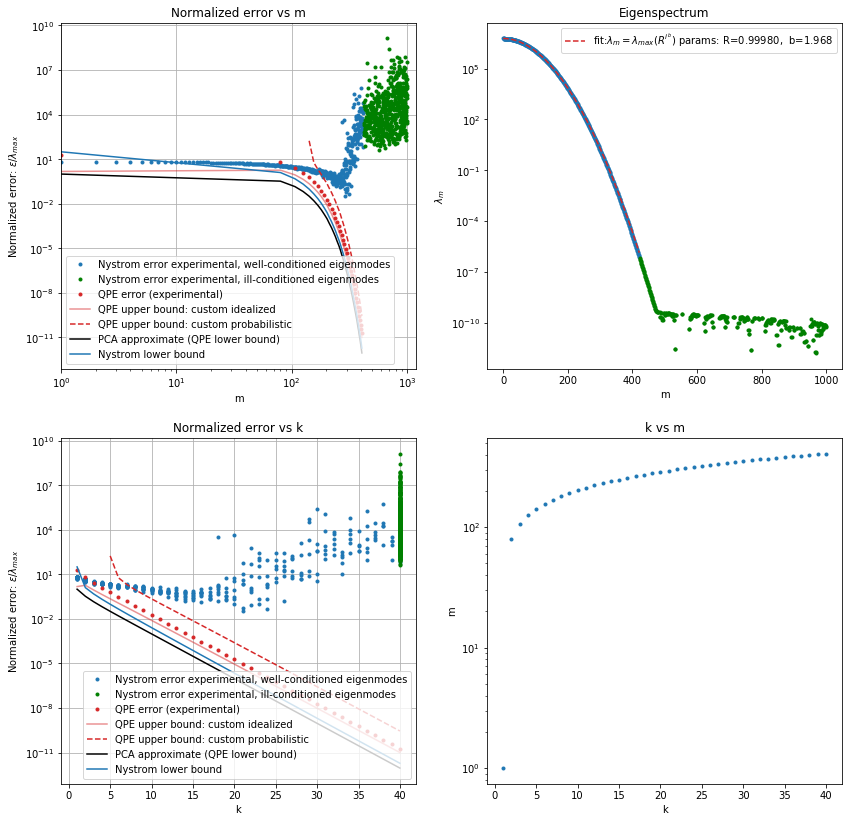

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -11513164734513.219


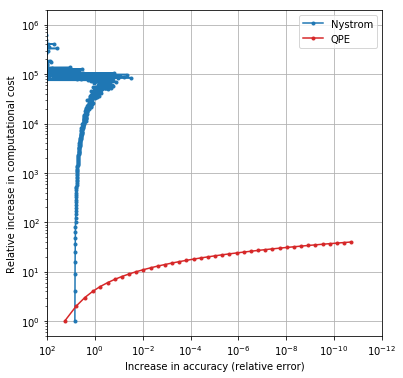

43
[0.96000872 1.71934041]


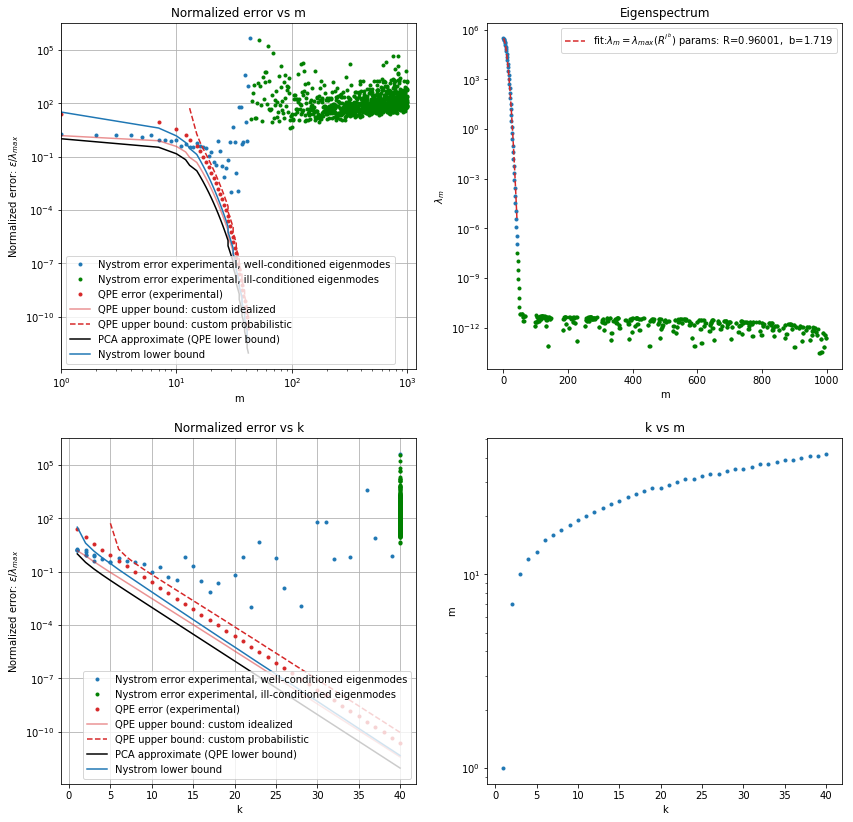

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -35371637626.44356


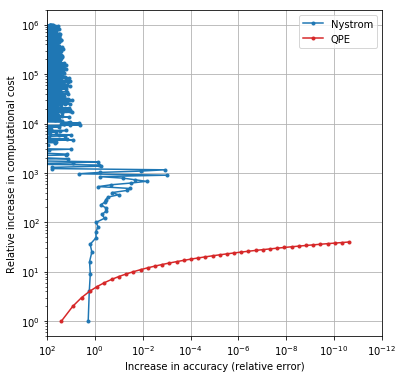

243
[0.99933216 1.94428909]


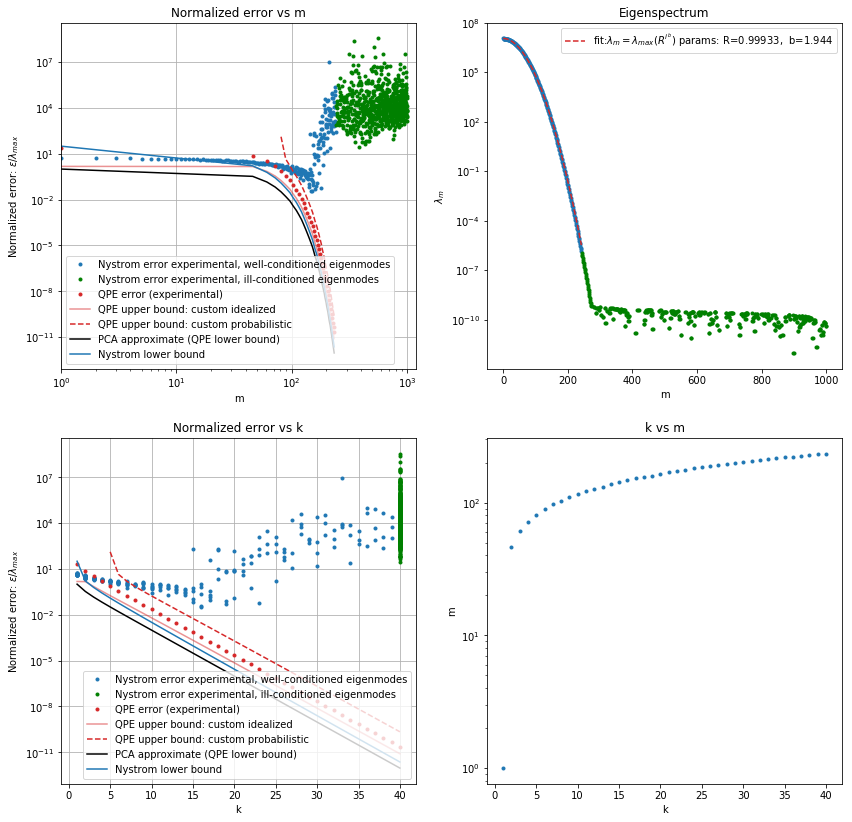

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  913131235881.555


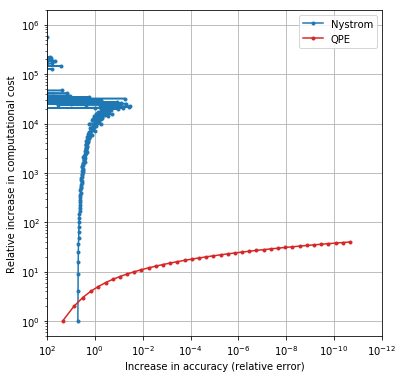

83
[0.99202747 1.84441481]


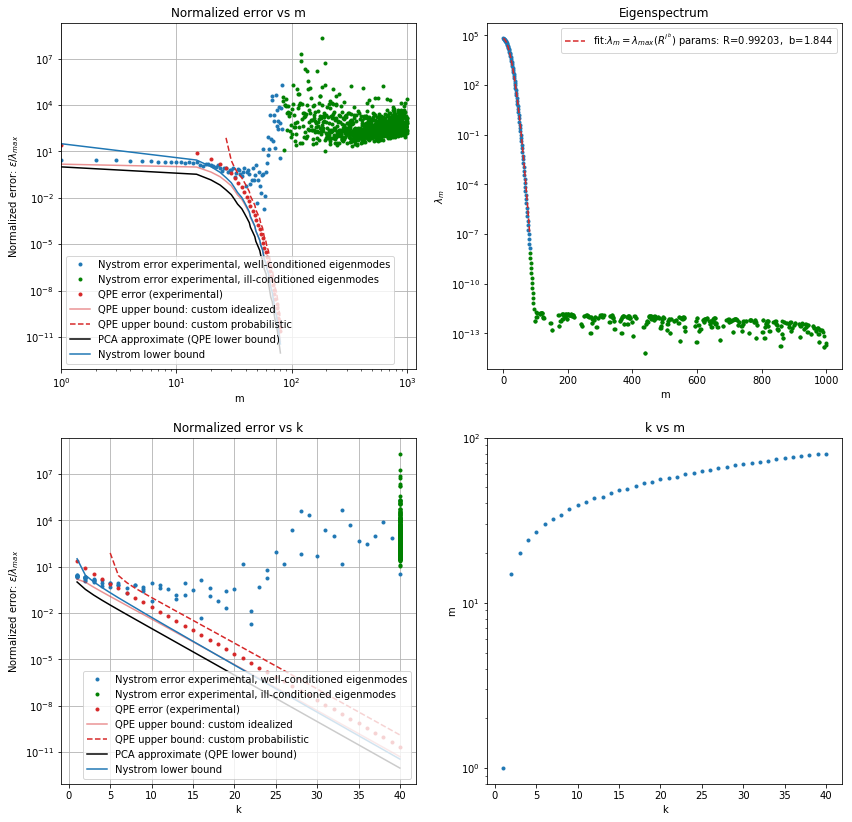

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  562662491618.6937


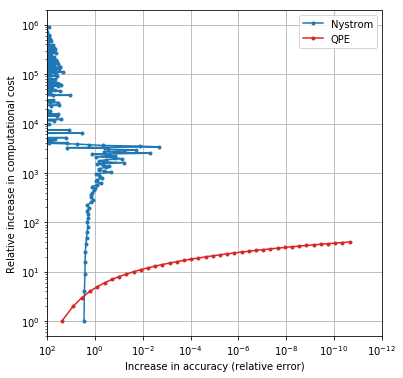

73
[0.98929135 1.82586799]


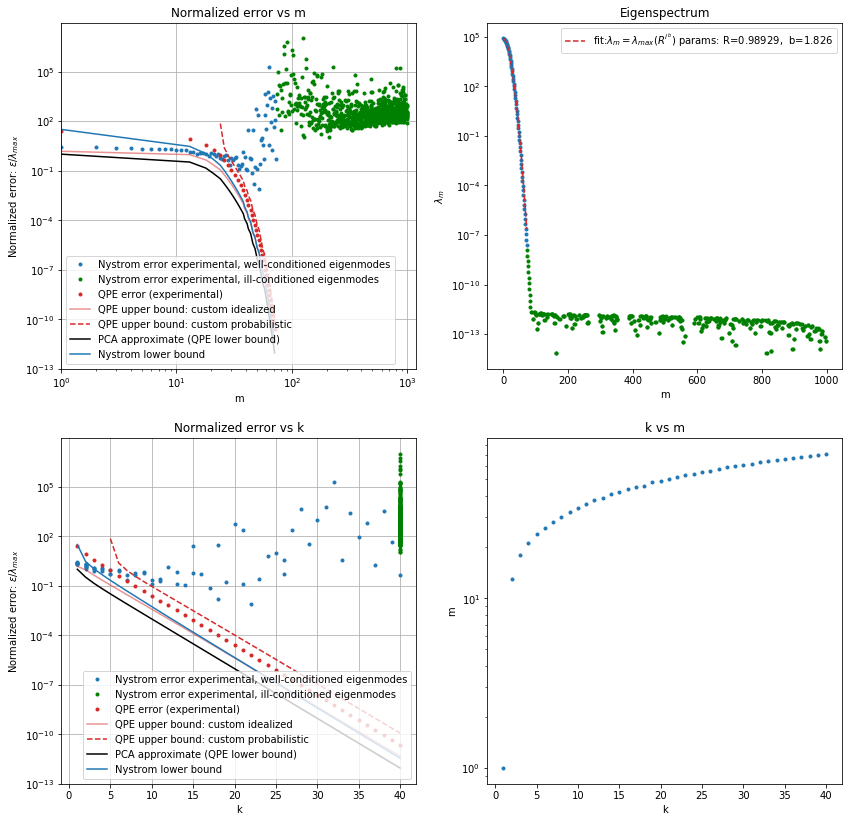

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  4242199784.446073


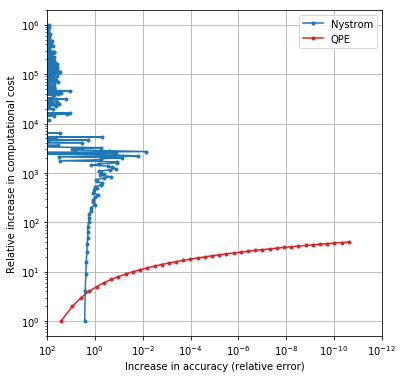

62
[0.98388858 1.79720085]


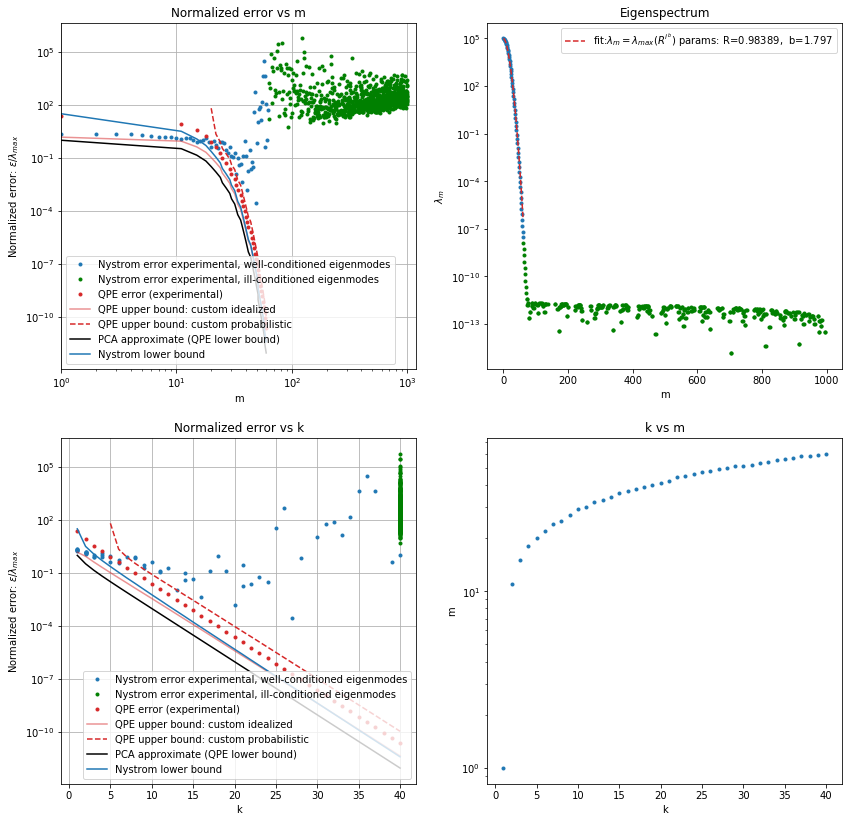

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  4406845147.553244


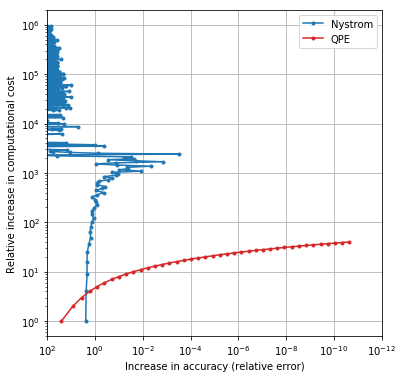

30
[0.90353185 1.62225963]


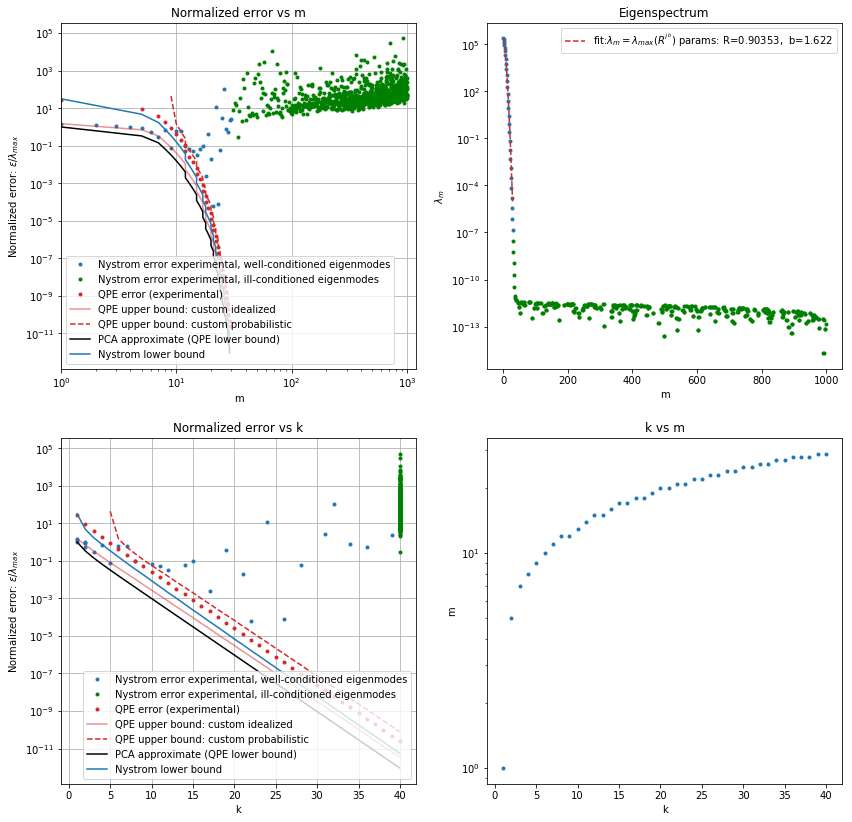

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  4013979879.595219


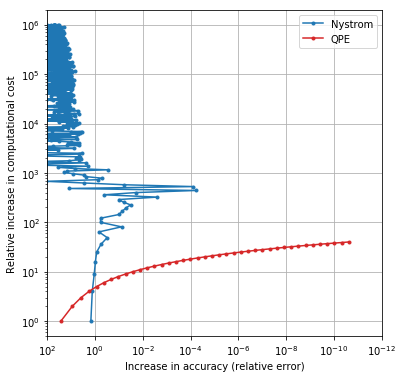

28
[0.88571538 1.60083273]


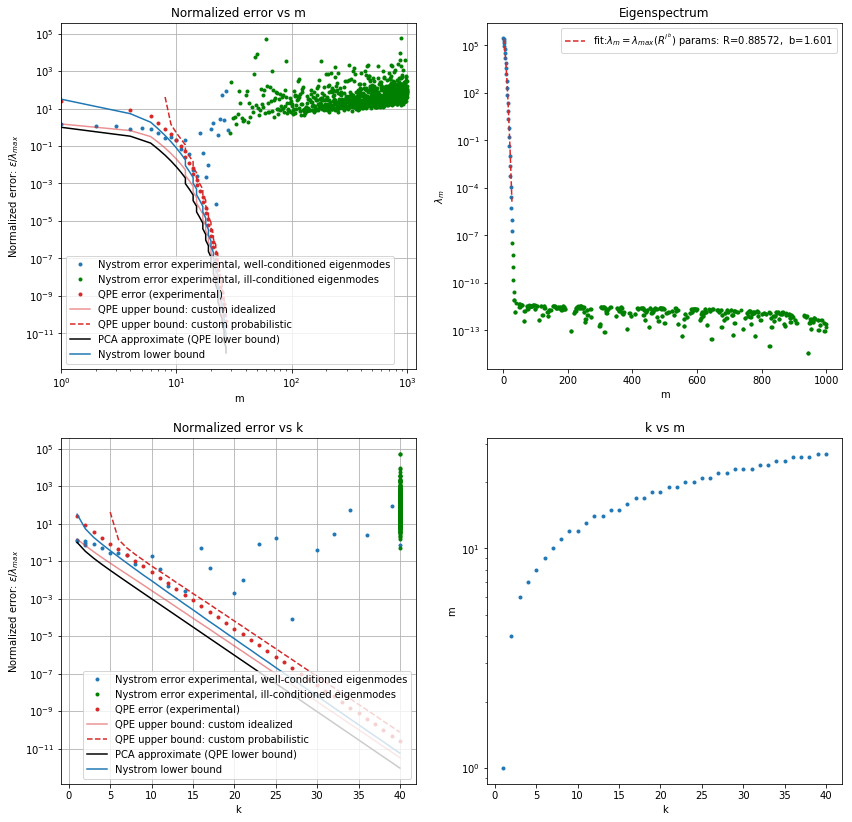

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -789169055.1172398


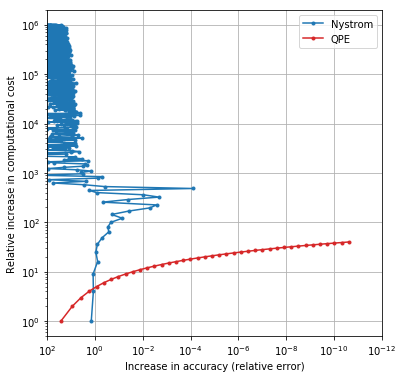

19
[0.72787179 1.47870732]


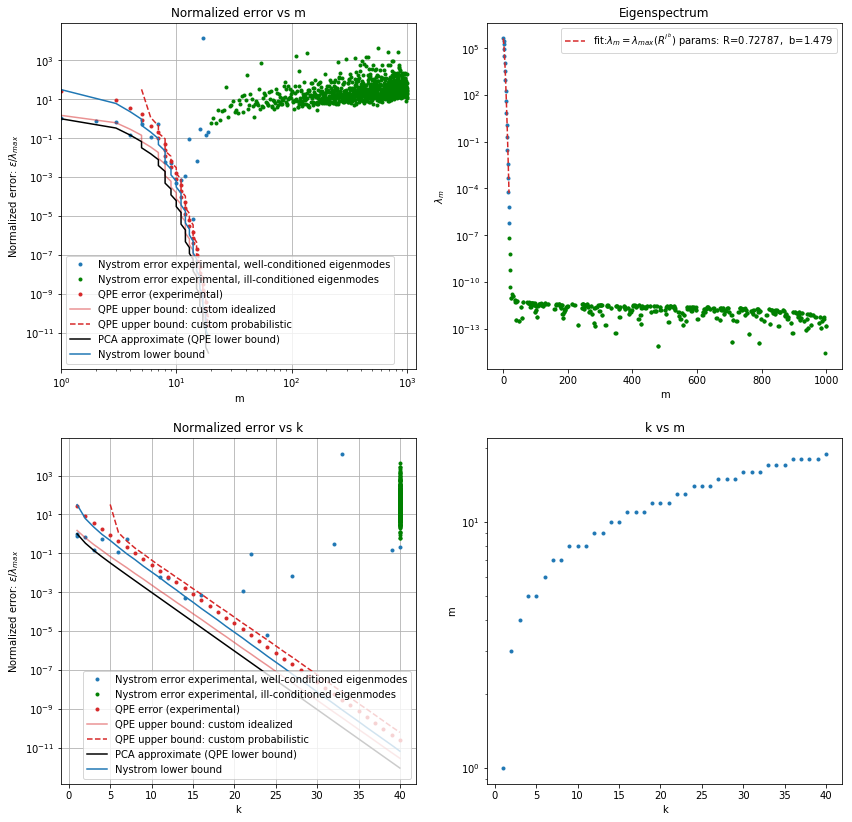

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  395338463.40970075


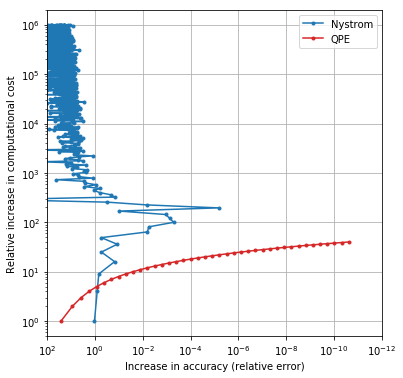

18
[0.70306925 1.46572422]


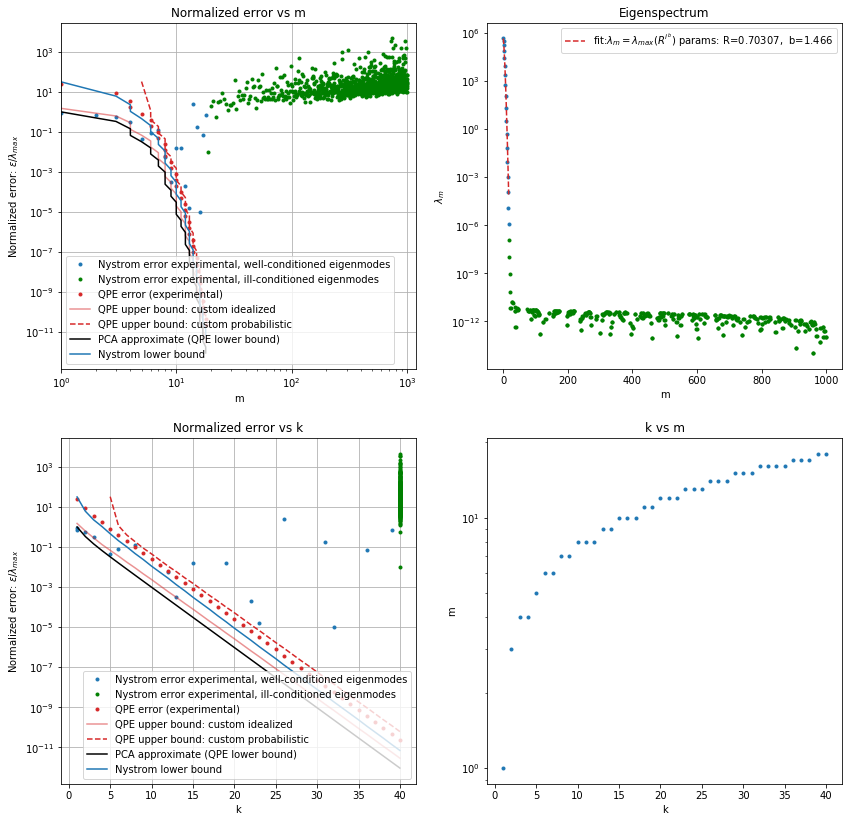

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -10011340.227122486


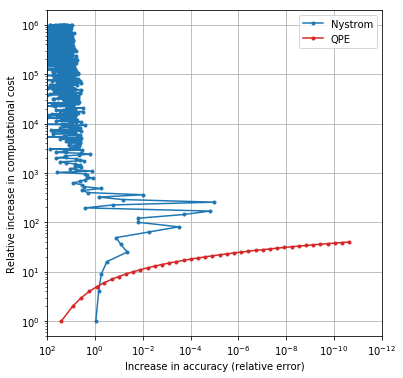

257
[0.999412   1.94733713]


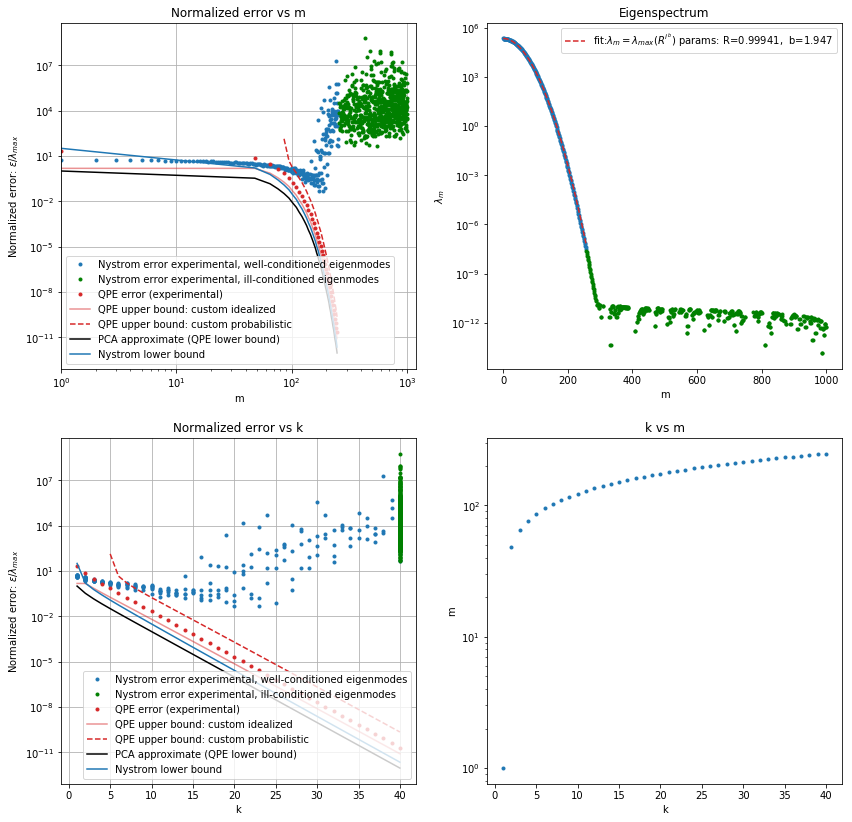

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -103911370019.4153


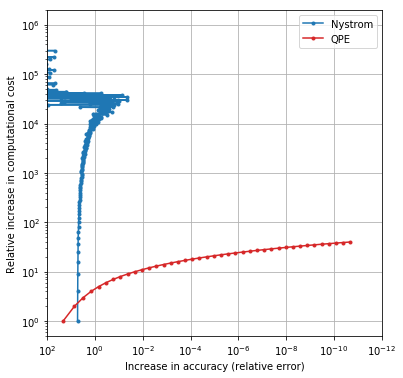

138
[0.99761079 1.90390025]


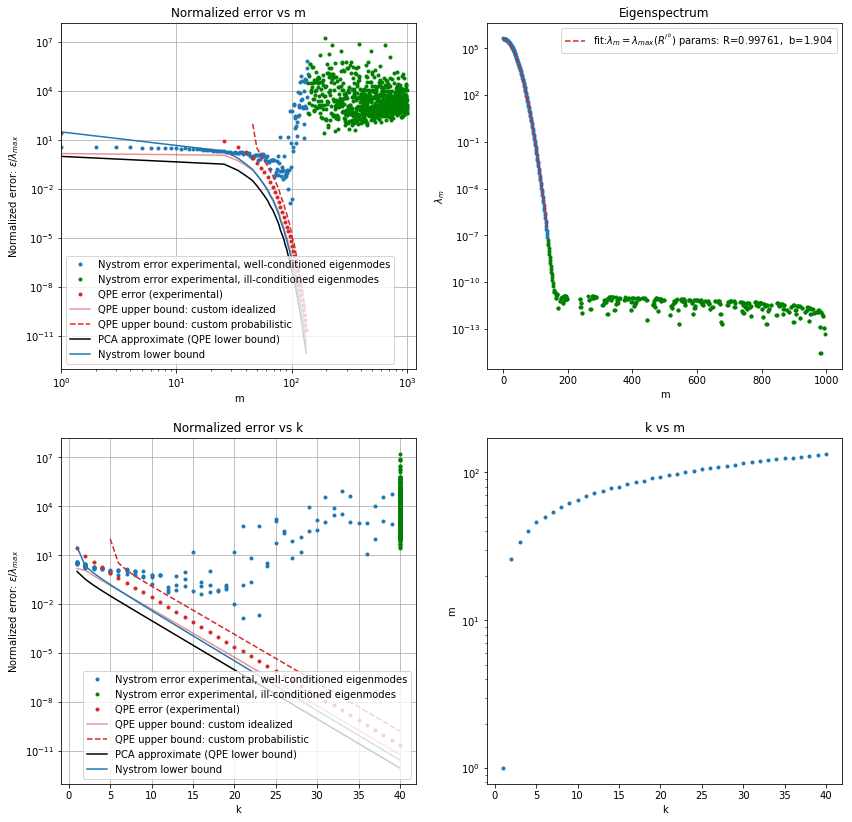

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -37797678391.01881


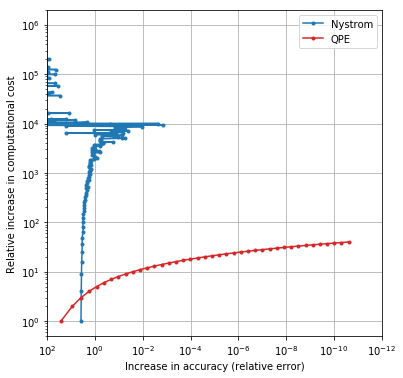

127
[0.99710036 1.89592476]


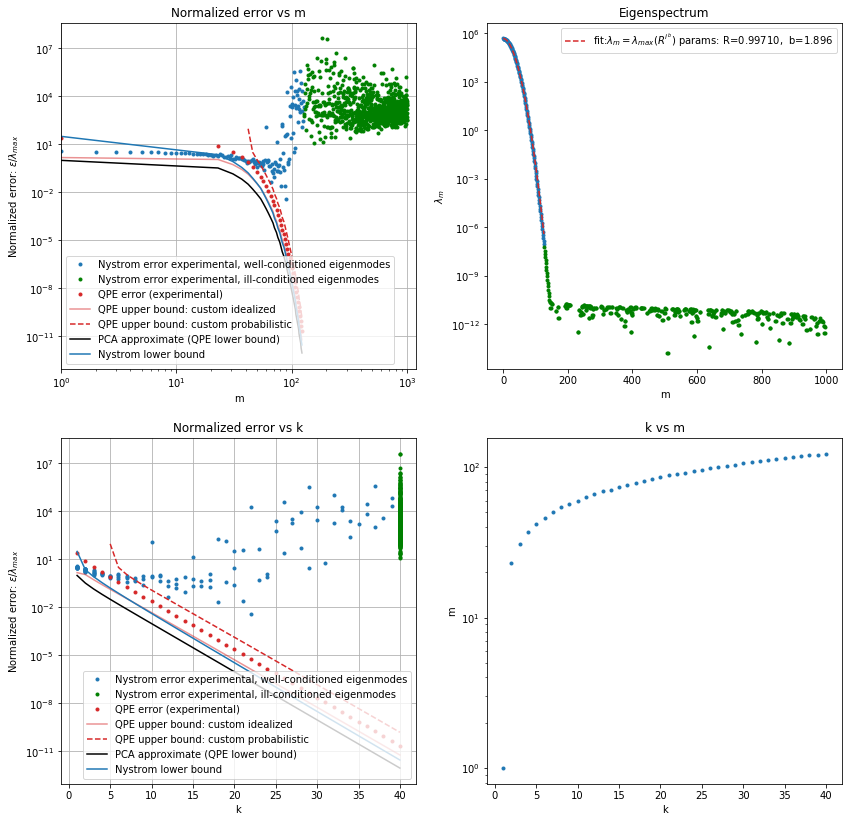

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  65717484948.53257


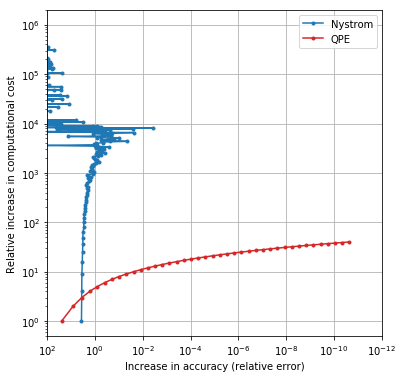

91
[0.99365394 1.85759984]


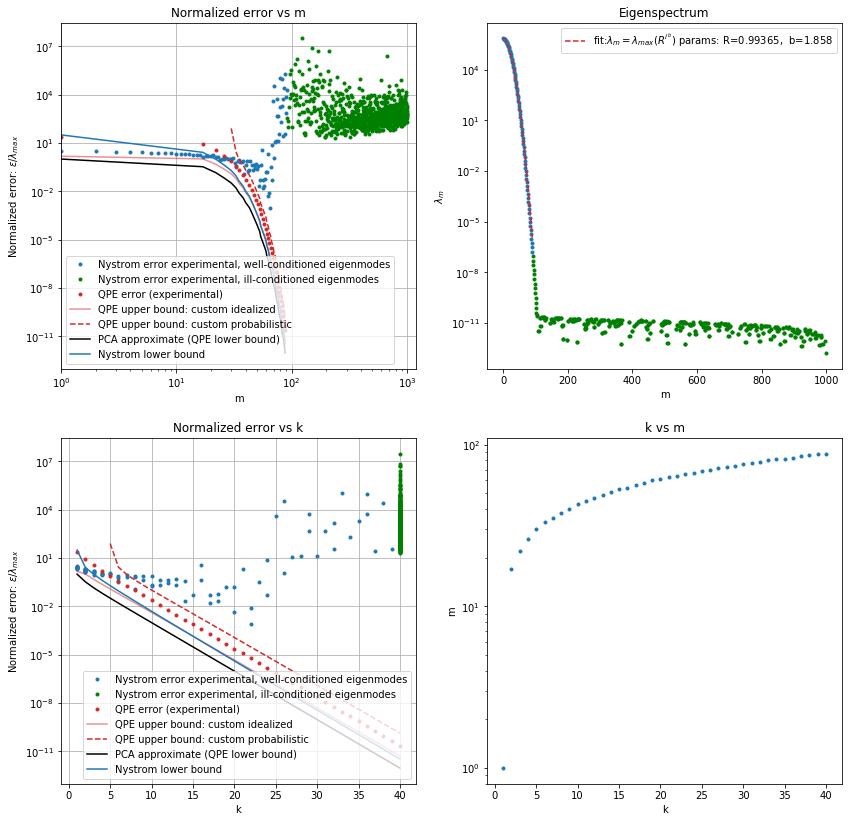

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -61051813325.27559


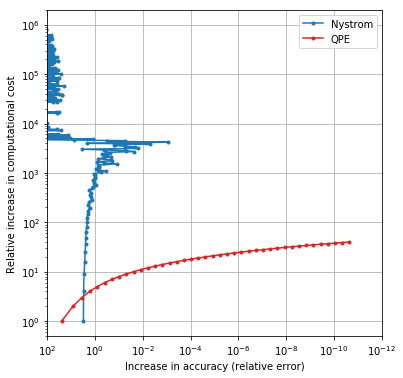

62
[0.98436082 1.79941188]


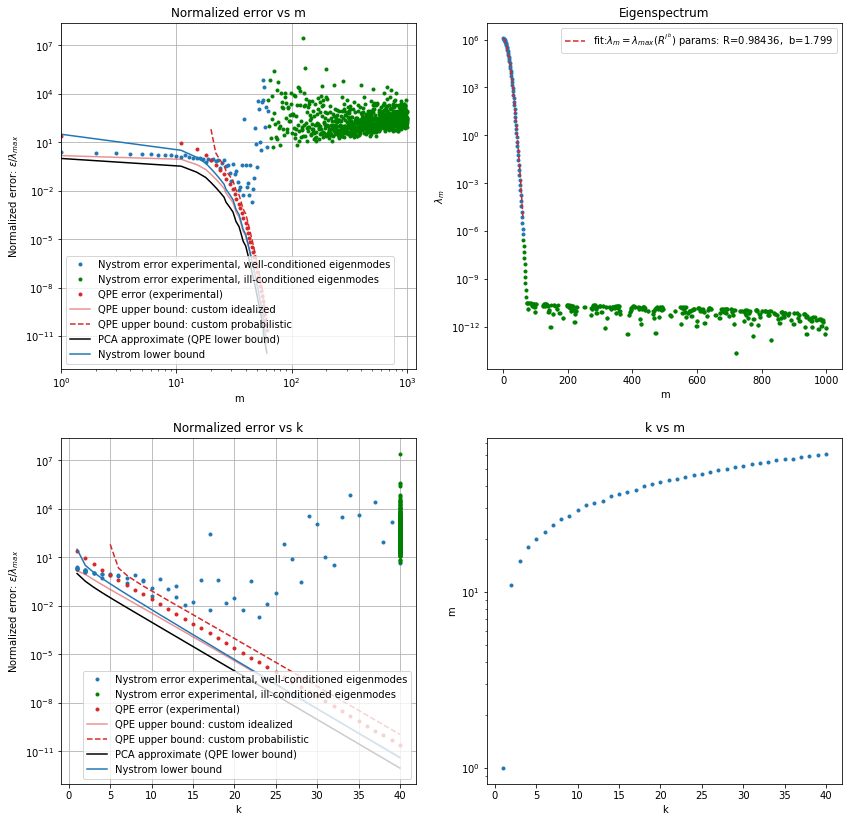

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  151982344880.23505


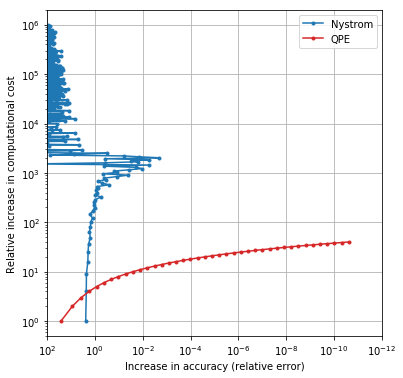

43
[0.96096859 1.72169815]


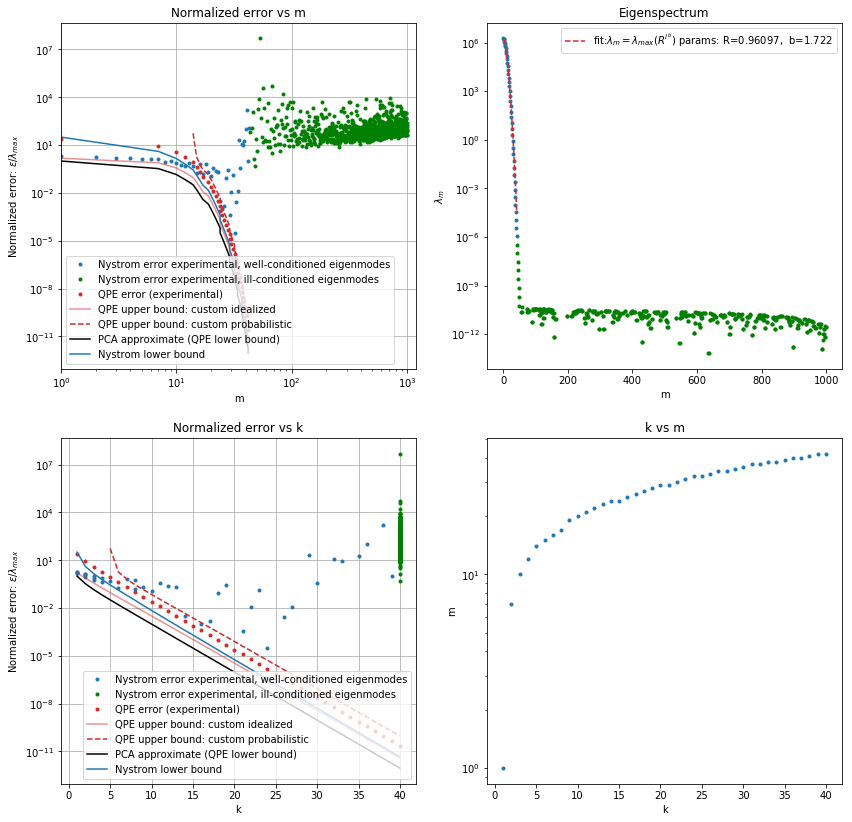

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -3372542105.43679


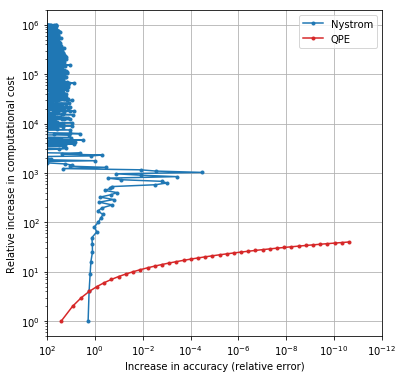

41
[0.95510414 1.70788896]


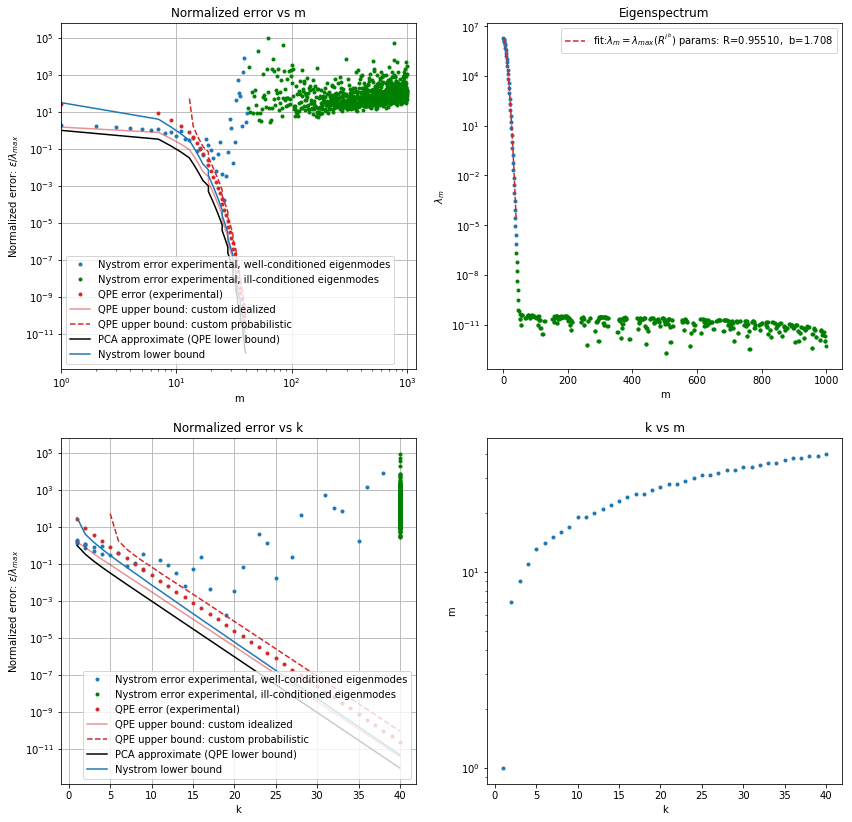

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  2968554193.1071544


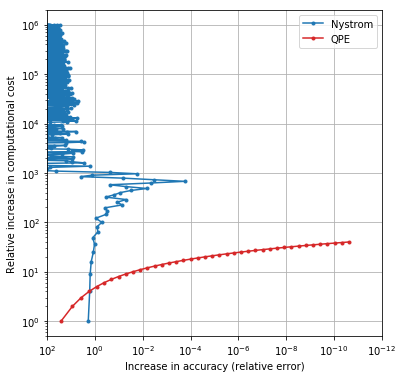

253
[0.99939295 1.94658816]


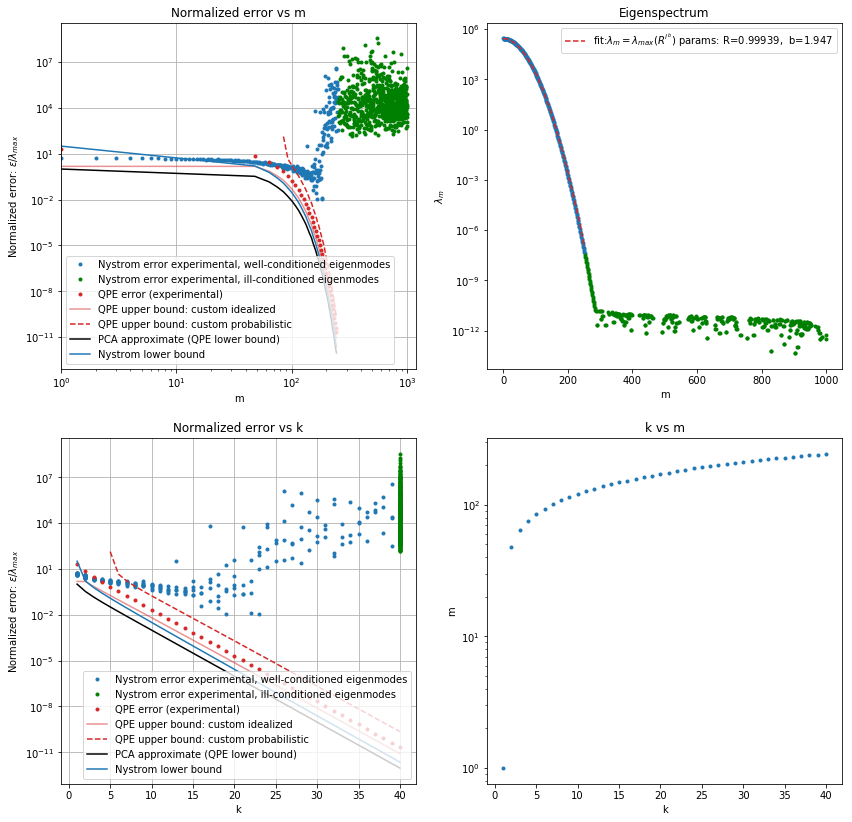

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  6039566669233.533


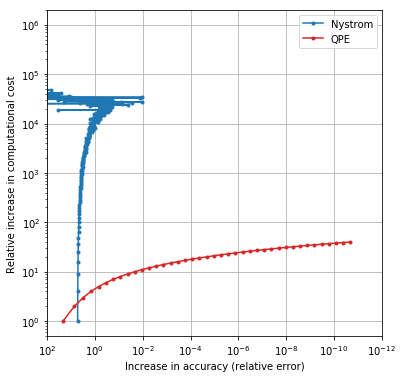

200
[0.99897371 1.93279681]


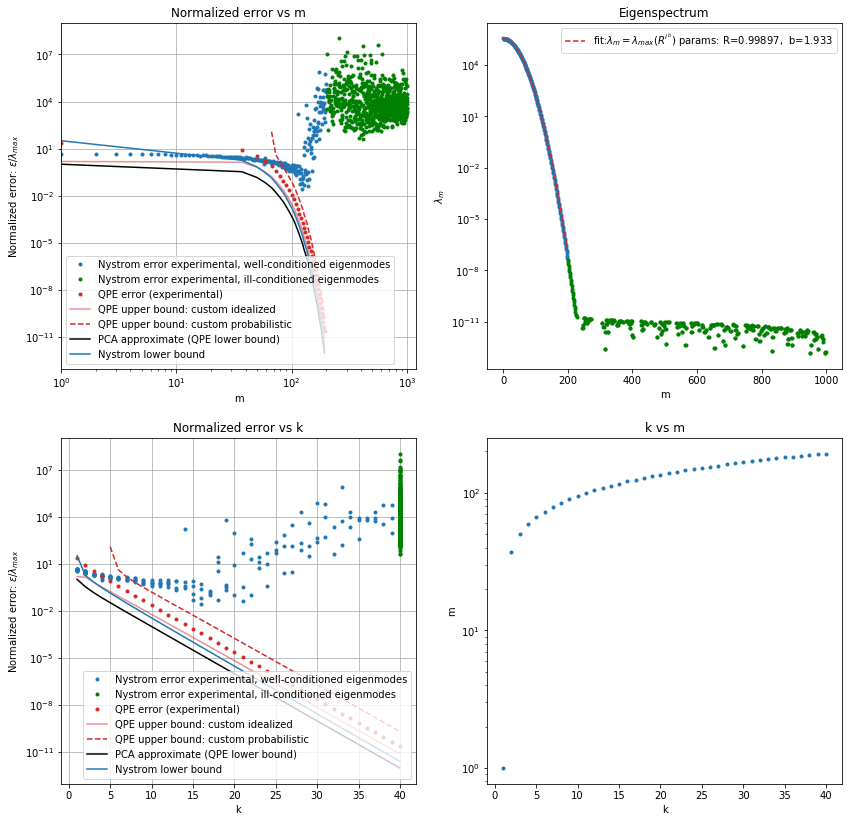

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  28858873237.119812


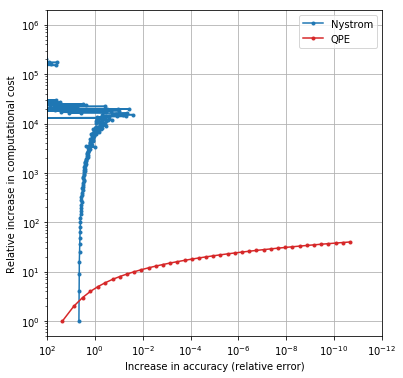

141
[0.99773593 1.90601987]


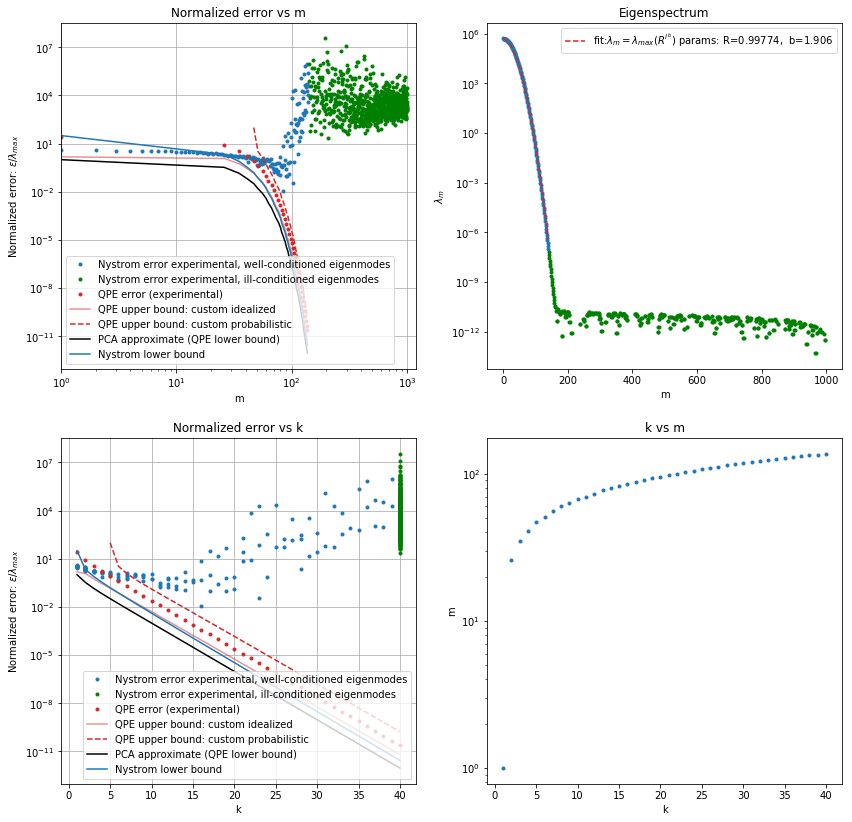

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -291733252247.49347


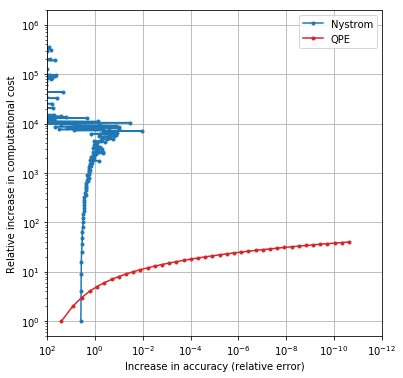

94
[0.99419186 1.86245871]


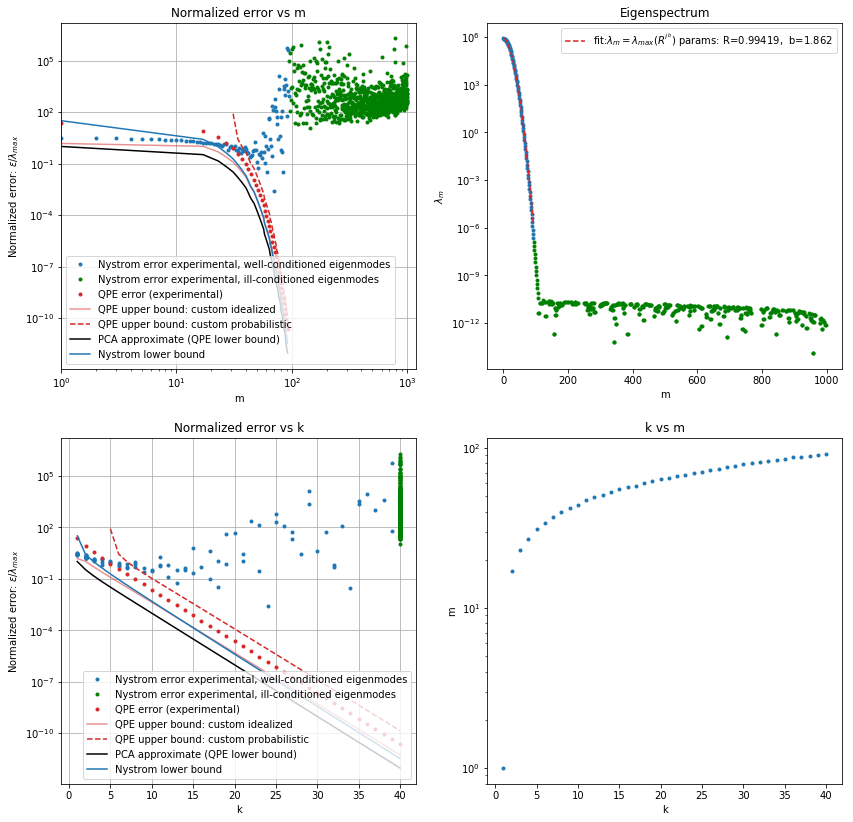

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  197097513089.4744


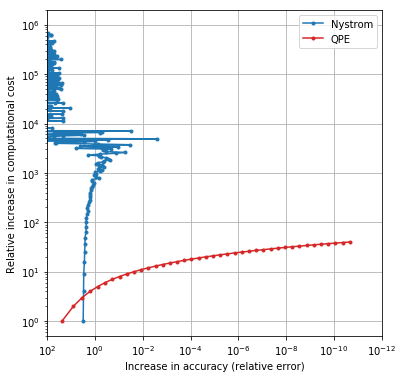

84
[0.9923552  1.84691428]


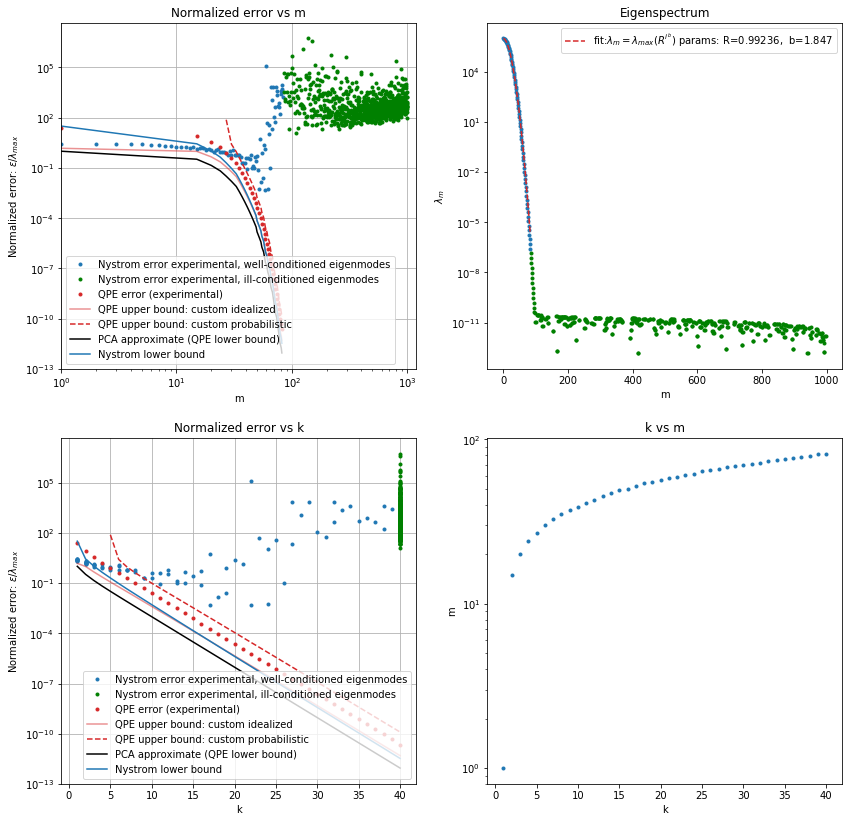

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -25625432518.946133


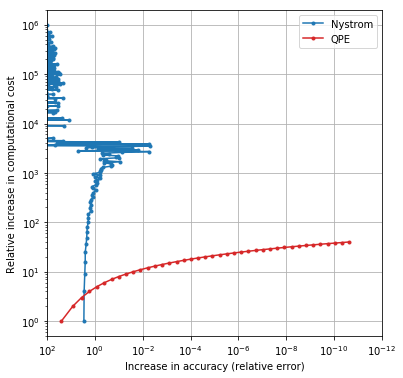

45
[0.96582185 1.73430054]


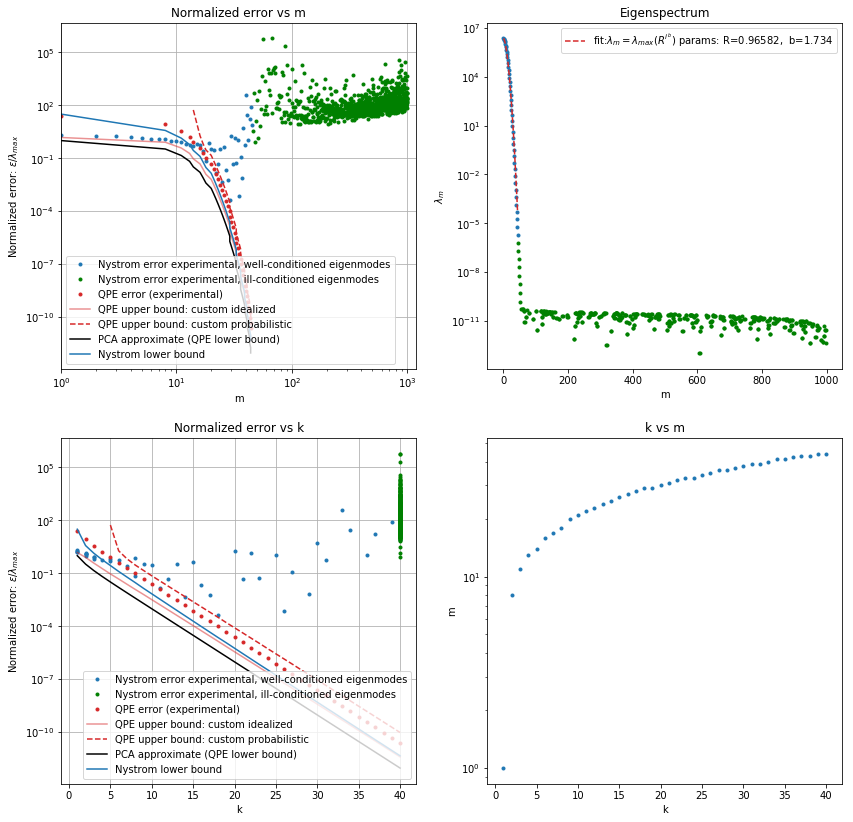

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  42759143067.46153


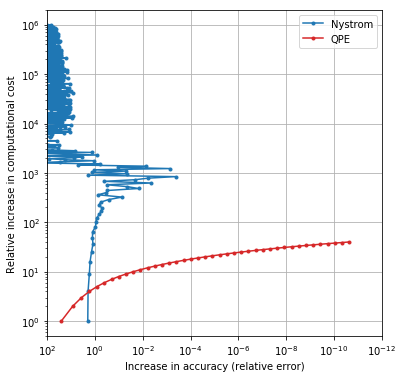

45
[0.96414226 1.72980218]


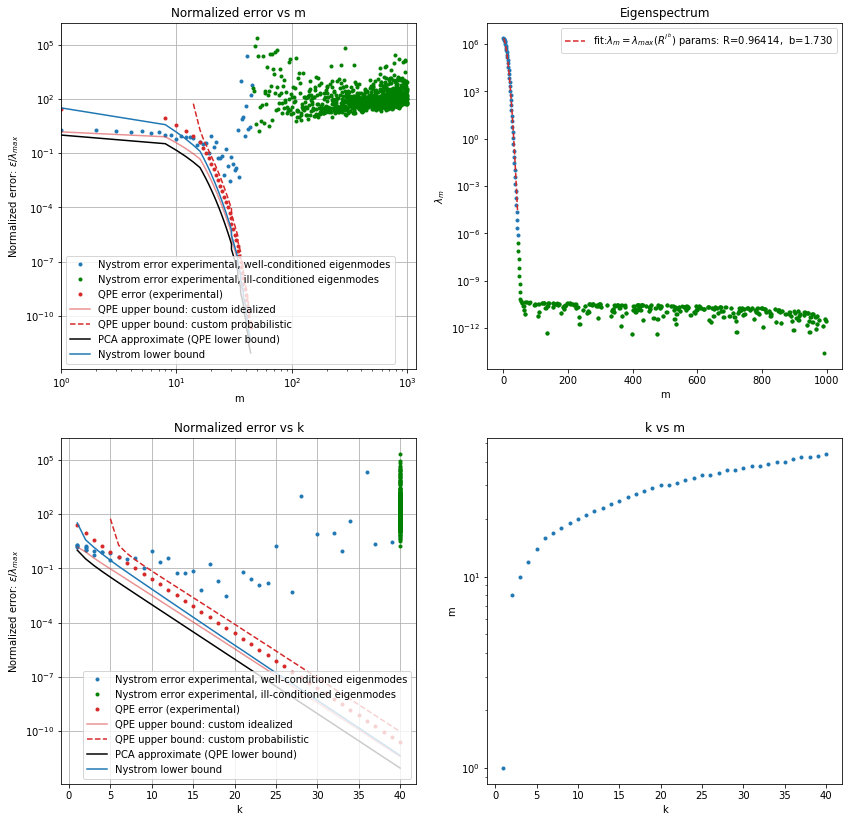

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -5689014924.032006


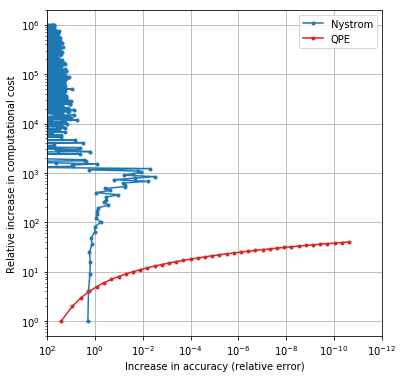

83
[0.99207062 1.84473984]


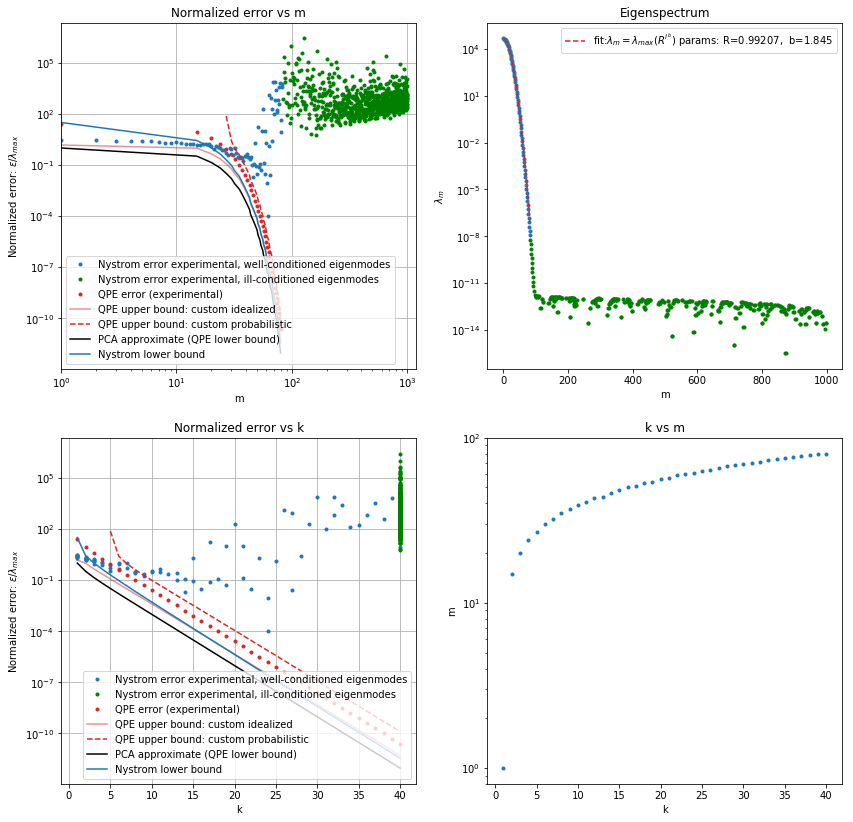

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -128984646822.60611


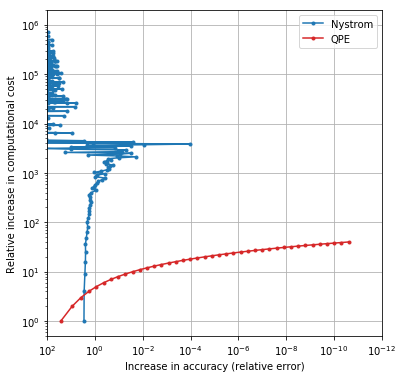

54
[0.977971   1.77271471]


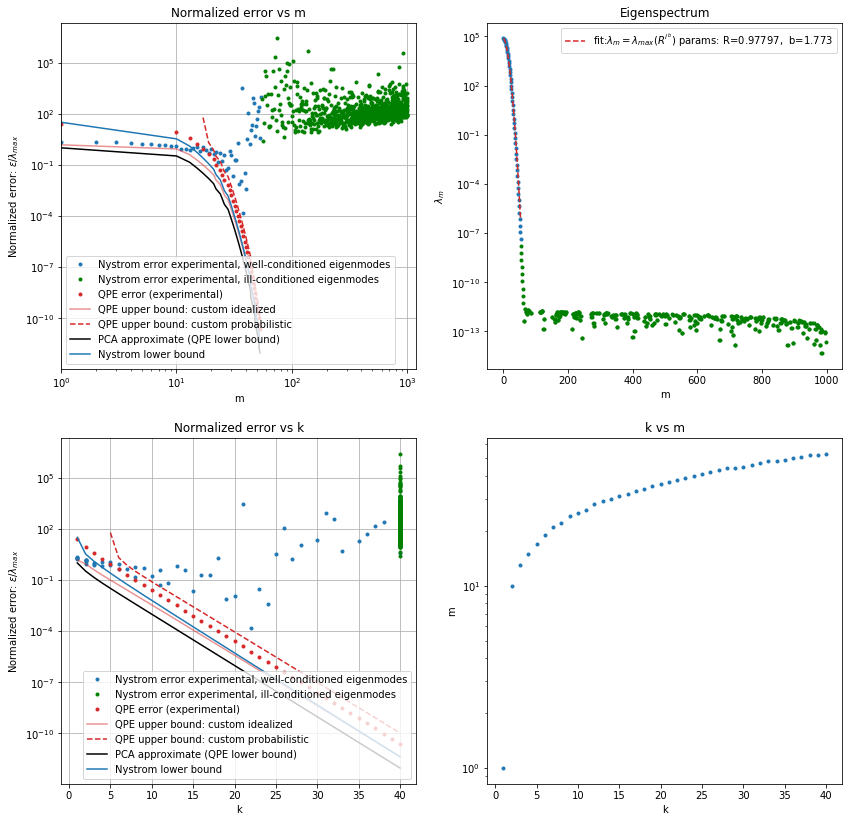

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -33189892167.80482


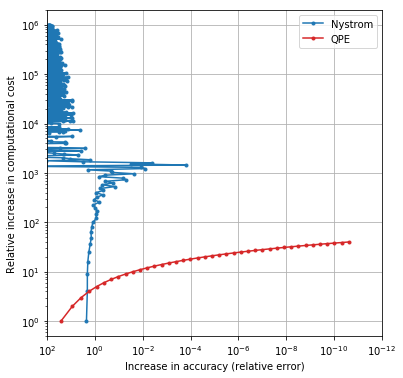

33
[0.92733457 1.6560611 ]


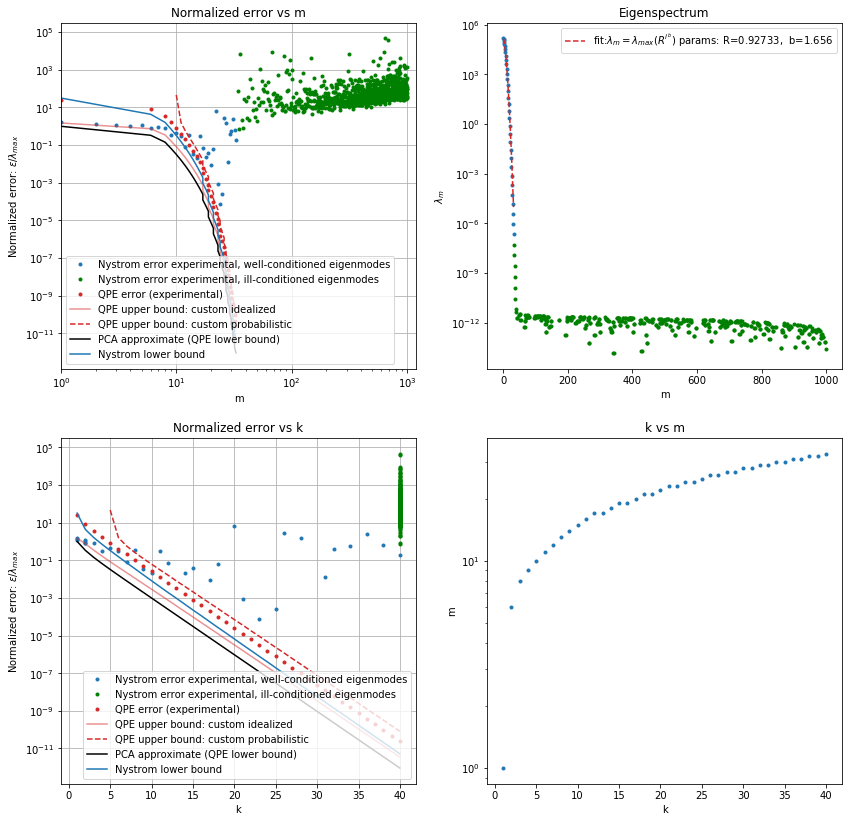

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  20497591395.984417


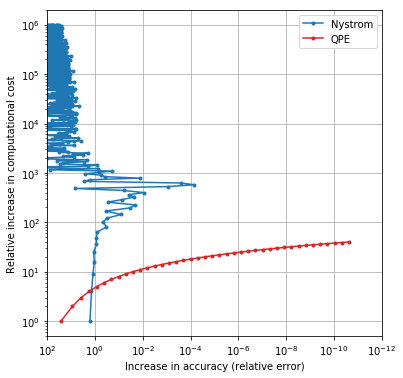

32
[0.92172754 1.64743711]


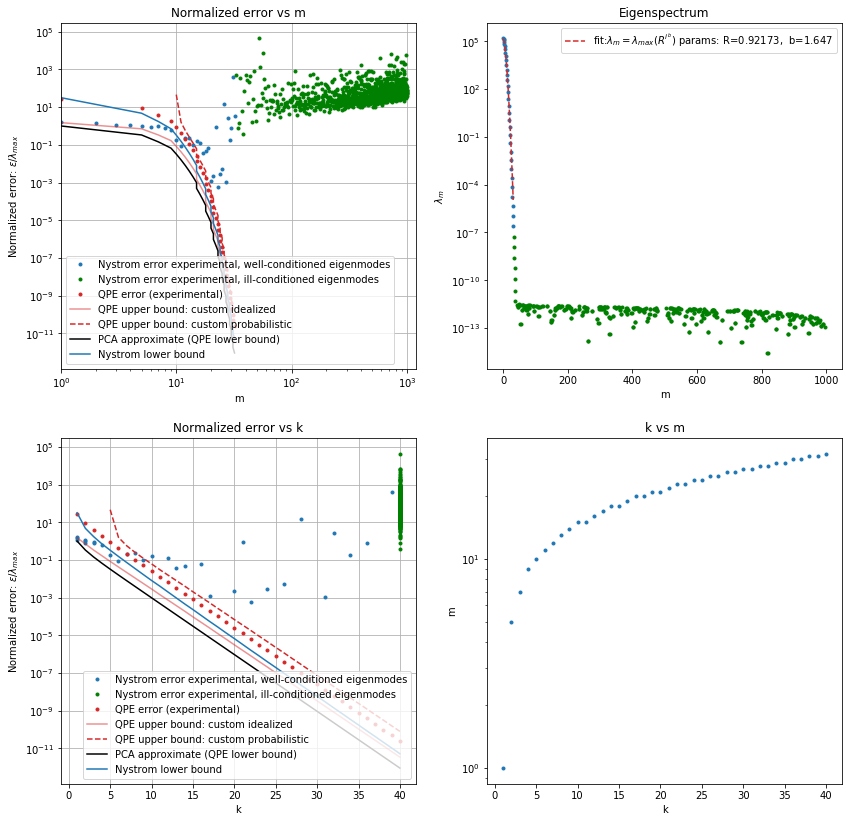

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -167690551.37641215


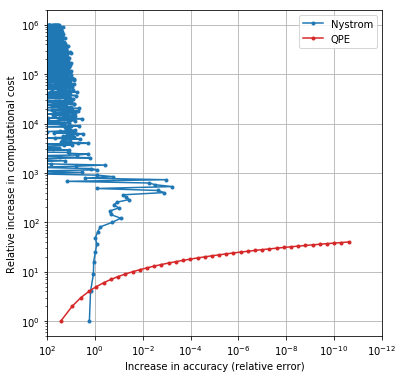

30
[0.90882669 1.62919511]


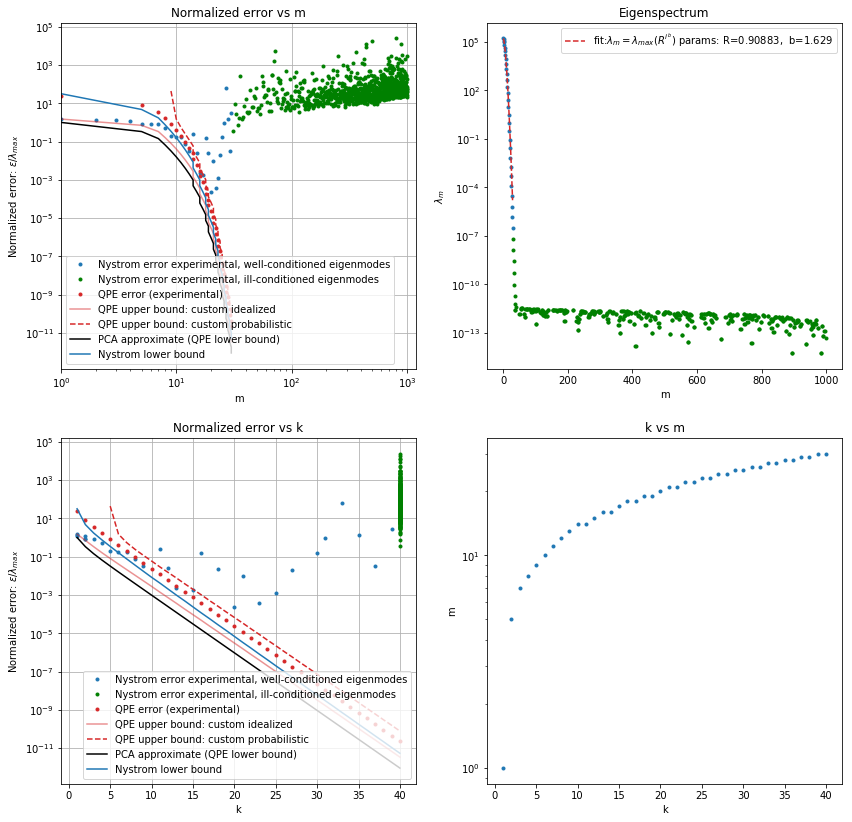

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -271478963.1350014


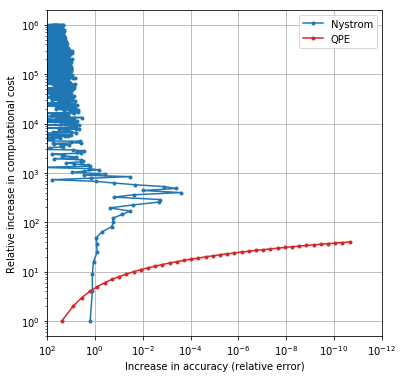

18
[0.69438147 1.46142978]


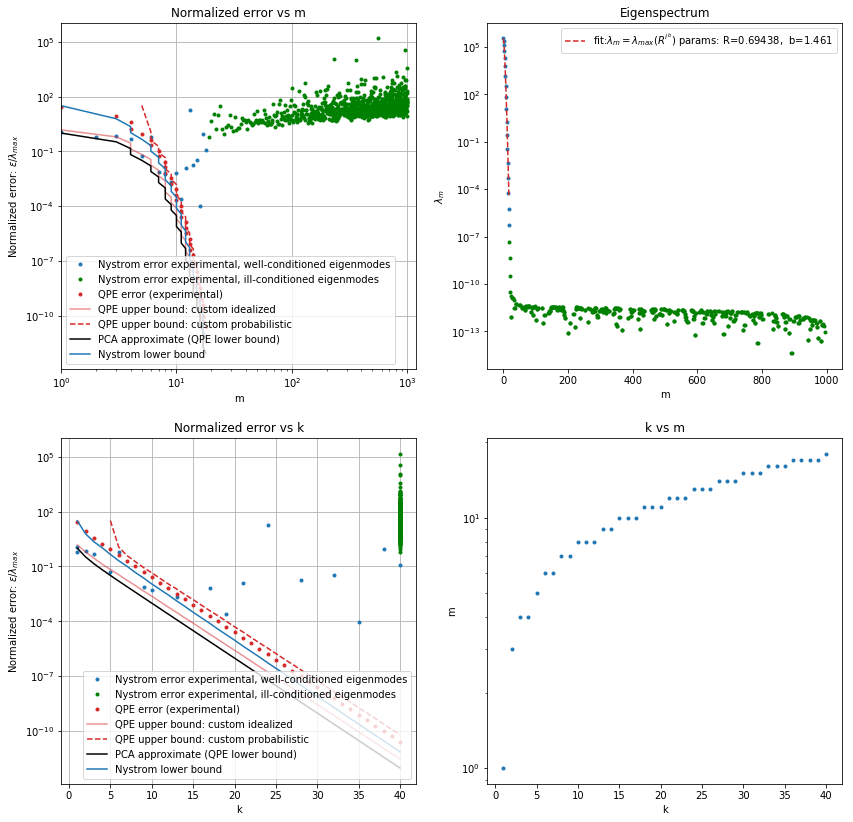

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  25330061.637023386


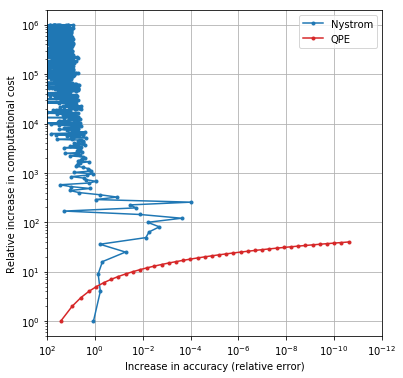

11
[0.37193665 1.35005797]


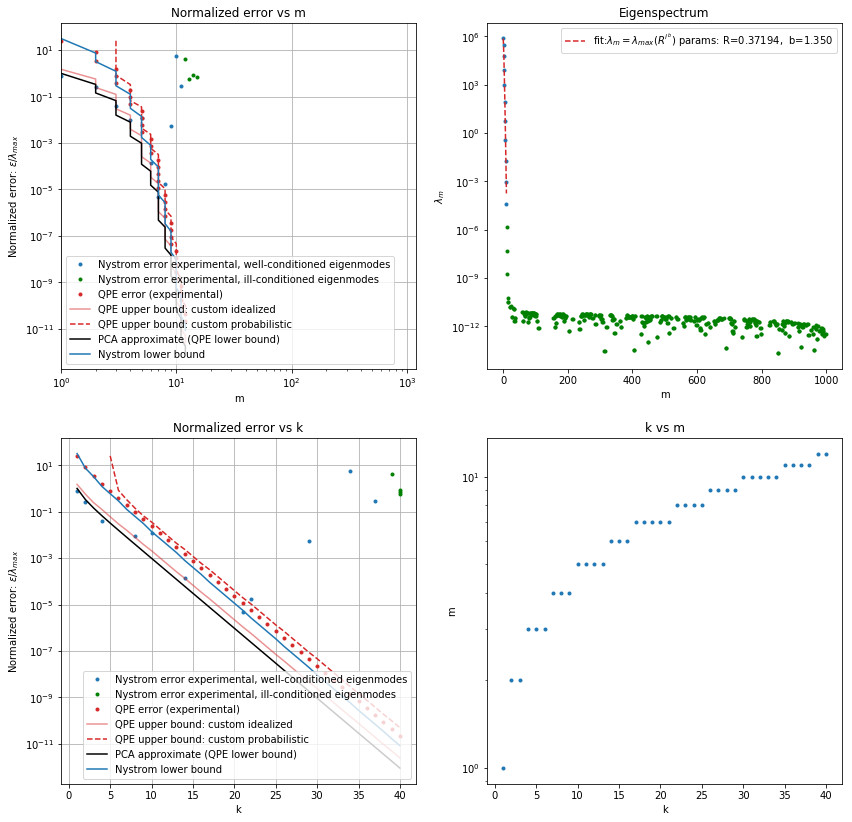

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -15688.96682292223


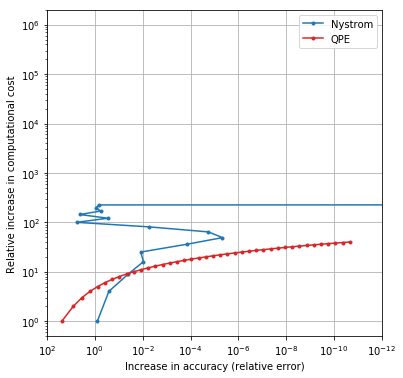

In [66]:
from scipy.interpolate import interp1d
de = 0.01


def func(x, r, b ):
    global lmax
    return  lmax* r ** x**b

R = []
b = []


for mat_num in range(len(test_matrix_list)):
    
    eig = np.linalg.eig(test_matrix_list[mat_num])[0]
    eig = eig.real
    cut_indx = np.max(np.where((eig/eig_max[mat_num])>1e-13))
    print(cut_indx)
    
    plt.figure(figsize = (14, 14))
    
    ############
    #1) ERROR VS M
    ###########
    
    plt.subplot(2, 2, 1)
    plt.loglog(m[:cut_indx], error_Nystrom[:cut_indx, mat_num]/eig_max[mat_num], 'C0.',
                 label = 'Nystrom error experimental, well-conditioned eigenmodes')
    plt.loglog(m[cut_indx:], error_Nystrom[cut_indx:, mat_num]/eig_max[mat_num], 'g.',
                 label = 'Nystrom error experimental, ill-conditioned eigenmodes')

    plt.loglog(m_QPE[:, mat_num], error_QPE[:, mat_num]/eig_max[mat_num],'.C3', label = 'QPE error (experimental)')#, marker = '.')
    
    
    plt.loglog(m_QPE[:, mat_num], bound_custom_simple(de, m_QPE[:, mat_num], n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: custom idealized')
    
    #CUTTING-OFF EIGENMODES THAT WERE ILL CONDITIONED (CAPPING THE KAPPA)
    bd = np.where(bound_custom(de, m_QPE[:, mat_num], n, k )<1e-12)
    bd = np.max(bd)+1
    xm = m_QPE[:, mat_num]
    plt.loglog(xm[bd:], bound_custom(de, m_QPE[:, mat_num], n, k )[bd:],'--',c = 'C3',
               label = 'QPE upper bound: custom probabilistic')
    plt.loglog(m_QPE[:, mat_num], PCA(k)*np.ones(m_QPE[:, mat_num].shape), 'k-', label = 'PCA approximate (QPE lower bound)')
    
    #COMPARISON ESTIMATED PCA ERROR(K) VS ESTIMATED FROM THE REAL EIGENVALUES
    #plt.loglog(m, eig/eig_max[mat_num], '--k',  label = 'Normalized eigenspectrum ')
    
    plt.loglog(m_QPE[:, mat_num], bound_nystrom_wang(m_QPE[:, mat_num], n, k), '-',  
               c = 'C0', label = 'Nystrom lower bound')
    
    plt.xlim([1, 1200])
    plt.xlabel('m')
    plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
    plt.legend()
    plt.title('Normalized error vs m')
    plt.grid(True)
    
    ##################
    #2) EIGENSPECTRUM VS M
    ##################
    
    plt.subplot(2, 2, 2)
    plt.semilogy(eig[:cut_indx], 'C0.')
    plt.semilogy(range(cut_indx, 1000), eig[cut_indx:], 'g.')
    #plt.semilogy(np.arange(1, 1001) , eig_max[mat_num]*0.998**np.arange(1, 1001))
    
         
    #iNTERPOLATING THEORETICAL EIGENVALUE DECAY - fitting THE R value
    lmax = eig_max[mat_num]
    xtemp = np.arange(0, cut_indx)
    popt, pcov = curve_fit(func, xtemp, eig[:cut_indx])
    R.append(popt[0])
    b.append(popt[1])     
        
    plt.semilogy(xtemp, func(xtemp, *popt), 'C3--', 
             label = 'fit:'+r'$\lambda_{m} = \lambda_{max}(R^{i^b})$ ' +'params: '+ 'R=%1.5f,  b=%5.3f' % tuple(popt))     
    print(popt)
    plt.legend()
    plt.xlabel('m')
    plt.ylabel(r'$\lambda_{m}$')
    plt.title('Eigenspectrum')    
    
    
    ##################
    #3) m VS k
    ##################
    
    plt.subplot(2, 2, 4)
    plt.semilogy(k, m_QPE[:, mat_num], '.')
    plt.title('k vs m')
    plt.ylabel('m')
    plt.xlabel('k')
    
    ##################
    #4) ERROR VS k
    ##################    
    
    
    plt.subplot(2, 2, 3)
    
    k_interpolated = interp1d(m_QPE[:, mat_num], k, kind='nearest', fill_value='extrapolate')
    
    plt.semilogy(k_interpolated(m[:cut_indx]), error_Nystrom[:cut_indx, mat_num]/eig_max[mat_num], 'C0.',
                 label = 'Nystrom error experimental, well-conditioned eigenmodes')
    plt.semilogy(k_interpolated(m[cut_indx:]), error_Nystrom[cut_indx:, mat_num]/eig_max[mat_num], 'g.',
                label = 'Nystrom error experimental, ill-conditioned eigenmodes')
    
    plt.semilogy(k, error_QPE[:, mat_num]/eig_max[mat_num],'C3.', label = 'QPE error (experimental)')
    
    plt.semilogy(k, bound_custom_simple(de, m_QPE[:, mat_num], n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: custom idealized')
    
    bd = np.where(bound_custom(de, m_QPE[:, mat_num], n, k )<1e-12)
    bd = np.max(bd)+1
    
    plt.semilogy(k[bd:], bound_custom(de, m_QPE[:, mat_num], n, k )[bd:],'--',c = 'C3',
               label = 'QPE upper bound: custom probabilistic')
    plt.semilogy(k, PCA(k)*np.ones(m_QPE[:, mat_num].shape), 'k-', label = 'PCA approximate (QPE lower bound)')
    plt.semilogy(k, bound_nystrom_wang(m_QPE[:, mat_num], n, k), '-',  c = 'C0', label = 'Nystrom lower bound')

    #NYSTROM BOUND CALCULATED FROM THE ACTUAL EIGENVALUES INSTEAD OF THE qpe ESTIMATE 1/(2^K-1) 
    #(BUT THEY ARE REALLY CLOSE)
    '''
    eig_m1 = interp1d(m, eig, kind='nearest', fill_value='extrapolate')    
    plt.semilogy(k, bound_nystrom_wang_corrected(m_QPE[:, mat_num], n, eig_m1(m_QPE[:, mat_num]))/eig_max[mat_num],
                 '-*',  c = 'C0', label = 'Nystrom lower bound correccted')
    '''
    plt.xlabel('k')
    plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
    plt.title('Normalized error vs k')
    plt.legend(loc = 'lower right')
    plt.grid(True)
    plt.show()
    
    print('Verifying Nystrom error\n')
    print('Sum diagonal Knn^[-1] @ Knn: ', np.sum(np.linalg.inv(test_matrix_list[mat_num])@test_matrix_list[mat_num]))
    
    
    plt.figure(figsize = (6, 6))
    plt.loglog(error_Nystrom[:, mat_num]/eig_max[mat_num], m**2.,'.-C0', label = 'Nystrom')
    plt.loglog( error_QPE[:, mat_num]/eig_max[mat_num], k, '.-C3', label = 'QPE')
    plt.ylabel('Relative increase in computational cost')
    plt.xlabel('Increase in accuracy (relative error)')
    plt.xlim([1e2, 1e-12])
    plt.ylim([0.5, 2e6])
    plt.grid(True)
    plt.legend()
    plt.show()
    
#last sample  - matrix is singular


In [63]:
import pprint
pprint.pprint(np.array([R, b]).T)

array([[0.99998678, 1.998241  ],
       [0.99998834, 2.03063762],
       [0.99993397, 1.9807911 ],
       [0.99990282, 1.97693465],
       [0.99980029, 1.96757601],
       [0.96000872, 1.71934041],
       [0.99933216, 1.94428909],
       [0.99202747, 1.84441481],
       [0.98929135, 1.82586799],
       [0.98388858, 1.79720085],
       [0.90353185, 1.62225963],
       [0.88571538, 1.60083273],
       [0.72787179, 1.47870732],
       [0.70306925, 1.46572422],
       [0.999412  , 1.94733713],
       [0.99761079, 1.90390025],
       [0.99710036, 1.89592476],
       [0.99365394, 1.85759984],
       [0.98436082, 1.79941188],
       [0.96096859, 1.72169815],
       [0.95510414, 1.70788896],
       [0.99939295, 1.94658816],
       [0.99897371, 1.93279681],
       [0.99773593, 1.90601987],
       [0.99419186, 1.86245871],
       [0.9923552 , 1.84691428],
       [0.96582185, 1.73430054],
       [0.96414226, 1.72980218],
       [0.99207062, 1.84473984],
       [0.977971  , 1.77271471],
       [0.

Text(0, 0.5, 'b')

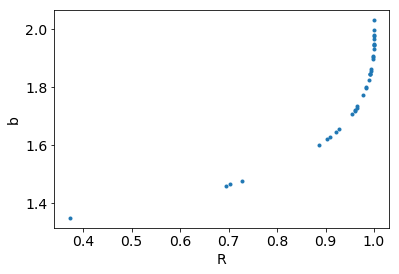

In [149]:
plt.plot(R, b, '.')
plt.xlabel('R')
plt.ylabel('b')

# Errors on benchmarking functions

benchmark_matrix.pickle - matrices generated with composite kernels

In [49]:
f2 = open('benchmark_matrix.pickle', 'rb')
mat_benchmarks_list = pickle.load(f2)
f2.close()

## Nystrom errors

In [24]:
mat_benchmarks_list[0].shape

NameError: name 'mat_benchmarks_list' is not defined

In [55]:
error_Nystrom_b = np.zeros((m.size, len(mat_benchmarks_list)))
error_QPE_b = np.zeros((k.size, len(mat_benchmarks_list)))


#GENERATING NYSTRoM ERROR DATA 
regenerate_Nystrom = False
if regenerate_Nystrom:
    for mat_num in range(len(mat_benchmarks_list)):
        print('Sample: ', mat_num)
        for i in m:
            error_Nystrom_b[int(i-1), mat_num] = np.linalg.norm(mat_benchmarks_list[mat_num] - 
                                                             Nystrom(mat_benchmarks_list[mat_num], i), 'fro')

    f=open('Nystrom_err_benchmarks.pickle','wb')
    pickle.dump(error_Nystrom_b, f)
    f.close()        

        

Sample:  0
Sample:  1
Sample:  2
Sample:  3


In [96]:
eig_max_b  = []

for mat_num in range(len(mat_benchmarks_list)):
    eig_max_b.append(np.max(np.linalg.eigvals(mat_benchmarks_list[mat_num])).real)
    print(mat_num)

0
1
2
3


In [101]:
for mat_num in range(len(mat_benchmarks_list)):
    print(np.max(np.linalg.eigvals(mat_benchmarks_list[mat_num])))
    print(mat_num)

196627.77097116108
0
(140543574.86386907+0j)
1
(1819268449.406254+0j)
2
(45360770329.49661+0j)
3


## QPE errors

In [57]:
m_QPE_p = np.zeros((k.size, len(mat_benchmarks_list)))
error_QPE_p = np.zeros((k.size, len(mat_benchmarks_list)))

recalculate = True #safety switch

if recalculate:
    for mat_num in range(len(mat_benchmarks_list)):
        for i in k:
            Aqpetemp, m_QPE_p[int(i-1), mat_num] = QPE_approx(mat_benchmarks_list[mat_num], i)
            error_QPE_p[int(i-1), mat_num] = np.linalg.norm(mat_benchmarks_list[mat_num] - Aqpetemp, 'fro')

        print(mat_num)    
    f=open('QPE-m_error_benchmark.pickle','wb')
    pickle.dump([error_QPE_p, m_QPE_p], f)
    f.close()

0
1
2
3


999
[0.00303661 0.14355395]


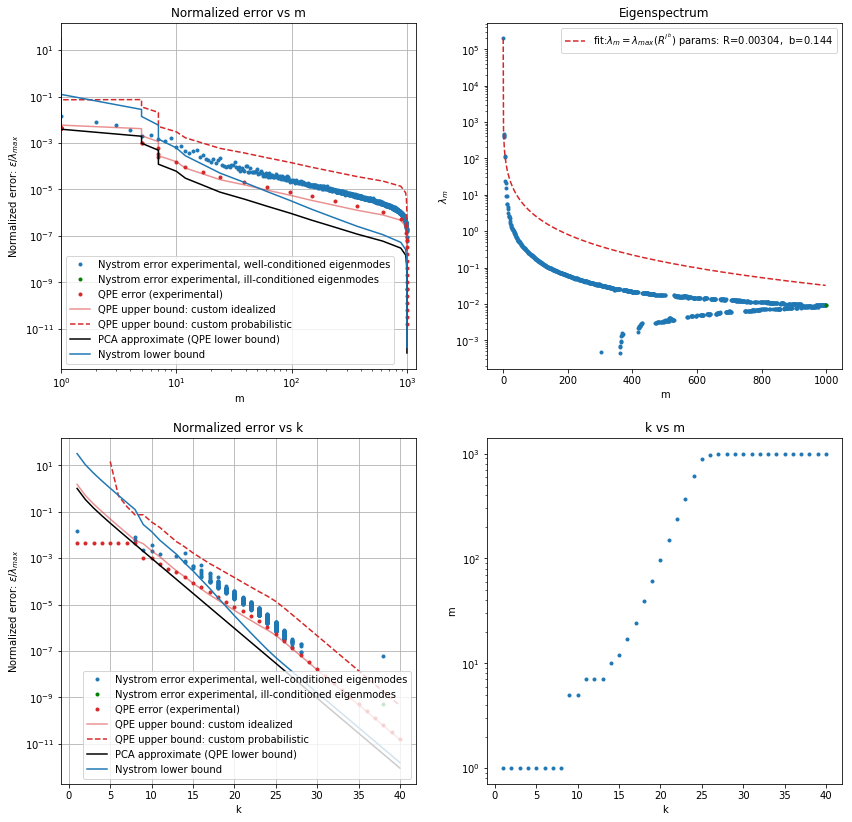

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  999.9999997768252


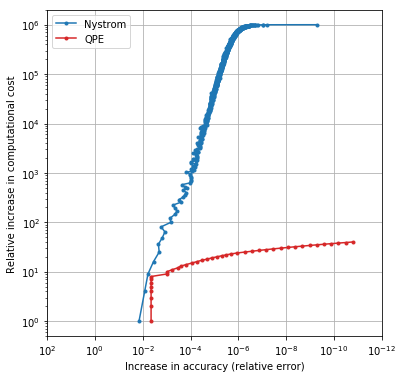

815


TypeError: Cannot cast array data from dtype('complex128') to dtype('float64') according to the rule 'safe'

error: Result from function call is not a proper array of floats.

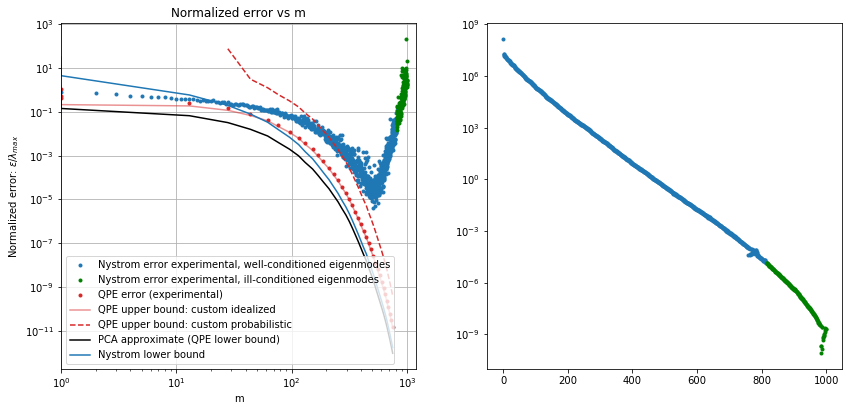

In [68]:
make_error_plots(mat_benchmarks_list, error_Nystrom_b, error_QPE_p, m , m_QPE_p, n, k,  eig_max_b)

999
[0.00303661 0.14355395]


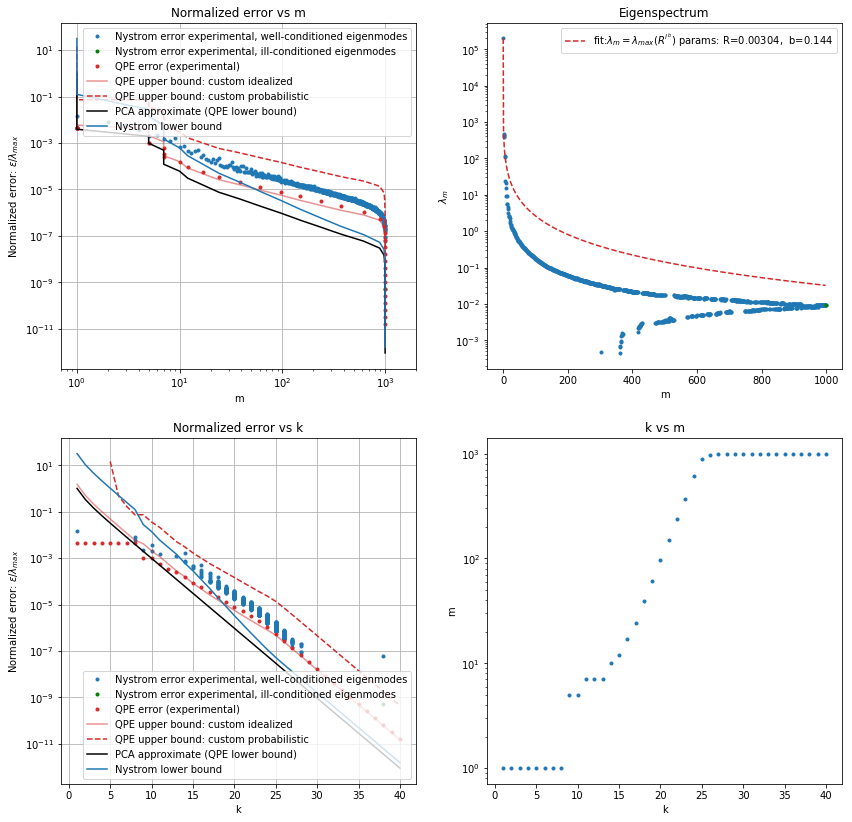

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  999.9999997768252


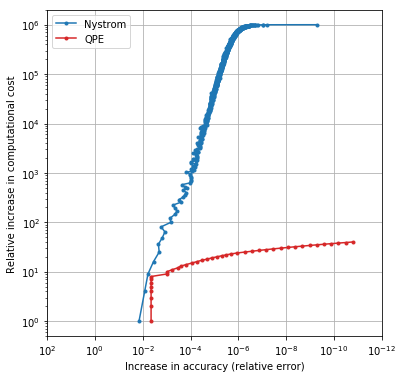

815
[0.1914768  0.23853674]


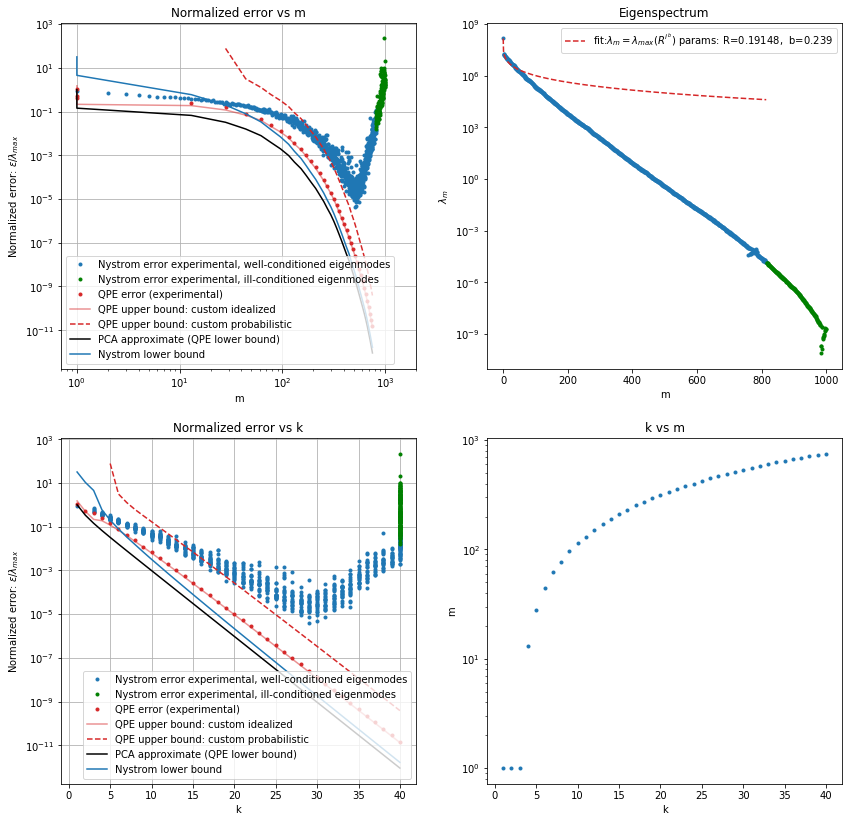

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  846.5240419382462


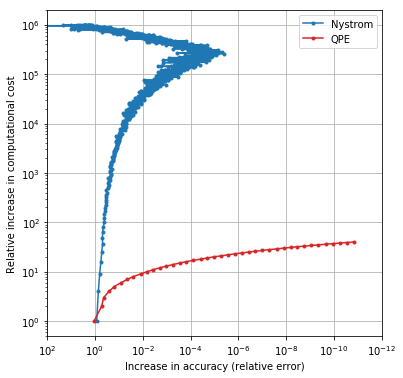

817
[0.93371642 0.86765305]


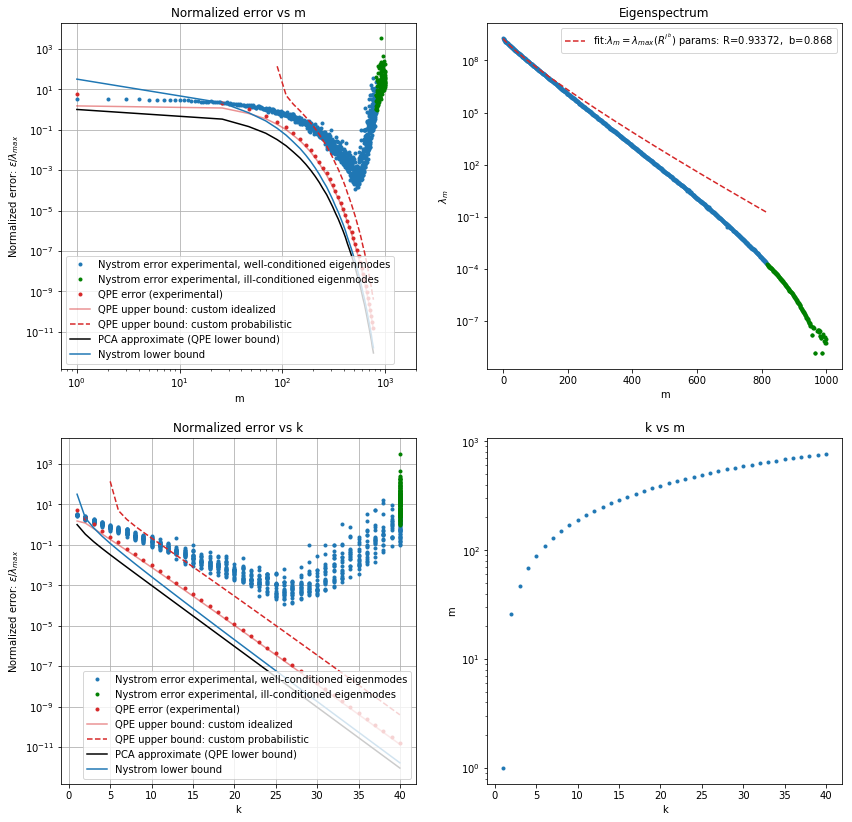

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  1290.2101592464242


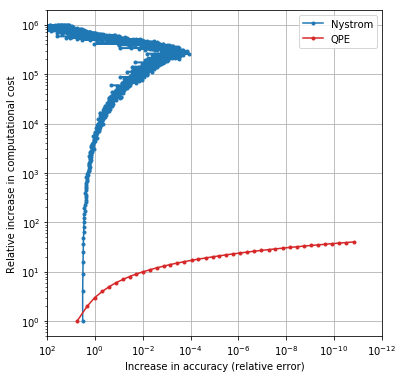

666
[0.9256032  0.89998404]


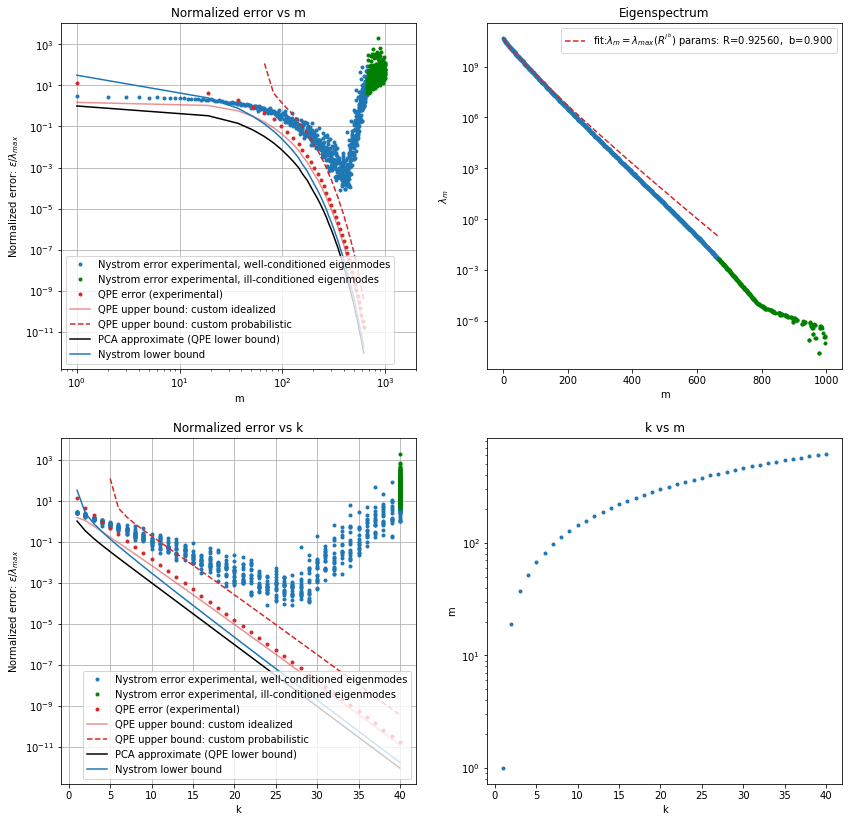

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  2431.155060261488


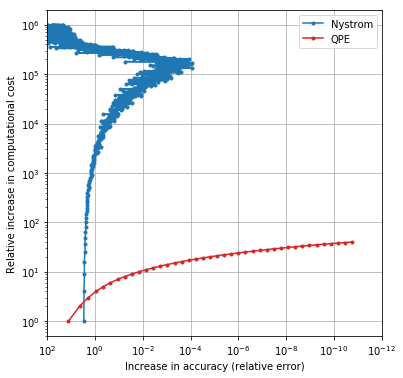

In [138]:
from scipy.interpolate import interp1d
de = 0.01


def func(x, r, b ):
    global lmax
    return  lmax* r ** x**b

R = []
b = []


#def make_error_plots(matrix_list, error_N, error_Q, m , m_QPE, n, k, eig_max_b):
#    global lmax
matrix_list = mat_benchmarks_list
error_N = error_Nystrom_b
error_Q = error_QPE_p
m_QPE_b = m_QPE_p


for mat_num in range(len(matrix_list)):

    eig = np.linalg.eigvals(matrix_list[mat_num])
    eig = eig.real
    cut_indx = np.max(np.where((eig/eig_max_b[mat_num])>1e-13))
    print(cut_indx)

    plt.figure(figsize = (14, 14))

    ############
    #1) ERROR VS M
    ###########

    plt.subplot(2, 2, 1)
    plt.loglog(m[:cut_indx], error_N[:cut_indx, mat_num]/eig_max_b[mat_num], 'C0.',
                 label = 'Nystrom error experimental, well-conditioned eigenmodes')
    plt.loglog(m[cut_indx:], error_N[cut_indx:, mat_num]/eig_max_b[mat_num], 'g.',
                 label = 'Nystrom error experimental, ill-conditioned eigenmodes')

    plt.loglog(m_QPE_b[:, mat_num], error_Q[:, mat_num]/eig_max_b[mat_num],'.C3', label = 'QPE error (experimental)')#, marker = '.')


    plt.loglog(m_QPE_b[:, mat_num], bound_custom_simple(de, m_QPE_b[:, mat_num], n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: custom idealized')

    #CUTTING-OFF EIGENMODES THAT WERE ILL CONDITIONED (CAPPING THE KAPPA)
    bd = np.where(bound_custom(de, m_QPE_b[:, mat_num], n, k )<1e-12)
    bd = np.max(bd)+1
    xm = m_QPE_b[:, mat_num]
    plt.loglog(xm[bd:], bound_custom(de, m_QPE_b[:, mat_num], n, k )[bd:],'--',c = 'C3',
               label = 'QPE upper bound: custom probabilistic')
    plt.loglog(m_QPE_b[:, mat_num], PCA(k)*np.ones(m_QPE_b[:, mat_num].shape), 'k-', label = 'PCA approximate (QPE lower bound)')

    #COMPARISON ESTIMATED PCA ERROR(K) VS ESTIMATED FROM THE REAL EIGENVALUES
    #plt.loglog(m, eig/eig_max[mat_num], '--k',  label = 'Normalized eigenspectrum ')

    plt.loglog(m_QPE_b[:, mat_num], bound_nystrom_wang(m_QPE_b[:, mat_num], n, k), '-',  
               c = 'C0', label = 'Nystrom lower bound')

    plt.xlim([0.7, 2000])
    plt.xlabel('m')
    plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
    plt.legend()
    plt.title('Normalized error vs m')
    plt.grid(True)

    ##################
    #2) EIGENSPECTRUM VS M
    ##################

    plt.subplot(2, 2, 2)
    plt.semilogy(eig[:cut_indx], 'C0.')
    plt.semilogy(range(cut_indx, 1000), eig[cut_indx:], 'g.')
    #plt.semilogy(np.arange(1, 1001) , eig_max[mat_num]*0.998**np.arange(1, 1001))


    #iNTERPOLATING THEORETICAL EIGENVALUE DECAY - fitting THE R value
    lmax = eig_max_b[mat_num]
    xtemp = np.arange(0, cut_indx)
    popt, pcov = curve_fit(func, xtemp, eig[:cut_indx])
    R.append(popt[0])
    b.append(popt[1])     

    plt.semilogy(xtemp, func(xtemp, *popt), 'C3--', label = 'fit:'+r'$\lambda_{m} = \lambda_{max}(R^{i^b})$ ' +'params: '+ 'R=%1.5f,  b=%5.3f' % tuple(popt))     
    print(popt)
    plt.legend()
    plt.xlabel('m')
    plt.ylabel(r'$\lambda_{m}$')
    plt.title('Eigenspectrum')    


    ##################
    #3) m VS k
    ##################

    plt.subplot(2, 2, 4)
    plt.semilogy(k, m_QPE_b[:, mat_num], '.')
    plt.title('k vs m')
    plt.ylabel('m')
    plt.xlabel('k')

    ##################
    #4) ERROR VS k
    ##################    


    plt.subplot(2, 2, 3)

    k_interpolated = interp1d(m_QPE_b[:, mat_num], k, kind='nearest', fill_value='extrapolate')

    plt.semilogy(k_interpolated(m[:cut_indx]), error_N[:cut_indx, mat_num]/eig_max_b[mat_num], 'C0.',
                 label = 'Nystrom error experimental, well-conditioned eigenmodes')
    plt.semilogy(k_interpolated(m[cut_indx:]), error_N[cut_indx:, mat_num]/eig_max_b[mat_num], 'g.',
                 label = 'Nystrom error experimental, ill-conditioned eigenmodes')

    plt.semilogy(k, error_Q[:, mat_num]/eig_max_b[mat_num],'C3.', label = 'QPE error (experimental)')

    plt.semilogy(k, bound_custom_simple(de, m_QPE_b[:, mat_num], n, k ), '-', c = 'C3',alpha =0.5, 
                 label = 'QPE upper bound: custom idealized')

    bd = np.where(bound_custom(de, m_QPE_b[:, mat_num], n, k )<1e-12)
    bd = np.max(bd)+1

    plt.semilogy(k[bd:], bound_custom(de, m_QPE_b[:, mat_num], n, k )[bd:],'--',c = 'C3',label = 'QPE upper bound: custom probabilistic')
    plt.semilogy(k, PCA(k)*np.ones(m_QPE_b[:, mat_num].shape), 'k-', label = 'PCA approximate (QPE lower bound)')
    plt.semilogy(k, bound_nystrom_wang(m_QPE_b[:, mat_num], n, k), '-',  c = 'C0', label = 'Nystrom lower bound')

    #NYSTROM BOUND CALCULATED FROM THE ACTUAL EIGENVALUES INSTEAD OF THE qpe ESTIMATE 1/(2^K-1) 
    #(BUT THEY ARE REALLY CLOSE)
    '''
    eig_m1 = interp1d(m, eig, kind='nearest', fill_value='extrapolate')    
    plt.semilogy(k, bound_nystrom_wang_corrected(m_QPE[:, mat_num], n, eig_m1(m_QPE[:, mat_num]))/eig_max[mat_num],
                 '-*',  c = 'C0', label = 'Nystrom lower bound correccted')
    '''
    plt.xlabel('k')
    plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
    plt.title('Normalized error vs k')
    plt.legend(loc = 'lower right')
    plt.grid(True)
    plt.show()

    print('Verifying Nystrom error\n')
    print('Sum diagonal Knn^[-1] @ Knn: ', np.sum(np.linalg.inv(matrix_list[mat_num])@matrix_list[mat_num]))


    plt.figure(figsize = (6, 6))
    plt.loglog(error_N[:, mat_num]/eig_max_b[mat_num], m**2.,'.-C0', label = 'Nystrom')
    plt.loglog( error_Q[:, mat_num]/eig_max_b[mat_num], k, '.-C3', label = 'QPE')
    plt.ylabel('Relative increase in computational cost')
    plt.xlabel('Increase in accuracy (relative error)')
    plt.xlim([1e2, 1e-12])
    plt.ylim([0.5, 2e6])
    plt.grid(True)
    plt.legend()
    plt.show()

#last sample  - matrix is singular


In [22]:
ls = np.array([0, 1])
bv = np.where(ls>2)

if bv is not None:
    print('a')

a


array([], dtype=int64)

## Plotting function

In [19]:
from textwrap import wrap
from scipy.interpolate import interp1d
from matplotlib import gridspec






def make_error_plots(matrix, error_N, error_QPE, m , m_QPE, k, 
                     suptitle = 'Numerical verification of the error bounds',
                     split_eigs = False, savepath = None, loglog = True, four_plots = True, de = 0.01):
    #    global lmax
    #matrix_list = mat_benchmarks_list
    #error_N = error_Nystrom_b
    #error_Q = error_QPE_p
    #m_QPE_b = m_QPE_p
    
    def func(x, r, b ):
        '''
        function for interpolating the
        eigenspectrum decay
        '''


        lmax = x[0]
        xtemp = x[1]
        return  lmax* r ** xtemp**b

    R = []
    b = []
    
    n = matrix.shape[0]

    eig = np.linalg.eigvals(matrix)
    eig = eig.real
    eig_max = np.max(eig)
    cut_indx = np.max(np.where((eig/eig_max)>1e-13))
    print(cut_indx)

    fig = plt.figure(figsize = (12, 11))
    
    gs = gridspec.GridSpec(2, 2, height_ratios=[1.7, 1]) 
    
    if not four_plots:
        gs = gridspec.GridSpec(1, 2) 
        fig = plt.figure(figsize = (12, 6))
       
    
    ############
    #1) ERROR VS M
    ###########

    ax1 = fig.add_subplot(gs[0])
    if loglog:
        if split_eigs:
            ax1.loglog(m[:cut_indx], error_N[:cut_indx]/eig_max, 'C0.',
                         label = 'Nystrom error experimental, well-conditioned eigenmodes')
            ax1.loglog(m[cut_indx:], error_N[cut_indx:]/eig_max, 'g.',
                         label = 'Nystrom error experimental, ill-conditioned eigenmodes')
        else:
            ax1.loglog(m, error_N/eig_max, 'C0.',
                 label = 'Nystrom error (experimental)')
        #QPE
        ax1.loglog(m_QPE, error_QPE/eig_max,'*C3', label = 'QPE error (experimental)')#, marker = '.')


        ax1.loglog(m_QPE, bound_nystrom_wang(m_QPE, n, k), '-',  
               c = 'C0', label = 'Nystrom lower bound')

        ax1.loglog(m_QPE, bound_custom_simple(de, m_QPE, n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: idealized')

        ax1.loglog(m_QPE, PCA(k)*np.ones(m_QPE.shape), 'k-', label = 'PCA approx. (QPE lower bound)')


        #CUTTING-OFF EIGENMODES THAT WERE ILL CONDITIONED (CAPPING THE KAPPA)

        if min(bound_custom(de, m_QPE, n, k )<1e-12):
            bd = np.where(bound_custom(de, m_QPE, n, k )<1e-12) 
            bd = np.max(bd)+1
        else:
            bd = 0
        xm = m_QPE
        ax1.loglog(xm[bd:], bound_custom(de, m_QPE, n, k )[bd:],'--',c = 'C3',
                   label = 'QPE upper bound: probabilistic')
        plt.xlim([0.8, 2000])
    else:
        if split_eigs:
            ax1.semilogy(m[:cut_indx], error_N[:cut_indx]/eig_max, 'C0.',
                         label = 'Nystrom error experimental, well-conditioned eigenmodes')
            ax1.semilogy(m[cut_indx:], error_N[cut_indx:]/eig_max, 'g.',
                         label = 'Nystrom error experimental, ill-conditioned eigenmodes')
        else:
            ax1.semilogy(m, error_N/eig_max, 'C0.',
                 label = 'Nystrom error (experimental)')
        #QPE
        ax1.semilogy(m_QPE, error_QPE/eig_max,'*C3', label = 'QPE error (experimental)')#, marker = '.')


        ax1.semilogy(m_QPE, bound_nystrom_wang(m_QPE, n, k), '-',  
               c = 'C0', label = 'Nystrom lower bound')

        ax1.semilogy(m_QPE, bound_custom_simple(de, m_QPE, n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: idealized')

        ax1.semilogy(m_QPE, PCA(k)*np.ones(m_QPE.shape), 'k-', label = 'PCA approx. (QPE lower bound)')


        #CUTTING-OFF EIGENMODES THAT WERE ILL CONDITIONED (CAPPING THE KAPPA)

        if min(bound_custom(de, m_QPE, n, k ))<1e-12:
            bd = np.where(bound_custom(de, m_QPE, n, k )<1e-12) 
            bd = np.max(bd)+1
        else:
            bd = 1
        xm = m_QPE
        ax1.semilogy(xm[bd:], bound_custom(de, m_QPE, n, k )[bd:],'--',c = 'C3',
                   label = 'QPE upper bound: probabilistic')

        plt.xlim([0.8, 120])

    #COMPARISON ESTIMATED PCA ERROR(K) VS ESTIMATED FROM THE REAL EIGENVALUES
    #plt.loglog(m, eig/eig_max[mat_num], '--k',  label = 'Normalized eigenspectrum ')



    
    plt.xlabel('m')
    plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
    #plt.legend()
    plt.title('Normalized error vs. m')
    plt.grid(True)

    handles, labels = ax1.get_legend_handles_labels()
    labels_wrapped = [ '\n'.join(wrap(l, 50)) for l in labels]
    
    
    
    ##################
    #2) ERROR VS k
    ##################    
    ax2 = fig.add_subplot(gs[1])
    
    m_interp , indices = np.unique(m_QPE, return_index = True)
    k_interp = k[indices]
    k_interpolated = interp1d(m_interp, k_interp, kind='nearest', fill_value='extrapolate')

    if split_eigs:
        ax2.semilogy(k_interpolated(m[:cut_indx]), error_N[:cut_indx]/eig_max, 'C0.',
                     label = 'Nystrom error experimental, well-conditioned eigenmodes')
        ax2.semilogy(k_interpolated(m[cut_indx:]), error_N[cut_indx:]/eig_max, 'g.',
                     label = 'Nystrom error experimental, ill-conditioned eigenmodes')

    else:
        ax2.semilogy(k_interpolated(m), error_N/eig_max, 'C0.',
                     label = 'Nystrom error experimental')
        
        
    ax2.semilogy(k, bound_nystrom_wang(m_QPE, n, k), '-',  c = 'C0', label = 'Nystrom lower bound')
    
    ax2.semilogy(k, error_QPE/eig_max,'C3*', label = 'QPE error (experimental)')
    ax2.semilogy(k, bound_custom_simple(de, m_QPE, n, k ), '-', c = 'C3',alpha =0.5, 
                 label = 'QPE upper bound: idealized')

    bd = np.where(bound_custom(de, m_QPE, n, k )<1e-12)
    bd = np.max(bd)+1

    ax2.semilogy(k[bd:], bound_custom(de, m_QPE, n, k )[bd:],'--',c = 'C3',label = 'QPE upper bound: probabilistic')
    ax2.semilogy(k, PCA(k)*np.ones(m_QPE.shape), 'k-', label = 'PCA approximate (QPE lower bound)')
    

    #NYSTROM BOUND CALCULATED FROM THE ACTUAL EIGENVALUES INSTEAD OF THE qpe ESTIMATE 1/(2^K-1) 
    #(BUT THEY ARE REALLY CLOSE)
    '''
    eig_m1 = interp1d(m, eig, kind='nearest', fill_value='extrapolate')    
    plt.semilogy(k, bound_nystrom_wang_corrected(m_QPE[:, mat_num], n, eig_m1(m_QPE[:, mat_num]))/eig_max[mat_num],
                 '-*',  c = 'C0', label = 'Nystrom lower bound correccted')
    '''
    
    plt.xlabel('k')
    plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
    plt.title('Normalized error vs. k')
    plt.grid(True)
    
    
    
    ##################
    #3) EIGENSPECTRUM VS M
    ##################
    if four_plots:
        ax3 = fig.add_subplot(gs[2])
        if split_eigs:
            ax3.semilogy(eig[:cut_indx], 'C0.')
            ax3.semilogy(range(cut_indx, 1000), eig[cut_indx:], 'g.')
        else:
            ax3.semilogy(eig, 'k.', label = 'eigenvalues')
        #plt.semilogy(np.arange(1, 1001) , eig_max[mat_num]*0.998**np.arange(1, 1001))


        #iNTERPOLATING THEORETICAL EIGENVALUE DECAY - fitting THE R value
        xtemp = np.arange(0, cut_indx)
        lmax = eig_max# * np.ones(xtemp.shape)
        x_f_vars =  [lmax, xtemp]
        popt, pcov = curve_fit(func,x_f_vars, eig[:cut_indx])
        R.append(popt[0])
        b.append(popt[1])     

        ax3.semilogy(xtemp, func(x_f_vars, *popt), 'C1--', 
                     label = 'fit: '+r'$\lambda_{m} = \lambda_{max}(R^{{i}^b})$ ' +'\n'+ 
                     'R=%1.5f,  b=%5.3f' % tuple(popt))

        print(popt)
        plt.legend()
        plt.xlabel('m')
        plt.ylabel(r'$\lambda_{m}$')
        plt.title('System eigenspectrum')    
        plt.grid(True)

        ##################
        #3) m VS k
        ##################

        ax4 = fig.add_subplot(gs[3])
        ax4.semilogy(k, m_QPE, '.k', label = 'experimental data')
        plt.title('k vs. m')
        plt.ylabel('m')
        plt.xlabel('k')
        plt.legend()
        plt.grid(True)

        #fig.tight_layout() 
    
        plt.subplots_adjust( top = 0.95, wspace = 0.27, hspace =.62, right = 0.98, left = 0.02)
        lgnd =  fig.legend(handles, labels_wrapped, loc = 9, bbox_to_anchor=(0.55, 0.43), labelspacing = 1., ncol = 3)

    else:    
        plt.subplots_adjust( top = 0.92, wspace = 0.27, bottom =.3, right = 0.98, left = 0.02)
        lgnd =  fig.legend(handles, labels_wrapped, loc = 9, bbox_to_anchor=(0.55, 0.2), labelspacing = 1., ncol = 3)

        
    #fig.legend(handles, labels_wrapped, (.12, .36), labelspacing = 1., ncol = 3)#'upper left')
    big_title = fig.suptitle(suptitle, y= 1.05)
    
    if savepath is not None:
        fig.savefig(savepath, bbox_extra_artists=[lgnd, big_title], bbox_inches='tight')
        print('saving the fig')
    
    plt.show()

    print('Verifying Nystrom error\n')
    print('Sum diagonal Knn^[-1] @ Knn: ', np.sum(np.linalg.inv(matrix)@matrix))


    fig2= plt.figure(figsize = (6, 6))
    plt.loglog(error_N/eig_max, m**2.,'.-C0', label = 'Nystrom')
    plt.loglog( error_QPE/eig_max, k, '.-C3', label = 'QPE')
    plt.ylabel('Relative increase in computational cost')
    plt.xlabel('Increase in accuracy (relative error)')
    plt.xlim([1e2, 1e-12])
    plt.ylim([0.5, 2e6])
    plt.grid(True)
    plt.legend()
    fig2.tight_layout()
    plt.show()

    
    return fig, fig2
#last sample  - matrix is singular


## Final Plots benchmarking

200
saving the fig


<Figure size 864x792 with 0 Axes>

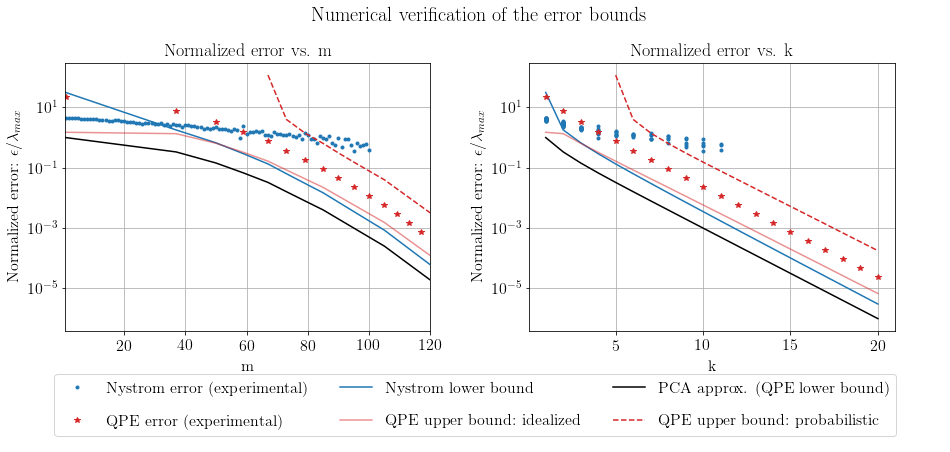

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  28858873237.119812


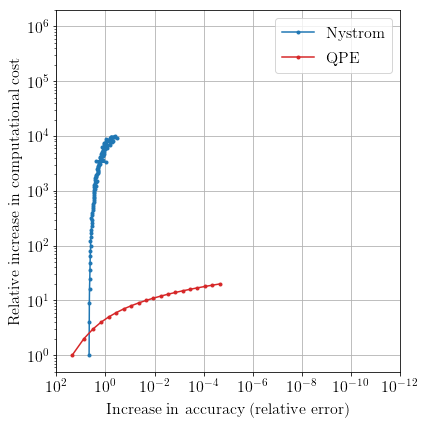

In [20]:
fig_well_conditioned, fig_cost = make_error_plots(test_matrix_list[22], error_Nystrom[:100, 22], 
                                                  error_QPE[:20, 22], 
                                 m[:100] , m_QPE[:20, 22], k[:20],loglog = False, four_plots = False,
                #suptitle = 'Numerical verification of the error bounds: system with mild eigenspectrum')#,
    savepath = '/home/gawel/Desktop/Bounds_for_paper.pdf')
                  #savepath = '/home/gawel/thesis/chapter_3/figures/error_bounds-1.pdf')
#fig_well_conditioned.savefig('Bounds_for_paper.pdf')

In [16]:
fig_ackley = make_error_plots(mat_benchmarks_list[0], error_Nystrom_b[:-2, 0], error_QPE_p[:, 0], 
                              m[:-2] , m_QPE_b[:, 0], k, 
                            suptitle = 'Numerical verification of the error bounds: Ackley function')#, 
                             #savepath = '/home/gawel/thesis/appendix_c/figures/Ackley_error_bounds.pdf')



NameError: name 'mat_benchmarks_list' is not defined

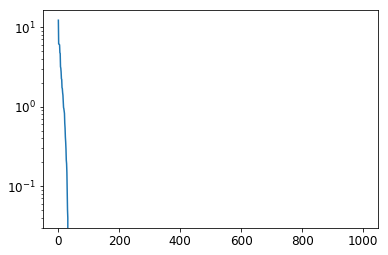

In [567]:
plt.semilogy(np.arange(1000), np.log(np.linalg.eigvals(mat_benchmarks_list[0]))
plt.show()

In [ ]:
[matrix_Ackley1000, matrix_Rastrigin1000, matrix_Rosenbrock1000, matrix_Goldstein1000]

815
[0.1914768  0.23853674]
saving the fig


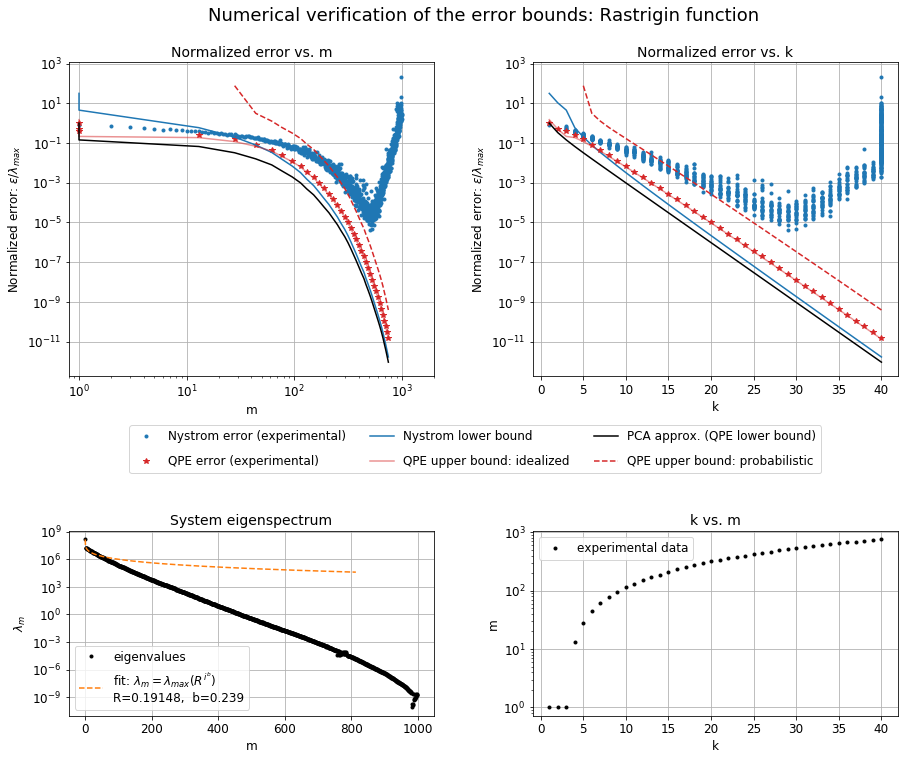

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  846.5240419382462


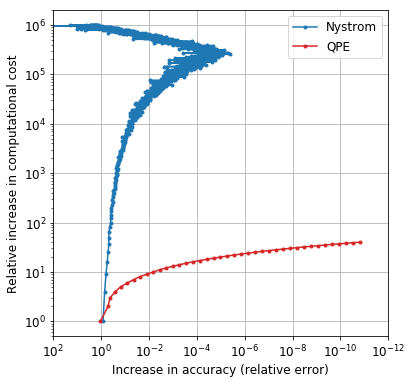

In [519]:
fig_Rastrigin = make_error_plots(mat_benchmarks_list[1], error_Nystrom_b[:, 1], error_QPE_p[:, 1], 
                                 m , m_QPE_b[:, 1], k, 
                suptitle = 'Numerical verification of the error bounds: Rastrigin function', 
                                 savepath = '/home/gawel/thesis/appendix_c/figures/Rastrigin_error_bounds.pdf')

817
[0.93371642 0.86765305]
saving the fig


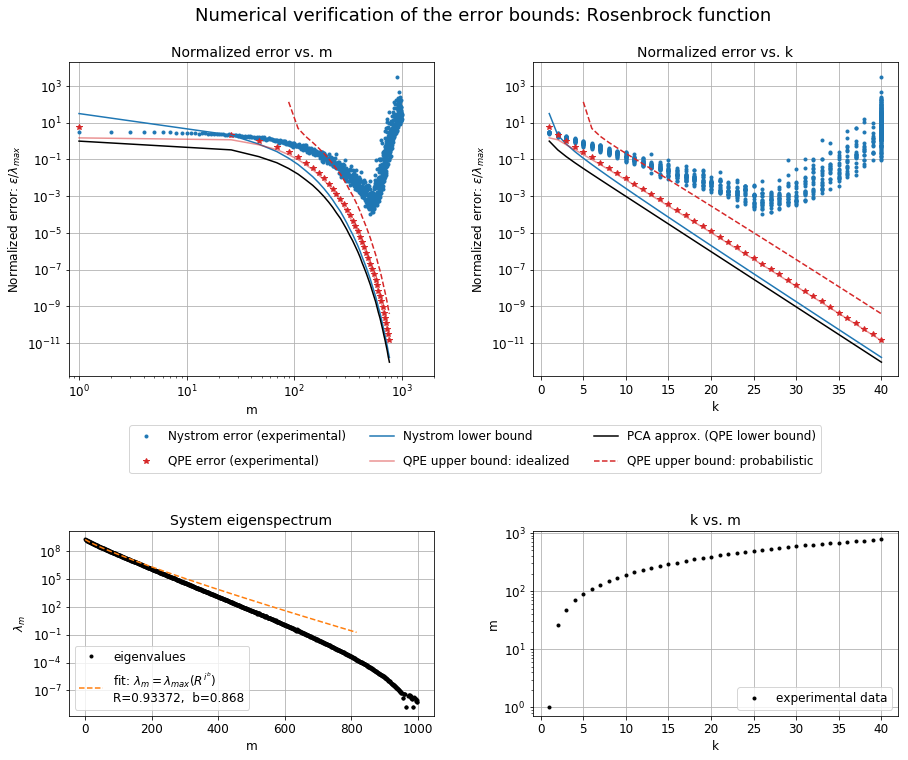

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  1290.2101592464242


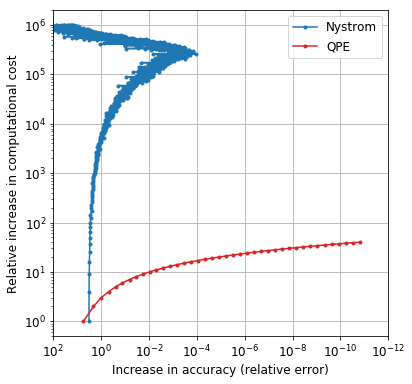

In [520]:
fig_Rosenbrock = make_error_plots(mat_benchmarks_list[2], error_Nystrom_b[:, 2], error_QPE_p[:, 2], 
                                 m , m_QPE_b[:, 2], k, 
                suptitle = 'Numerical verification of the error bounds: Rosenbrock function', 
                  #savepath = '/home/gawel/thesis/appendix_c/figures/Rosenbrock_error_bounds.pdf')

666
[0.9256032  0.89998404]
saving the fig


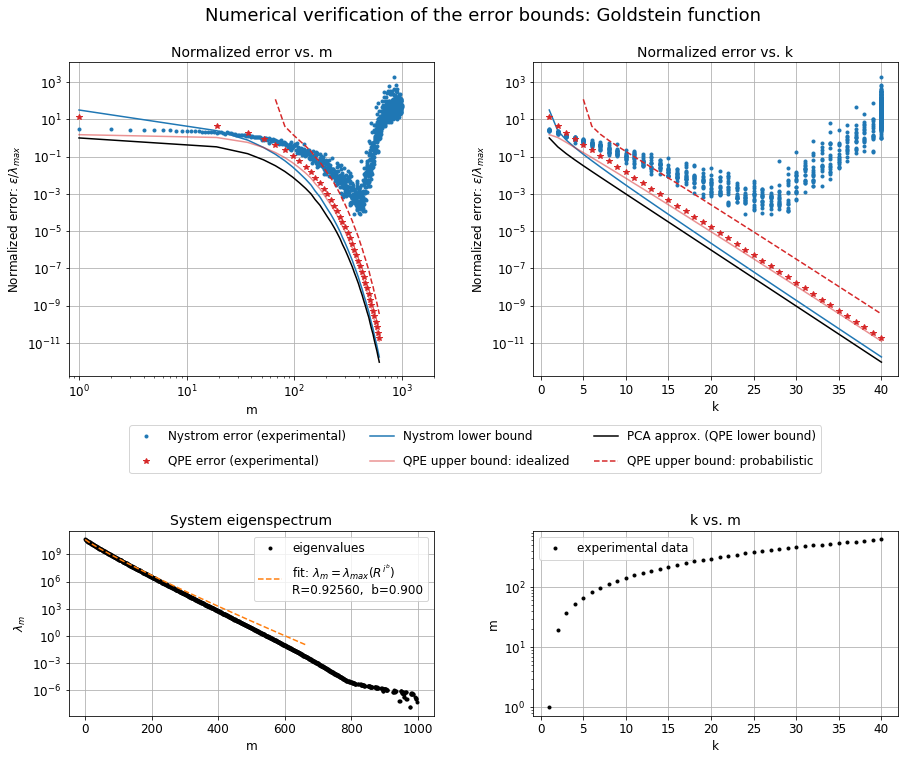

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  2431.155060261488


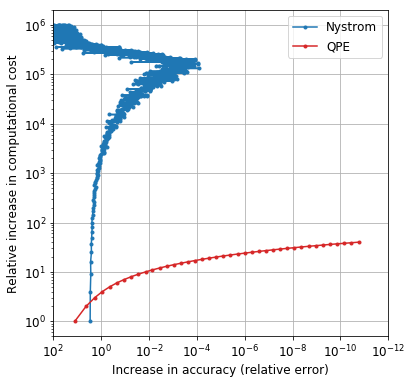

In [521]:
fig_Goldstein = make_error_plots(mat_benchmarks_list[3], error_Nystrom_b[:, 3], error_QPE_p[:, 3], 
                                 m , m_QPE_b[:, 3], k, 
                suptitle = 'Numerical verification of the error bounds: Goldstein function', 
                 #savepath = '/home/gawel/thesis/appendix_c/figures/Goldstein_error_bounds.pdf')

In [42]:
k = np.arange(1, 41)

In [78]:
bound_custom(de, m_QPE[1:, 22], n, k[1:] )

array([-3.15968309e+00, -4.62582577e+00, -7.88790003e+00,  1.19099461e+02,
        4.01308400e+00,  1.42432326e+00,  6.37568750e-01,  3.07000490e-01,
        1.52797073e-01,  7.71757999e-02,  3.92357240e-02,  1.99104259e-02,
        1.01160599e-02,  5.14140330e-03,  2.61278975e-03,  1.32737583e-03,
        6.71480615e-04,  3.40896312e-04,  1.72992011e-04,  8.74382883e-05,
        4.41855316e-05,  2.24000210e-05,  1.13138640e-05,  5.71329340e-06,
        2.88455189e-06,  1.45609447e-06,  7.34891292e-07,  3.70835957e-07,
        1.87097704e-07,  9.43812058e-08,  4.74660171e-08,  2.39380768e-08,
        1.20706974e-08,  6.08575162e-09,  3.05956092e-09,  1.54220927e-09,
        7.75219768e-10,  3.90675820e-10,  1.96353209e-10])

In [80]:
bdg = np.where(bound_custom(de, m_QPE[1:, 22], n, k[1:] )<1e-12)
np.max(bdg)

2

200


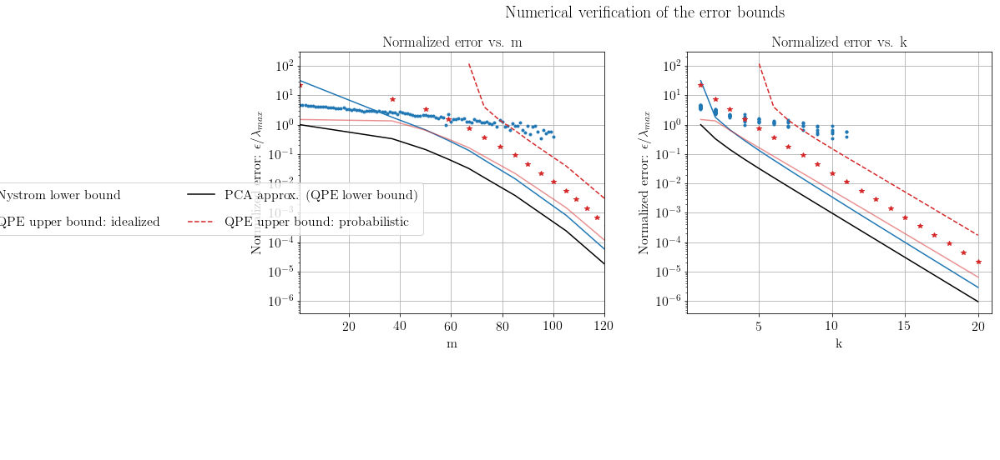

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  28858873237.119812


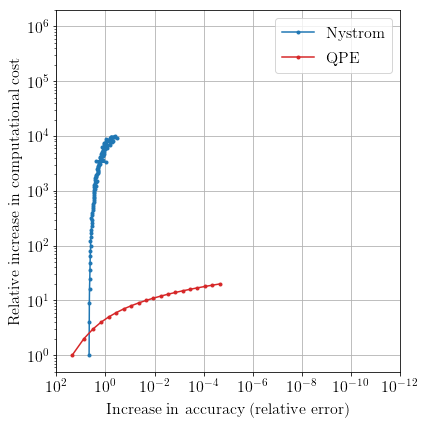

# Final plots 35 matrices

In [39]:
len(error_Nystrom[:, 0])


1000

999
[0.9999867  1.99716647]


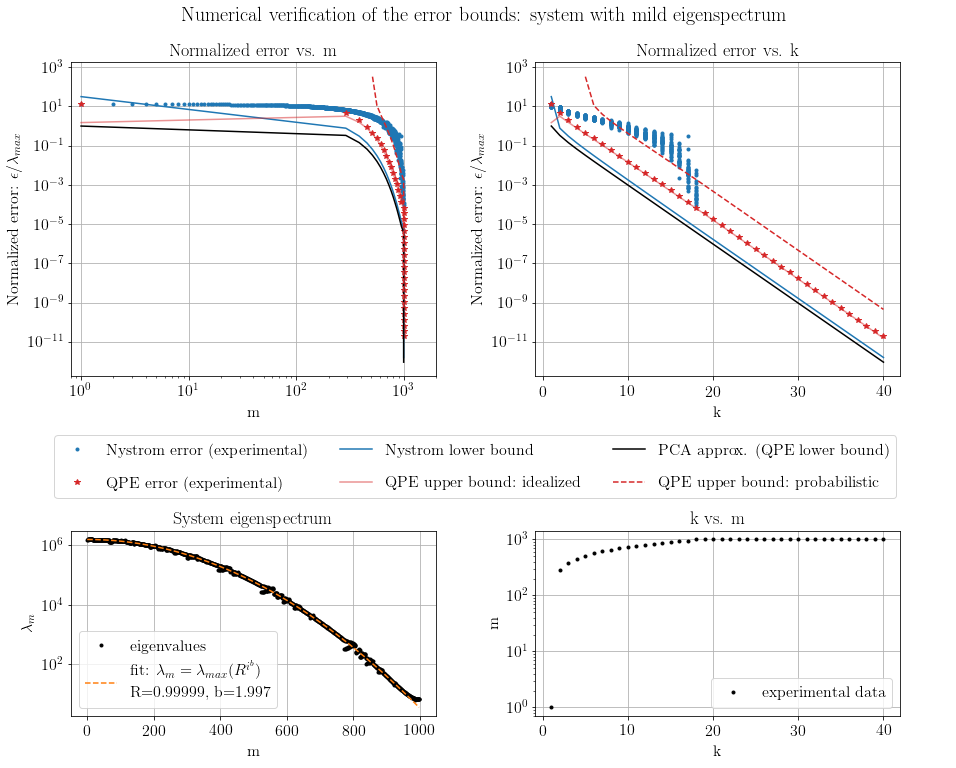

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  1000.0000000001357


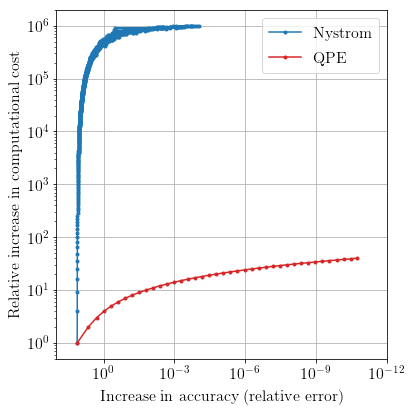

In [40]:
fig_well_conditioned, fig_cost = make_error_plots(test_matrix_list[0], error_Nystrom[:-2, 0], error_QPE[:, 0], 
                                 m[:-2] , m_QPE[:, 0], k, 
                suptitle = 'Numerical verification of the error bounds: system with mild eigenspectrum')#, 
                  #savepath = '/home/gawel/thesis/chapter_3/figures/error_bounds-1.pdf')

In [41]:
fig_cost.savefig('/home/gawel/thesis/chapter_3/figures/error-cost-0.pdf')

200
[0.99897371 1.93279681]


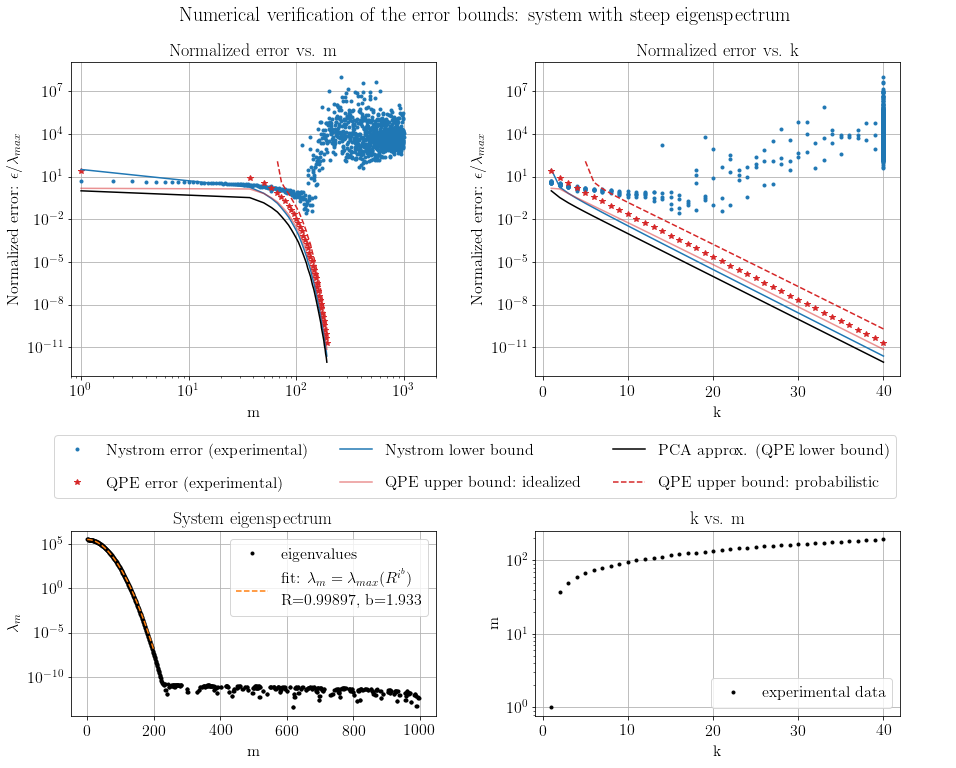

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  28858873237.119812


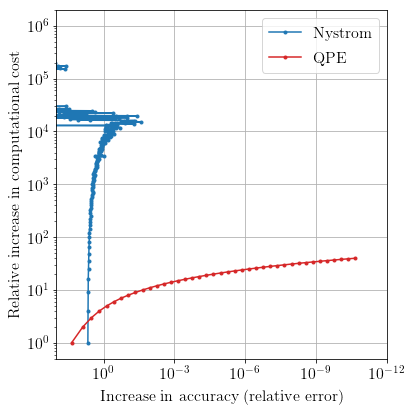

In [42]:
fig_well_conditioned, fig_cost_2 = make_error_plots(test_matrix_list[22], error_Nystrom[:-2, 22], error_QPE[:, 22], 
                                 m[:-2] , m_QPE[:, 22], k, 
                suptitle = 'Numerical verification of the error bounds: system with steep eigenspectrum')#, 
                #savepath = '/home/gawel/thesis/chapter_3/figures/error_bounds-2.pdf')

In [43]:
fig_cost_2.savefig('/home/gawel/thesis/chapter_3/figures/error-cost-1.pdf')

In [132]:
for i in k:
        Aqpetemp, mtemp = QPE_approx(mat_benchmarks_list[0], i)
        print(np.linalg.norm(mat_benchmarks_list[0] - Aqpetemp, 'fro'), mtemp)

877.0707286220174 1
877.0707286220174 1
877.0707286220174 1
877.0707286220174 1
877.0707286220174 1
877.0707286220174 1
877.0707286220174 1
877.0707286220174 1
192.32404471606733 5
192.68099780182988 5
114.08450396575103 7
67.12906572029937 7
50.45386288244265 7
29.232968802415165 10
17.358911360861846 12
10.700904406472315 17
6.763449760029039 24
3.9778104427249312 39
2.5800590829652417 61
1.5742854846173007 97
0.9928521151917723 149
0.620109094557645 236
0.38290037828984275 371
0.21497061705702833 617
0.10603595763114114 885
0.05297012309922102 975
0.026409359787455875 991
0.013463492776963541 996
0.006823969853827683 1000
0.003350397743722845 1000
0.00167640174333968 1000
0.0008461098131170893 1000
0.00041743000917526536 1000
0.00020764789297536017 1000
0.00010355829530268657 1000
5.2177591213994345e-05 1000
2.5737030528935453e-05 1000
1.2901341777035229e-05 1000
6.329204330821725e-06 1000
3.236924780867106e-06 1000


In [543]:
k

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40])

In [541]:
tempx(m_QPE[:, 0])

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 38., 38., 38., 38., 38., 38., 38., 38., 38.,
       38., 38., 38., 38., 38., 38., 38., 38., 38., 38., 38., 38., 38.,
       38.])

In [542]:
m_QPE[:, 0]

array([   1.,  290.,  386.,  456.,  513.,  564.,  610.,  652.,  692.,
        729.,  765.,  799.,  831.,  863.,  893.,  923.,  953., 1000.,
       1000., 1000., 1000., 1000., 1000., 1000., 1000., 1000., 1000.,
       1000., 1000., 1000., 1000., 1000., 1000., 1000., 1000., 1000.,
       1000., 1000., 1000., 1000.])

In [547]:
np.unique(m_QPE[:, 0], return_index = True)

(array([   1.,  290.,  386.,  456.,  513.,  564.,  610.,  652.,  692.,
         729.,  765.,  799.,  831.,  863.,  893.,  923.,  953., 1000.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]))

In [544]:
m_growing = np.unique(m_QPE[:, 0])
k_growing = k[:len(m_growing)]
k_const = k[len(m_growing)]

array([   1.,  290.,  386.,  456.,  513.,  564.,  610.,  652.,  692.,
        729.,  765.,  799.,  831.,  863.,  893.,  923.,  953., 1000.])

In [540]:
'''
k_interpolated = interp1d(m_QPE, k, kind='nearest', fill_value='extrapolate')

if split_eigs:
    ax2.semilogy(k_interpolated(m[:cut_indx]), error_N[:cut_indx]/eig_max, 'C0.',
                 label = 'Nystrom error experimental, well-conditioned eigenmodes')
'''
        
tempx = interp1d(m_QPE[:, 0], k, kind='linear', fill_value='extrapolate')


#plt.plot(m, tempx(k))

# All results at single plot

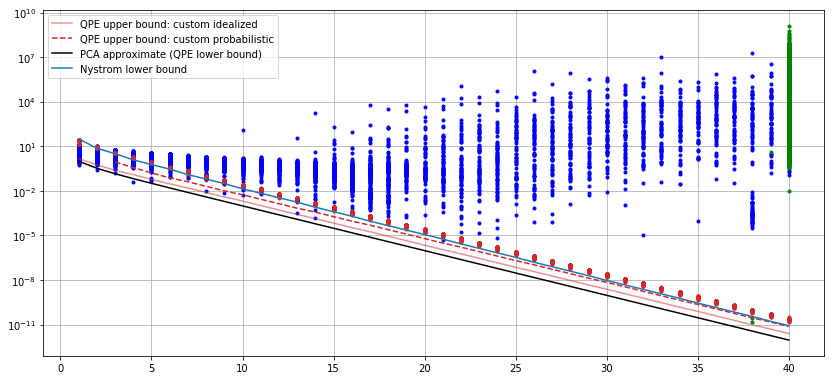

Verifying Nystrom error

Sum diagonal Knn^[-1] @ Knn:  -15688.96682292223


In [108]:
de = 0.6

plt.figure(figsize = (14, 14))


for mat_num in range(len(test_matrix_list)):
    
    eig = np.linalg.eig(test_matrix_list[mat_num])[0]
    cut_indx = np.max(np.where((eig/eig_max[mat_num])>1e-13))
    
    '''
    plt.subplot(2, 1, 1)
    plt.loglog(m[:cut_indx], error_Nystrom[:cut_indx, mat_num]/eig_max[mat_num], 'b.')
    plt.loglog(m[cut_indx:], error_Nystrom[cut_indx:, mat_num]/eig_max[mat_num], 'g.')

    plt.loglog(m_QPE[:, mat_num], error_QPE[:, mat_num]/eig_max[mat_num],'.C3')#, marker = '.')
    
    plt.loglog(m_QPE[:, mat_num], bound_custom_simple(de, m_QPE[:, mat_num], n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: custom idealized')
    
    bd = np.where(bound_custom(de, m_QPE[:, mat_num], n, k )<1e-12)
    bd = np.max(bd)+1
    xm = m_QPE[:, mat_num]
    
    
    plt.loglog(xm[bd:], bound_custom(de, m_QPE[:, mat_num], n, k )[bd:],'--',c = 'C3',
               label = 'QPE upper bound: custom probabilistic')
    plt.loglog(m_QPE[:, mat_num], PCA(k)*np.ones(m_QPE[:, mat_num].shape), 'k-', label = 'PCA approximate (QPE lower bound)')
    plt.loglog(m_QPE[:, mat_num], bound_nystrom_wang(m_QPE[:, mat_num], n, k), '-',  
               c = 'C0', label = 'Nystrom lower bound')


    plt.xlim([1, 1000])

    plt.ylabel('normalized error: '+r'$\epsilon/\lambda_{max}$')
    plt.legend()
    plt.grid(True)
    '''

    
    
    
    plt.subplot(2, 1, 2)
    
    k_interpolated = interp1d(m_QPE[:, mat_num], k, kind='nearest', fill_value='extrapolate')
    
    plt.semilogy(k_interpolated(m[:cut_indx]), error_Nystrom[:cut_indx, mat_num]/eig_max[mat_num], 'b.')
    plt.semilogy(k_interpolated(m[cut_indx:]), error_Nystrom[cut_indx:, mat_num]/eig_max[mat_num], 'g.')
    
    plt.semilogy(k, error_QPE[:, mat_num]/eig_max[mat_num], 'C3.')

plt.semilogy(k, bound_custom_simple(de, m_QPE[:, mat_num], n, k ), '-', c = 'C3',alpha =0.5, 
           label = 'QPE upper bound: custom idealized')

bd = np.where(bound_custom(de, m_QPE[:, mat_num], n, k )<1e-12)
bd = np.max(bd)+1

plt.semilogy(k[bd:], bound_custom(de, m_QPE[:, mat_num], n, k )[bd:],'--',c = 'C3',
           label = 'QPE upper bound: custom probabilistic')
plt.semilogy(k, PCA(k)*np.ones(m_QPE[:, mat_num].shape), 'k-', label = 'PCA approximate (QPE lower bound)')
plt.semilogy(k, bound_nystrom_wang(m_QPE[:, mat_num], n, k), '-',  c = 'C0', label = 'Nystrom lower bound')



plt.legend()
plt.grid(True)

plt.show()

print('Verifying Nystrom error\n')
print('Sum diagonal Knn^[-1] @ Knn: ', np.sum(np.linalg.inv(test_matrix_list[mat_num])@test_matrix_list[mat_num]))

    
#last sample  - matrix is singular

AttributeError: module 'matplotlib.pyplot' has no attribute 'secondary_axis'

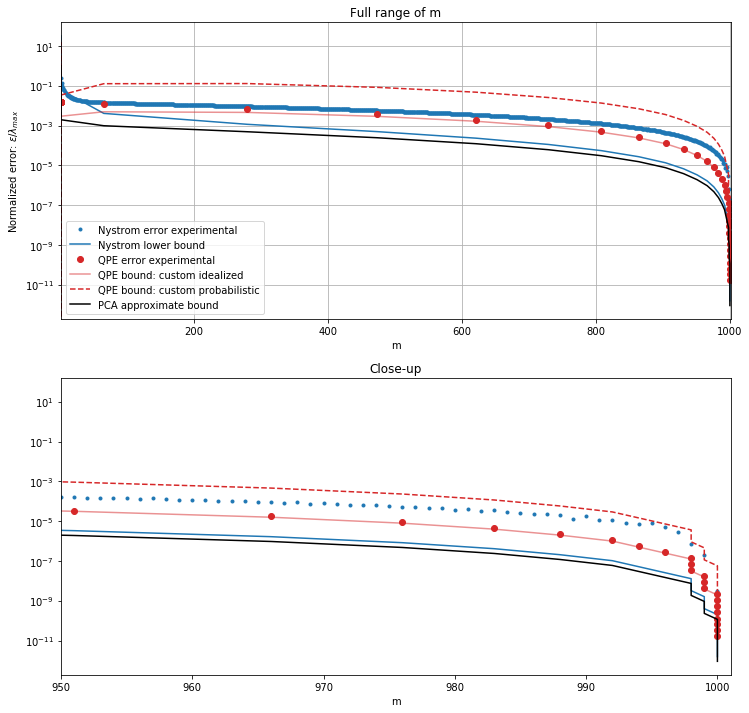

In [86]:
de = 0.01


plt.figure(figsize = (12, 12))

plt.subplot(2, 1, 1)

plt.semilogy(m, error_Nystrom/eig_max, '.', label = 'Nystrom error experimental')
plt.semilogy(m_QPE, bound_nystrom_wang(m_QPE, n, k),'-',  c = 'C0', label = 'Nystrom lower bound')

plt.semilogy(m_QPE, error_QPE/eig_max, 'o', c = 'C3', label = 'QPE error experimental')
plt.semilogy(m_QPE, bound_custom_simple(de, m_QPE, n, k ),'-', c = 'C3',alpha =0.5,   label = 'QPE bound: custom idealized')
plt.semilogy(m_QPE, bound_custom(de, m_QPE, n, k ), '--',c = 'C3', label = 'QPE bound: custom probabilistic')
plt.semilogy(m_QPE, PCA(k)*np.ones(m_QPE.shape), '-k', label = 'PCA approximate bound')
plt.xlabel('m')
plt.title('Full range of m')
plt.xlim([1, 1001])


plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
plt.legend()
plt.grid(True)


plt.subplot(2, 1, 2)


plt.semilogy(m, error_Nystrom/eig_max, '.', label = 'Nystrom error experimental')
plt.semilogy(m_QPE, bound_nystrom_wang(m_QPE, n, k),'-',  c = 'C0', label = 'Nystrom lower bound')

plt.semilogy(m_QPE, error_QPE/eig_max, 'o', c = 'C3', label = 'QPE error experimental')
plt.semilogy(m_QPE, bound_custom_simple(de, m_QPE, n, k ),'-', c = 'C3',alpha =0.5,   label = 'QPE bound: custom idealized')
plt.semilogy(m_QPE, bound_custom(de, m_QPE, n, k ), '--',c = 'C3', label = 'QPE bound: custom probabilistic')
plt.semilogy(m_QPE, PCA(k)*np.ones(m_QPE.shape), '-k', label = 'PCA approximate bound')
plt.xlabel('m')
plt.title('Close-up')
plt.xlim([950, 1001])

plt.ylabel('Normalized error: '+r'$\epsilon/\lambda_{max}$')
plt.legend()
plt.grid(True)


plt.suptitle('Experimental comparison of QPE and Nystrom approximation errors against the theoretical bounds', 
             fontsize=16)
plt.subplots_adjust(top=0.9)

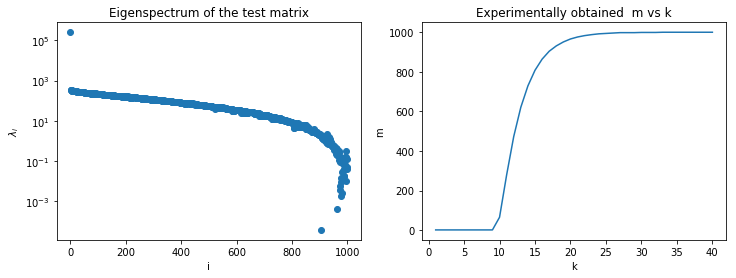

In [76]:
plt.figure(figsize = (12, 4))
plt.subplot(1, 2,2)

plt.plot(k, m_QPE)
plt.xlabel('k')
plt.ylabel('m')
plt.title('Experimentally obtained  m vs k')


plt.subplot(1, 2,1)
plt.semilogy(range(len(eig)),eig, 'o')
plt.xlabel('i')
plt.ylabel(r'$\lambda_{i}$')
plt.title('Eigenspectrum of the test matrix')
plt.show()

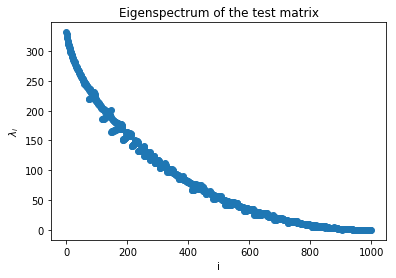

In [89]:
plt.plot(range(len(eig)-1),eig[1:], 'o')
plt.xlabel('i')
plt.ylabel(r'$\lambda_{i}$')
plt.title('Eigenspectrum of the test matrix')
plt.show()

# Another data-set (optimized kernel params)


In [49]:
f2 = open('test_matrix_list_opt.pickle', 'rb')
test_matrix_list_opt = pickle.load(f2)
f2.close()


error_Nystrom_opt = np.zeros((m.size, len(test_matrix_list_opt)))
error_QPE_opt = np.zeros((k.size, len(test_matrix_list_opt)))


for mat_num in range(len(test_matrix_list_opt)):
    print('Sample: ', mat_num)
    for i in m:
        error_Nystrom_opt[int(i-1), mat_num] = np.linalg.norm(test_matrix_list_opt[mat_num] - 
                                                         Nystrom(test_matrix_list_opt[mat_num], i), 'fro')

m_QPE_opt = np.zeros((k.size, len(test_matrix_list_opt)))
eig_max_opt  = []

for mat_num in range(len(test_matrix_list_opt)):
    eig, mu = np.linalg.eig(test_matrix_list_opt[mat_num])
    eig_max_opt.append(np.max(eig.real))    
    for i in k:
        Aqpetemp, m_QPE_opt[int(i-1), mat_num] = QPE_approx(test_matrix_list_opt[mat_num], i)
        error_QPE_opt[int(i-1), mat_num] = np.linalg.norm(test_matrix_list_opt[mat_num] - Aqpetemp, 'fro')

    print(mat_num)  
    
    

    


Sample:  0
Sample:  1
Sample:  2
Sample:  3
Sample:  4
0
1
2
3
4


In [55]:
error_QPE_opt[:, 1].shape

(40,)

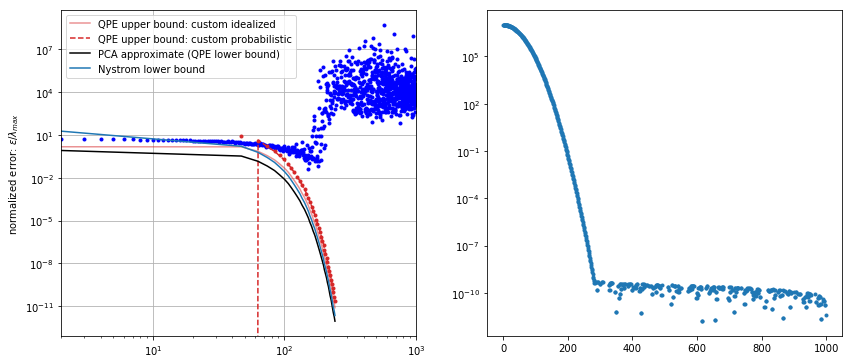

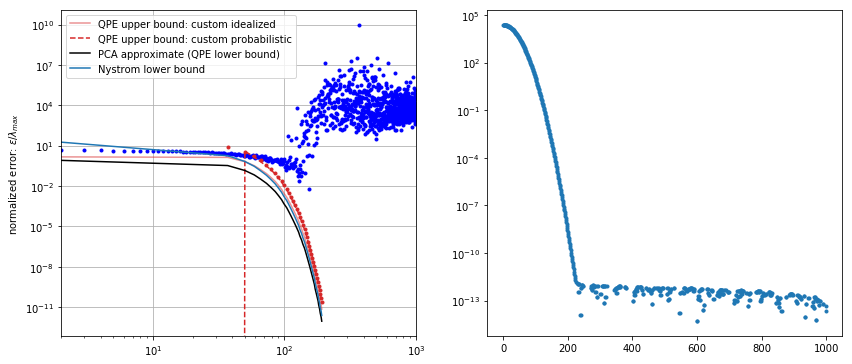

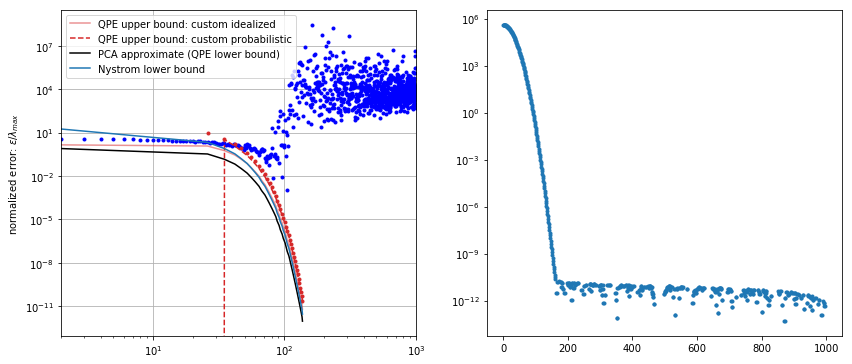

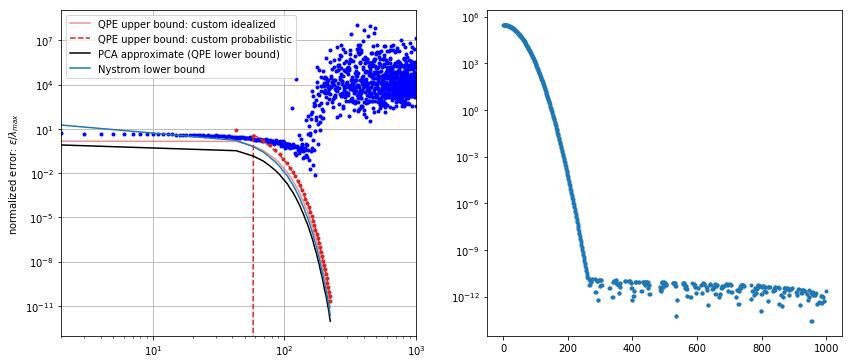

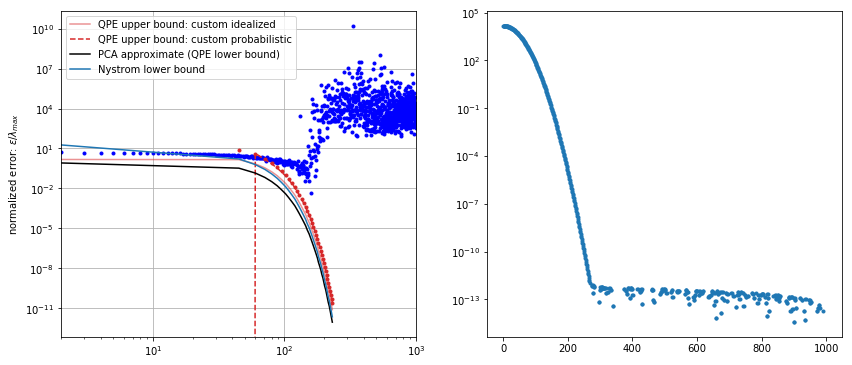

In [62]:
for mat_num in range(len(test_matrix_list_opt)):
    plt.figure(figsize = (14, 6))
    plt.subplot(1, 2, 1)
    plt.loglog(m, error_Nystrom_opt[:, mat_num]/eig_max_opt[mat_num], 'b.')

    plt.loglog(m_QPE_opt[:, mat_num], error_QPE_opt[:, mat_num]/eig_max_opt[mat_num],'.C3')
    
    plt.loglog(m_QPE_opt[:, mat_num], bound_custom_simple(de, m_QPE_opt[:, mat_num], n, k ), '-', c = 'C3',alpha =0.5, 
               label = 'QPE upper bound: custom idealized')
    
    plt.loglog(m_QPE_opt[:, mat_num], bound_custom(de, m_QPE_opt[:, mat_num], n, k ),'--',c = 'C3',
               label = 'QPE upper bound: custom probabilistic')
    
    plt.loglog(m_QPE_opt[:, mat_num], PCA(k)*np.ones(m_QPE_opt[:, mat_num].shape), 'k-', 
               label = 'PCA approximate (QPE lower bound)')
    
    plt.loglog(m_QPE_opt[:, mat_num], bound_nystrom_wang(m_QPE_opt[:, mat_num], n, k), '-',  c = 'C0', 
               label = 'Nystrom lower bound')


    plt.xlim([2, 1000])

    plt.ylabel('normalized error: '+r'$\epsilon/\lambda_{max}$')
    plt.legend()
    plt.grid(True)
    
    eig = np.linalg.eig(test_matrix_list_opt[mat_num])[0]
    plt.subplot(1, 2, 2)
    plt.semilogy(eig, '.')

    
    
    plt.show()

# test with 10 random matrices

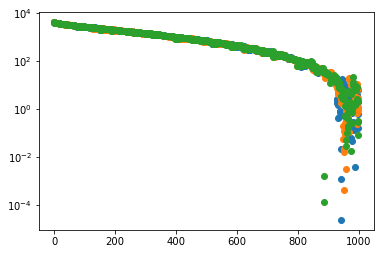

In [106]:
for i in range(3):
    np.random.seed(i)

    n = 1000
    m = np.linspace(1, n, n)
    A = np.random.randn(n,n)
    A = np.dot(A.T, A) # ensure SPD matrix -> hermitian
    k = np.arange(1, 41)




    eigx, mux = np.linalg.eig(A)
    plt.semilogy(eigx, 'o')


Matrices generated in this way have almost the same eigenspectrum, so it's not valuable to compare them extensively..


### generating test matrices with (historical stock market data)

reconstraining parameters GP_regression.sum.mul.std_periodic.period
reconstraining parameters GP_regression.sum.mul.std_periodic.lengthscale
reconstraining parameters GP_regression.sum.mul.rbf.lengthscale
reconstraining parameters GP_regression.sum.mul_1.std_periodic.period


Optimization restart 1/5, f = 4171.907241851564
Optimization restart 2/5, f = 4138.802128501477
Optimization restart 3/5, f = 4347.284362800493
Optimization restart 4/5, f = 4171.804777992585
Optimization restart 5/5, f = 4464.999657731661

Name : GP regression
Objective : 4138.802128501477
Number of Parameters : 13
Number of Optimization Parameters : 13
Updates : True
Parameters:
  GP_regression.                      |               value  |  constraints  |  priors
  sum.mul.std_periodic.variance       |   3406.969226310936  |      +ve      |        
  sum.mul.std_periodic.period         |  161.09444808832586  |  90.0,180.0   |        
  sum.mul.std_periodic.lengthscale    |                90.0  |  90.0,2000.0  |        
  sum.mul.rbf.variance                |   3312.426992057111  |      +ve      |        
  sum.mul.rbf.lengthscale             |              2000.0  |  90.0,2000.0  |        
  sum.mul_1.std_periodic.variance     |    2.71974554861352  |      +ve      |        
  sum.m

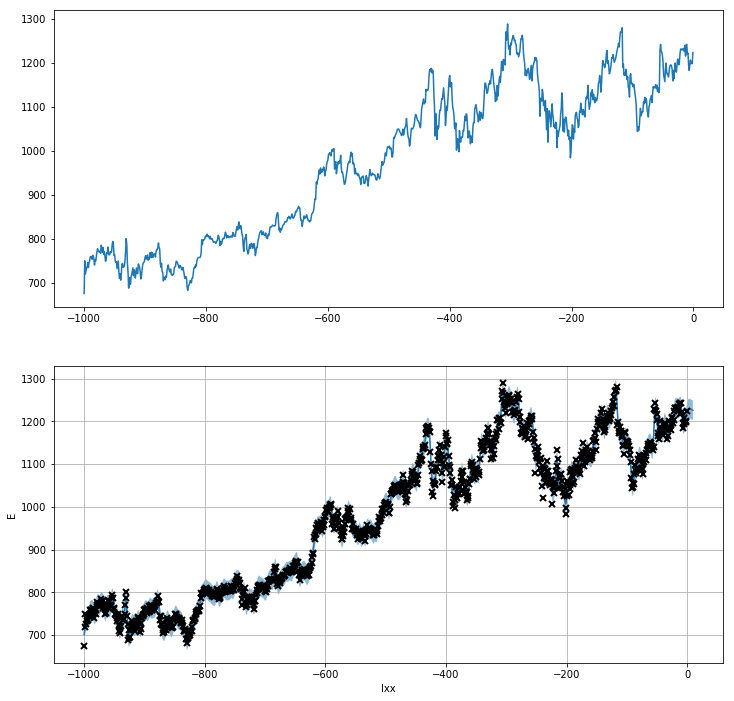

In [6]:
def plot_gp(X, m, C=None, training_points=None, lab = 'GP fit', c=None):
    """ Plotting utility to plot a GP fit with 95% confidence interval """
    # Plot 95% confidence interval 
    if C is not None:
        if c is not None:
            plt.fill_between(X[:,0],
                            m[:,0] - 1.96*np.sqrt(np.diag(C)),
                            m[:,0] + 1.96*np.sqrt(np.diag(C)),
                            alpha=0.5, facecolor = c)
        else:
            plt.fill_between(X[:,0],
                            m[:,0] - 1.96*np.sqrt(np.diag(C)),
                            m[:,0] + 1.96*np.sqrt(np.diag(C)),
                            alpha=0.5)
    # Plot GP mean and initial training points
    plt.plot(X, m, "-",color = c,  label = lab)
    plt.grid(True)
    #plt.legend(labels=["GP fit"])

    plt.xlabel("Ixx"), plt.ylabel("E")
    plt.ticklabel_format(axis='x', style='sci', scilimits=(0, 4))
    # Plot training points if included
    if training_points is not None:
        X_, Y_ = training_points
        plt.plot(X_, Y_, "kx", mew=2, label = 'Training points')
        #plt.legend(labels=["GP fit", "Training points"])
        
        
        
GOOGL = np.loadtxt('GOOGL.csv', skiprows = 1, delimiter = ',', usecols = [1])
Y = GOOGL[-1000:]
X = np.arange(-1000, 0, 1)

Y = Y[:, None]
X = X[:, None]

plt.figure(figsize = (12, 12))
plt.subplot(2, 1, 1)
plt.plot(X, Y)

#kG = GPy.kern.RBF(1) + GPy.kern.Cosine(1)
ks = [ # Our kernels
    GPy.kern.Exponential(1, lengthscale = 10.),              # Non-linearity in overall trend
    GPy.kern.Bias(1, variance=700.),    # Constant offset
    GPy.kern.Linear(1),                   # Linear trend
    GPy.kern.StdPeriodic(1, period=150.),   # Periodicity (short term trend)
    GPy.kern.RBF(1, lengthscale = 1.)                       # Amplitude modulator (long term trend)
]


#kG = ks[0] + ks[1]+ ks[3]*ks[4] 
kG = ks[3]*ks[4] + ks[3]*ks[4] + ks[4]

m = GPy.models.GPRegression(X, Y, kG)
m.kern.mul.std_periodic.period.constrain_bounded(90, 180)
m.kern.mul.std_periodic.lengthscale.constrain_bounded(90,2000 )
m.kern.mul.rbf.lengthscale.constrain_bounded(90,2000)

m.kern.mul_1.std_periodic.period.constrain_bounded(1, 20)
#m.kern.mul_1.std_periodic.lengthscale.constrain_bounded(2, 1000)
#m.kern.mul_1.rbf.lengthscale.constrain_bounded(2, 1000)

m.optimize_restarts(5, robust=True)
print(m)

Xnew = np.arange(-1000, 10, 1)
Xnew = Xnew[:, None]
mean, Cov = m.predict(Xnew)

plt.subplot( 2, 1, 2)
plot_gp(Xnew, mean, Cov, training_points=[X, Y], lab = 'GP fit', c=None)


In [ ]:
m.kern

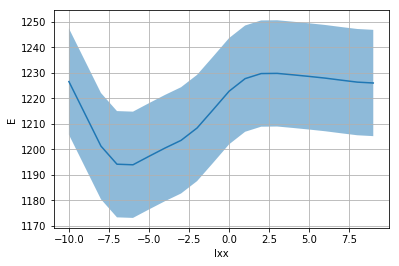

In [7]:
plot_gp(Xnew[-20:], mean[-20:], Cov[-20:, -20:], lab = 'GP fit')


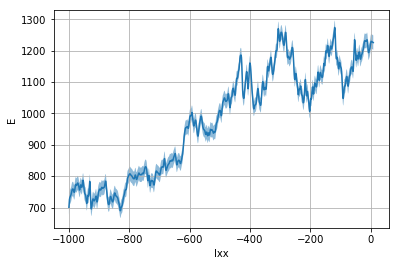

In [8]:
plot_gp(Xnew, mean, Cov, lab = 'GP fit', c=None)


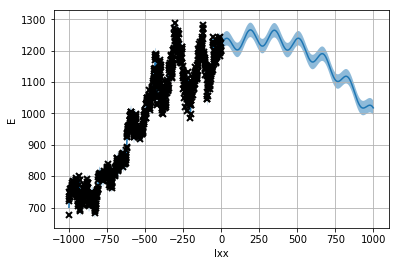

In [11]:
Xnew = np.arange(-1000, 1000, 1)
Xnew = Xnew[:, None]
mean, Cov = m.predict(Xnew)

plot_gp(Xnew, mean, Cov, training_points=[X, Y], lab = 'GP fit', c=None)

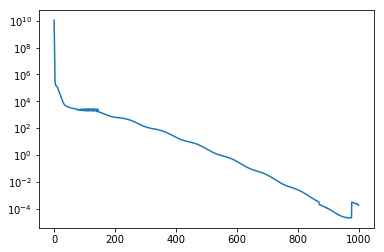

In [26]:
eig, mu = np.linalg.eig(kG.K(X,X))
eig = eig.real
plt.semilogy(eig)

# Nystrom bounds by Kumar 
http://proceedings.mlr.press/v5/kumar09a/kumar09a.pdf

In [5]:
def alpha_exact(m, u):
    return (m*u/(m+u-0.5))*(1./(1.-1./(2.*np.max([m, u]))))


    
def eta(d, l, n):
    return np.sqrt(np.log(2./d)*alpha(l, n-l)/l)
    #return np.sqrt(np.log(2./d)*(1.-l/n))

def eps(k, l, d, n):
    return (64. * (k/l) * (1.+eta(d, l, n))**2.)**0.25


In [6]:
d = 0.1
n = 1000
k = 0.01*n



l = np.linspace(20,500, 100)
#k = l
plt.plot(100*l/n, eps(k, l, d, n))




NameError: name 'alpha' is not defined

In [ ]:
eps = np.linspace(0.001, 1, 100)
k = 10

plt.plot(1./(2.**(k - np.log(2.+1./(2.*eps)))-1.), 1-eps)
n = np.linspace(1, 8.5, 100)


#plt.plot(n, 1.-1./(2.*(2.**(k-n)-2.)))
plt.xlabel('n')

# Old bounds

[ 2.    2.36  2.72  3.08  3.44  3.8   4.16  4.52  4.88  5.24  5.6   5.96
  6.32  6.68  7.04  7.4   7.76  8.12  8.48  8.84  9.2   9.56  9.92 10.28
 10.64 11.   11.36 11.72 12.08 12.44 12.8  13.16 13.52 13.88 14.24 14.6
 14.96 15.32 15.68 16.04 16.4  16.76 17.12 17.48 17.84 18.2  18.56 18.92
 19.28 19.64 20.  ]


Text(0.5, 0.98, 'Bound comparison: Custom bound/QPE default bound, N=100')

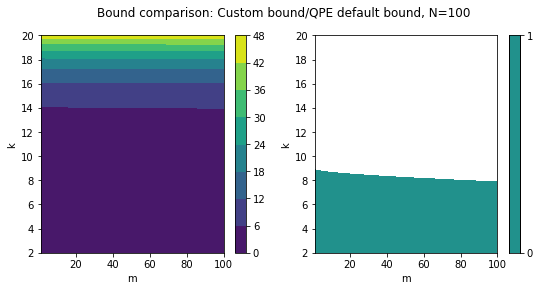

In [7]:
n = 1000
m= np.linspace(1, 100, 51)
#r = np.linspace(0.02, 0.97, 100)
k = np.linspace(2, 20, 51)
print(k)

#k = 30


#M, R = np.meshgrid(m, r)
M, K = np.meshgrid(m, k)
#z = (np.sqrt(M)/2  + np.sqrt(R**2*(1.-(R)**(2.*(n - M)))/(1-(R**2.))))/(np.sqrt(n)/2)
#z=(np.sqrt(M)/(2**(k+1)  + np.sqrt(R**2*(1.-(R)**(2.*(n - M)))/(1-(R**2.)))/(2.**k-1.))/(np.sqrt(m)/(2**(k+1))))
z = (np.sqrt(M)/(2**(K+1)) + np.sqrt(1./(2.**(K+1.))))/(np.sqrt(n)/(2**(K+1)))

plt.figure(figsize = (9, 4))
plt.subplot(1,2,1)
plt.contourf(M, K, z)#list(np.linspace(np.min(z), np.max(z), 15)))
plt.xlabel('m')
plt.ylabel('k')
plt.colorbar()

plt.subplot(1,2,2)
plt.contourf(M, K, z, [0, 1])#list(np.linspace(np.min(z), np.max(z), 15)))
plt.xlabel('m')
plt.ylabel('k')
plt.colorbar()
plt.suptitle('Bound comparison: Custom bound/QPE default bound, N=100')

Text(0.5, 0.98, 'Bound comparison: Custom bound/QPE default bound, N=1000')

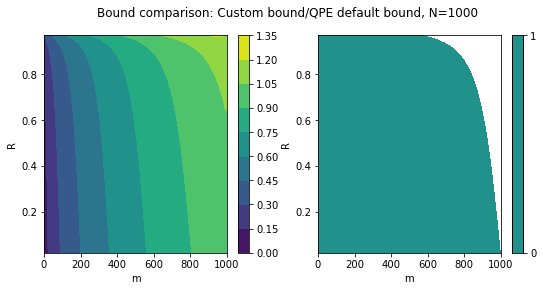

In [8]:
n = 1000
m= np.linspace(1, 1000, 1000)
r = np.linspace(0.02, 0.97, 1000)

M, R = np.meshgrid(m, r)
#z = (np.sqrt(X) + np.sqrt(Y*(1-(Y)**(2*(n - X+1)))/(1-(Y.T**2))))/np.sqrt(n)
z = (np.sqrt(M)/2  + np.sqrt(R**2.*(1.-(R)**(2.*(n - M)))/(1-(R**2.))))/(np.sqrt(n)/2)

plt.figure(figsize = (9, 4))
plt.subplot(1,2,1)
plt.contourf(M, R, z)#list(np.linspace(np.min(z), np.max(z), 15)))
plt.xlabel('m')
plt.ylabel('R')
plt.colorbar()

plt.subplot(1,2,2)
plt.contourf(M, R, z, [0, 1])#list(np.linspace(np.min(z), np.max(z), 15)))
plt.xlabel('m')
plt.ylabel('R')
plt.colorbar()
plt.suptitle('Bound comparison: Custom bound/QPE default bound, N=1000')

In [9]:
def custom_bound_m(R, n, M, l_max, k):
    return l_max*(np.sqrt(M)/2  + np.sqrt((R**.2)*(1.-(R)**(2.*(n - M)))/(1-(R**2.))))/(2.**k-1.)

def custom_bound(R, n, l_max, k):
    M = k/(-np.log2(R))
    return l_max*(np.sqrt(M)/2  + np.sqrt((R**.2)*(1.-(R)**(2.*(n - M)))/(1-(R**2.))))/(2.**k-1.)

def default_QPE_bound( n, l_max, k):
    return l_max*(np.sqrt(n))/(2.*(2.**k-1.))



def QPE_error_norm(K, k):
    eig, mu = np.linalg.eig(K)
    eig = eig.real
    eiga = np.round(eig/(np.max(eig)) * (2**k-1))
    eiga = np.max(eig)*eiga/(2**k-1)
    error = np.linalg.norm(K - np.linalg.inv(mu.T)@np.diag(eiga)@mu.T)
    #error = np.linalg.norm(eig**2-eiga**2)
    m = len(np.nonzero(eiga)[0])
    return error, m

def analyse_error(K, R):
    eig, mu = np.linalg.eig(K)
    eig = eig.real
    kappa = np.max(np.abs(eig.real))/np.min(np.abs(eig.real))

    plt.figure(figsize = (13, 5))
    plt.subplot(1, 2, 1)
    plt.semilogy(eig, 'o')
    plt.ylabel(r'$\lambda_i$',fontsize = 16)
    plt.xlabel('i', fontsize = 16)
    plt.title('Eigenspectrum '+ r'$\kappa =$' + '%.2E' % kappa)
    print(max(eig))
    print('kappa:',kappa )


    plt.subplot(1, 2, 2)
    k = np.arange(3, 61)
    er = []
    m = []
    for i in k:
        er.append(QPE_error_norm(K, i)[0])
        m.append(QPE_error_norm(K, i)[1])

    plt.semilogy(k, er, label = 'True error')
    plt.semilogy(k, custom_bound(R, 100, np.max(eig), k), label = 'Custom bound generalized')
    plt.semilogy(k, custom_bound_m(R, 100, np.array(m), np.max(eig), k), label = 'Custom bound true m')
    plt.semilogy(k, default_QPE_bound(100,np.max(eig), k ), label = 'default QPE bound')

    plt.title('Error: ' + r'$\left|A - \widetilde{A}\right|_F$')
    plt.ylabel('')
    plt.xlabel('k')
    plt.grid(True)
    plt.legend()
    print('resolution to cover all eigenvalues:', np.log2(np.max(np.abs(eig.real))/np.min(np.abs(eig.real))))
    
    
    plt.figure(figsize=(6, 6))
    plt.semilogy(k, m, label = 'experimental')
    plt.semilogy(k, k/(-np.log2(R)), label = 'theoretical')
    plt.legend()
    plt.grid(True)
    plt.xlabel('k')
    plt.ylabel('m - included eigenmodes')
    plt.title('m vs k')
    plt.show()
    

# Theoreticall bound vs error in practice

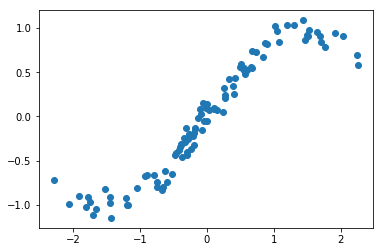

In [10]:
np.random.seed(7)
X = np.random.randn(100)
Y = np.sin(X) + np.random.randn(100)*0.1

X = X[:,None]
Y = Y[:,None]

plt.plot(X, Y, 'o')
plt.show()

k = GPy.kern.RBF(1)
m = GPy.models.GPRegression(X, Y, k)
m.optimize()

K = k.K(X, X)




 /home/gawel/anaconda3/envs/MLenv/lib/python3.6/site-packages/numpy/core/numeric.py:538: ComplexWarning:Casting complex values to real discards the imaginary part


(59.42145542572143+0j)
kappa: 8.487219456092725e+18
resolution to cover all eigenvalues: 62.87999769002585


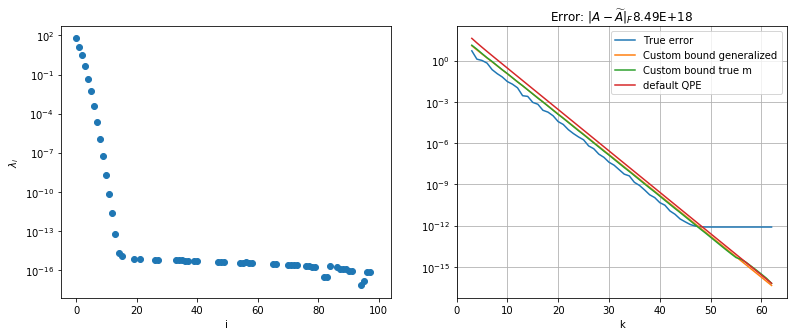

In [11]:
eig, mu = np.linalg.eig(K)

plt.figure(figsize = (13, 5))
plt.subplot(1, 2, 1)
plt.semilogy(eig, 'o')
plt.ylabel(r'$\lambda_i$')
plt.xlabel('i')
print(max(eig))
print('kappa:', np.max(np.abs(eig.real))/np.min(np.abs(eig.real)))
kappa = np.max(np.abs(eig.real))/np.min(np.abs(eig.real))

plt.subplot(1, 2, 2)
k = np.arange(3, 63)
er = []
m = []
for i in k:
    er.append(QPE_error_norm(K, i)[0])
    m.append(QPE_error_norm(K, i)[1])
    
plt.semilogy(k, er, label = 'True error')
plt.semilogy(k, custom_bound(0.21, 100, np.max(eig), k), label = 'Custom bound generalized')
plt.semilogy(k, custom_bound_m(0.21, 100, np.array(m), np.max(eig), k), label = 'Custom bound true m')

plt.semilogy(k, default_QPE_bound(100,np.max(eig), k ), label = 'default QPE')

plt.title('Error: ' + r'$\left|A - \widetilde{A}\right|_F$' + '%.2E' % kappa )
plt.ylabel('')
plt.xlabel('k')
plt.grid(True)
plt.legend()
print('resolution to cover all eigenvalues:', np.log2(np.max(np.abs(eig.real))/np.min(np.abs(eig.real))))

59.42145542572143
kappa: 8.487219456092725e+18
resolution to cover all eigenvalues: 62.87999769002585


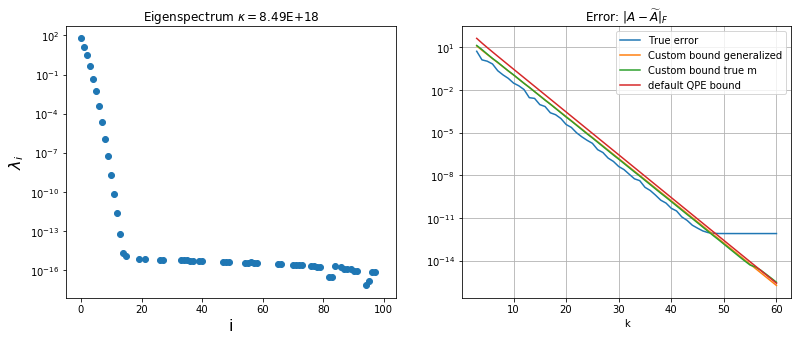

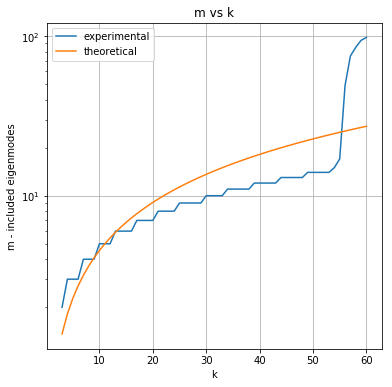

In [12]:
analyse_error(K, 0.2169636)

[0.2169636]


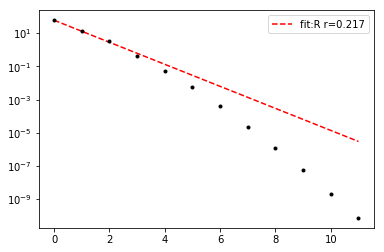

In [13]:
def func(x, r):
    return  59.42* r ** x

xdata = np.arange(12)
ydata = eig[:12].real

popt, pcov = curve_fit(func, xdata, ydata)
print(popt)
plt.semilogy(xdata, func(xdata, *popt), 'r--',
        label='fit:R r=%5.3f' % tuple(popt))
plt.semilogy(xdata, ydata, '.k')
plt.legend()
plt.show()


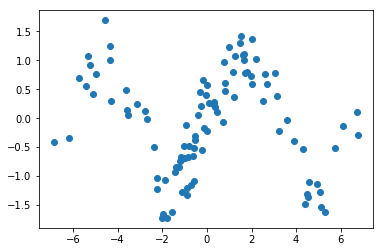

In [111]:
np.random.seed(7)
X = np.random.randn(100)*3
Y = np.sin(X) + np.random.randn(100)*0.4

X = X[:,None]
Y = Y[:,None]

plt.plot(X, Y, 'o')


k = GPy.kern.RBF(1)
m = GPy.models.GPRegression(X, Y, k)
m.optimize()

K = k.K(X, X)

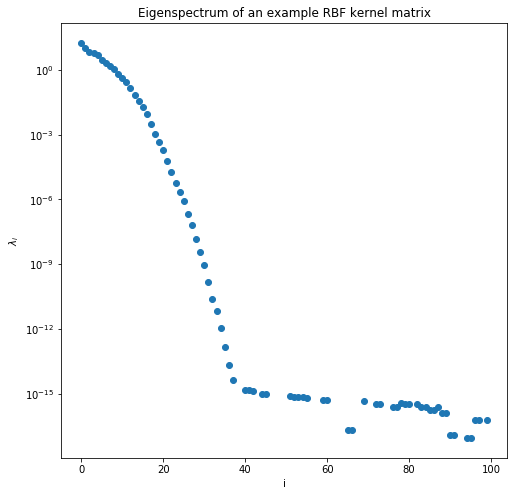

(18.06772881680008+0j)
kappa: 1.0096336406562648e+19


In [192]:
eig, mu = np.linalg.eig(K)

plt.rcParams.update({'font.size': 10})
plt.figure(figsize = (8, 8))
plt.semilogy(eig, 'o')
plt.title('Eigenspectrum of an example RBF kernel matrix')
plt.ylabel(r'$\lambda_i$')
plt.xlabel('i')
plt.show()
print(max(eig))
print('kappa:', np.max(np.abs(eig.real))/np.min(np.abs(eig.real)))


[0.58102361 0.77220951]


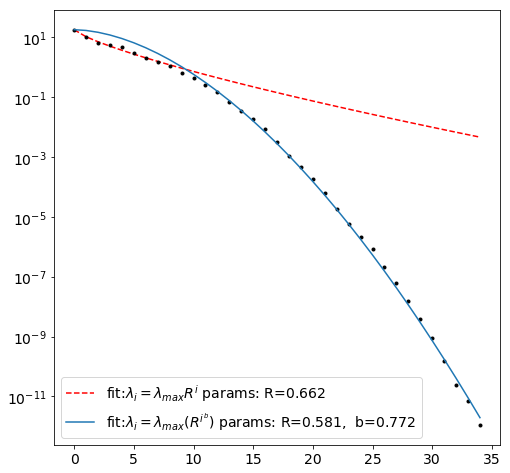

In [113]:
def func_1(x, r):
    return  18.068* r ** x


def func(x, r, b):
    return  18.068* r ** x**b

xdata = np.arange(35)
ydata = eig[:35].real


plt.figure(figsize = (8, 8))
popt_1, pcov_1 = curve_fit(func_1, xdata, ydata)
popt, pcov = curve_fit(func, xdata, ydata)
print(popt)
plt.semilogy(xdata, func(xdata, *popt), 'r--', 
             label  = 'fit:'+r'$\lambda_{i} = \lambda_{max}R^i$ ' +'params: ' + 'R=%5.3f' % popt_1)
plt.semilogy(xdata, ydata, '.k')
plt.plot(xdata, 18.068 * np.exp(-0.05861716 * xdata**1.76753365), 
         label='fit:'+r'$\lambda_{i} = \lambda_{max}(R^{i^b})$ ' +'params: '+ 'R=%5.3f,  b=%5.3f' % tuple(popt))
plt.legend(prop={'size': 14})
plt.show()

In [109]:
def func(x, r, b):
    return  r **x**b

xdata = np.arange(35)
ydata = np.log(eig[:35].real) - np.log(18.068)

popt, pcov = curve_fit(func, xdata, ydata)
print(popt)
plt.plot(xdata, func(xdata, *popt), 'r--',
        label='fit:R r=%5.3f,  b=%5.3f' % tuple(popt))
plt.plot(xdata, ydata, '.k')
plt.legend()
plt.show()

 /home/gawel/anaconda3/envs/MLenv/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning:invalid value encountered in log


ValueError: array must not contain infs or NaNs

18.06772881680008
kappa: 1.0096336406562648e+19


 /home/gawel/anaconda3/envs/MLenv/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning:invalid value encountered in sqrt


resolution to cover all eigenvalues: 63.13046568921157


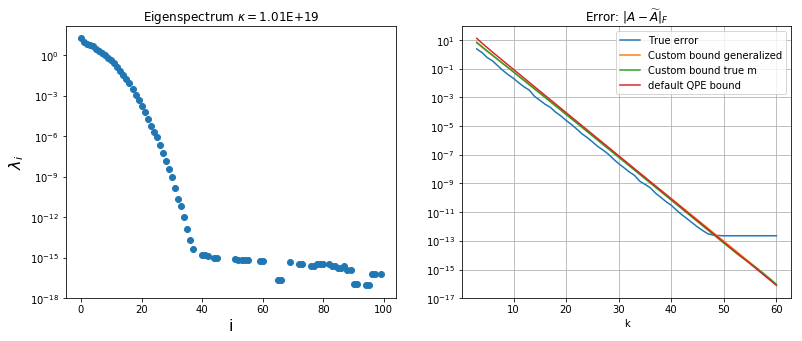

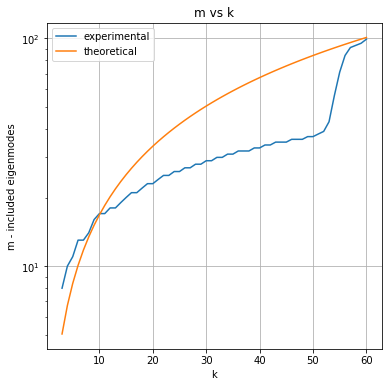

In [18]:
analyse_error(K, 0.66180)

# Conslusions:
- decay is faster than exponential, at least for those sin functions
- the more smooth the function (e.g. less sin waves)-> the faster the eigenspectrum decay -> the lower the R value

# completely random matrices:

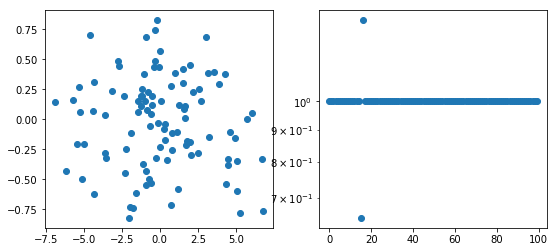

1.3507695465656169
kappa: 2.080570218818514


In [19]:
np.random.seed(7)
X = np.random.randn(100)*3
Y = np.random.randn(100)*0.4

X = X[:,None]
Y = Y[:,None]

plt.figure(figsize = (9 ,4))
plt.subplot(1, 2, 1)
plt.plot(X, Y, 'o')

k = GPy.kern.RBF(1)
k.lengthscale = 0.001

K = k.K(X, X)

eig, mu = np.linalg.eig(K)
plt.subplot(1, 2, 2)

plt.semilogy(eig, 'o')
plt.show()
print(max(eig))
print('kappa:', np.max(np.abs(eig.real))/np.min(np.abs(eig.real)))

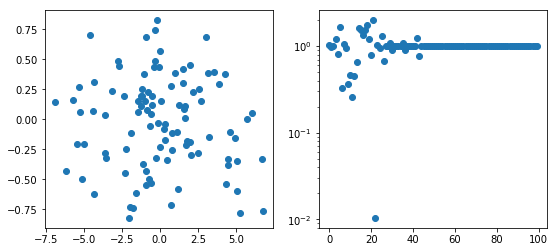

1.99
kappa: r = 1.91E+02


 /home/gawel/anaconda3/envs/MLenv/lib/python3.6/site-packages/ipykernel_launcher.py:22: ComplexWarning:Casting complex values to real discards the imaginary part


In [20]:
np.random.seed(7)
X = np.random.randn(100)*3
Y = np.random.randn(100)*0.4

X = X[:,None]
Y = Y[:,None]

plt.figure(figsize = (9 ,4))
plt.subplot(1, 2, 1)
plt.plot(X, Y, 'o')

k = GPy.kern.RBF(1)
k.lengthscale = 0.01

K = k.K(X, X)

eig, mu = np.linalg.eig(K)
plt.subplot(1, 2, 2)

plt.semilogy(eig, 'o')
plt.show()
print('%.2f' %max(eig))
print('kappa: r = %.2E' %(np.max(np.abs(eig.real))/np.min(np.abs(eig.real))))

5.37
kappa: r = 6.72E+11


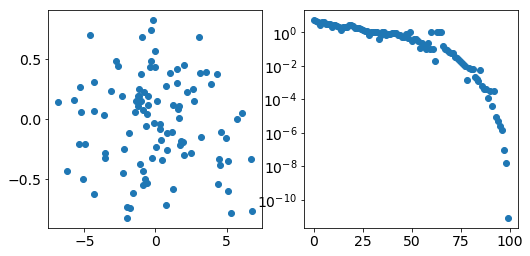

In [44]:
np.random.seed(7)
X = np.random.randn(100)*3
Y = np.random.randn(100)*0.4

X = X[:,None]
Y = Y[:,None]

plt.figure(figsize = (13 ,4))
plt.subplot(1, 3, 1)
plt.plot(X, Y, 'o')

k = GPy.kern.RBF(1)
k.lengthscale = 0.1

K = k.K(X, X)

eig, mu = np.linalg.eig(K)
plt.subplot(1, 3, 2)

plt.semilogy(eig, 'o')
print('%.2f' %max(eig))
print('kappa: r = %.2E' %(np.max(np.abs(eig.real))/np.min(np.abs(eig.real))))

#plt.subplot(1, 3, 3)
#plt.semilogy(eiga, 'o')
#plt.show()


In [ ]:
def func(x, r):
    return  5.37* r ** x

xdata = np.arange(30)
ydata = eig[:30].real

popt, pcov = curve_fit(func, xdata, ydata)
print(popt)
plt.semilogy(xdata, func(xdata, *popt), 'r--',
        label='fit:R r=%5.3f' % tuple(popt))
plt.semilogy(xdata, ydata, '.k')
plt.legend()
plt.show()

In [ ]:
analyse_error(K, 0.9438)

In [ ]:
np.random.seed(7)
X = np.random.randn(100)*3
Y = np.random.randn(100)*0.4

X = X[:,None]
Y = Y[:,None]

plt.figure(figsize = (9 ,4))
plt.subplot(1, 2, 1)
plt.plot(X, Y, 'o')

k = GPy.kern.RBF(1)
k.lengthscale = 1

K = k.K(X, X)

eig, mu = np.linalg.eig(K)
plt.subplot(1, 2, 2)

plt.semilogy(eig, 'o')
plt.show()
print('%.2f' %max(eig))
print('kappa: r = %.2E' %(np.max(np.abs(eig.real))/np.min(np.abs(eig.real))))

In [ ]:
def func(x, r):
    return  31.62* r ** x

xdata = np.arange(35)
ydata = eig[:35].real

popt, pcov = curve_fit(func, xdata, ydata)
print(popt)
plt.semilogy(xdata, func(xdata, *popt), 'r--',
        label='fit:R r=%5.3f' % tuple(popt))
plt.semilogy(xdata, ydata, '.k')
plt.legend()
plt.show()

In [ ]:
analyse_error(K, 0.67737823)

In [ ]:
np.random.seed(7)
X = np.random.randn(100)*3
Y = np.random.randn(100)*0.4

X = X[:,None]
Y = Y[:,None]

plt.figure(figsize = (9 ,4))
plt.subplot(1, 2, 1)
plt.plot(X, Y, 'o')

k = GPy.kern.RBF(1)
k.lengthscale = 10

K = k.K(X, X)

eig, mu = np.linalg.eig(K)
plt.subplot(1, 2, 2)

plt.semilogy(eig, 'o')
plt.show()
print('%.2f' %max(eig))
print('kappa: r = %.2E' %(np.max(np.abs(eig.real))/np.min(np.abs(eig.real))))

In [ ]:
def func(x, r):
    return  92.0* r ** x

xdata = np.arange(15)
ydata = eig[:15].real

popt, pcov = curve_fit(func, xdata, ydata)
print(popt)
plt.semilogy(xdata, func(xdata, *popt), 'r--',
        label='fit:R r=%5.3f' % tuple(popt))
plt.semilogy(xdata, ydata, '.k')
plt.legend()
plt.show()

In [ ]:
analyse_error(K, 0.08058031)

# 3-diagonal matrices - e.g. FEM

In [26]:
import numpy as np
import matplotlib.pyplot as plt
N = 1000
A = np.zeros((N, N))
a = 1e9
b = 1
c = 1e9

A[0, 0] = b
A[0, 1] = c
for i in range(1, N-1):
    A[i, i] = b
    A[i, i+1] = c
    A[i, i-1] = a
A[-1, -1]  =b
A[-1, -2] = a

AH = np.array([[np.zeros((N, N)), A.T], []])

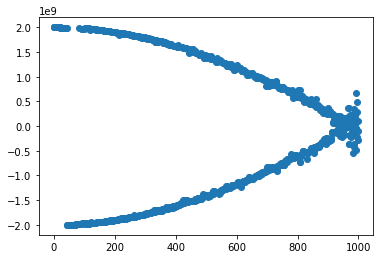

In [27]:
eig, mu = np.linalg.eig(A)
plt.plot(eig.real, 'o')


In [16]:
A

array([[3., 6., 0., ..., 0., 0., 0.],
       [6., 3., 6., ..., 0., 0., 0.],
       [0., 6., 3., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 3., 6., 0.],
       [0., 0., 0., ..., 6., 3., 6.],
       [0., 0., 0., ..., 0., 6., 3.]])